#**Process Analysis** en **Time Series Analysis** BPIC2017

In [ ]:
!pip install pm4py DyLoPro pandas numpy matplotlib seaborn


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 80.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.2/60.2 kB 4.7 MB/s eta 0:00:00
  Created wheel for intervaltree: filename=intervaltree-3.1.0-py2.py3-none-any.whl size=26098 sha256=736b2cd53ffc90d1ce9ed165926bd8c9dd4efa5da3bc2b6bdf5f6fe1f6e2706d
  Stored in directory: /root/.cache/pip/wheels/31/d7/d9/eec6891f78cac19a693bd40ecb8365d2f4613318c145ec9816
Successfully built intervaltree


In [ ]:
from google.colab import files
import pandas as pd
import pm4py

uploaded = files.upload()

df_wt = pd.read_csv("actor_behavior_results.csv", parse_dates=["timestamp_i", "timestamp_j"])
df_wt.head()


/usr/local/lib/python3.11/dist-packages/cudf/utils/_ptxcompiler.py:64: UserWarning: Error getting driver and runtime versions:

stdout:



stderr:

Traceback (most recent call last):
  File "<string>", line 4, in <module>
  File "/usr/local/lib/python3.11/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 314, in __getattr__
    raise CudaSupportError("Error at driver init: \n%s:" %
numba.cuda.cudadrv.error.CudaSupportError: Error at driver init: 

CUDA driver library cannot be found.
If you are sure that a CUDA driver is installed,
try setting environment variable NUMBA_CUDA_DRIVER
with the file path of the CUDA driver shared library.
:


Not patching Numba
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.11/dist-packages/cudf/utils/gpu_utils.py:62: UserWarning: Failed to dlopen libcuda.so.1
  warnings.warn(str(e))


Saving actor_behavior_results.csv to actor_behavior_results.csv


,case_id,event_i,timestamp_i,event_j,timestamp_j,actor_i,actor_j,behavior,delta_t,accepted_i,accepted_j,case_outcome,case_accepted,case_refused,case_canceled,case_start,case_end,tt_days
0,Application_1000158214,A_Create Application,2016-06-02 10:14:26,A_Submitted,2016-06-02 10:14:26,User_1,User_1,C,0.0,NaN,NaN,Accepted,1,0,0,2016-06-02 10:14:26,2016-06-10 11:02:01,8.033044
1,Application_1000158214,A_Submitted,2016-06-02 10:14:26,W_Handle leads,2016-06-02 10:14:27,User_1,User_1,C,1.0,NaN,NaN,Accepted,1,0,0,2016-06-02 10:14:26,2016-06-10 11:02:01,8.033044
2,Application_1000158214,W_Handle leads,2016-06-02 10:14:27,W_Handle leads,2016-06-02 10:15:36,User_1,User_1,C,69.0,NaN,NaN,Accepted,1,0,0,2016-06-02 10:14:26,2016-06-10 11:02:01,8.033044
3,Application_1000158214,W_Handle leads,2016-06-02 10:15:36,W_Complete application,2016-06-02 10:15:36,User_1,User_1,C,0.0,NaN,NaN,Accepted,1,0,0,2016-06-02 10:14:26,2016-06-10 11:02:01,8.033044
4,Application_1000158214,W_Complete application,2016-06-02 10:15:36,A_Concept,2016-06-02 10:15:36,User_1,User_1,C,0.0,NaN,NaN,Accepted,1,0,0,2016-06-02 10:14:26,2016-06-10 11:02:01,8.033044


In [ ]:
#column names for DyLoPro
df_wt.rename(columns={"case_id": "case:concept:name",
                       "event_i": "concept:name",
                       "timestamp_i": "time:timestamp","accepted_i":"accepted",
                      "case:outcome":"case:outcome","case_accepted":"case_accepted", "case_canceled":"case_canceled", "case_refused":"case_refused", "tt_days": "TT"}, inplace=True)


In [ ]:
print(df_wt.head())  
print(df_wt.columns)  


        case:concept:name            concept:name      time:timestamp  \
0  Application_1000158214    A_Create Application 2016-06-02 10:14:26   
1  Application_1000158214             A_Submitted 2016-06-02 10:14:26   
2  Application_1000158214          W_Handle leads 2016-06-02 10:14:27   
3  Application_1000158214          W_Handle leads 2016-06-02 10:15:36   
4  Application_1000158214  W_Complete application 2016-06-02 10:15:36   

                  event_j         timestamp_j actor_i actor_j behavior  \
0             A_Submitted 2016-06-02 10:14:26  User_1  User_1        C   
1          W_Handle leads 2016-06-02 10:14:27  User_1  User_1        C   
2          W_Handle leads 2016-06-02 10:15:36  User_1  User_1        C   
3  W_Complete application 2016-06-02 10:15:36  User_1  User_1        C   
4               A_Concept 2016-06-02 10:15:36  User_1  User_1        C   

   delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
0      0.0      NaN        NaN     Accep

#How many cases per behavior type

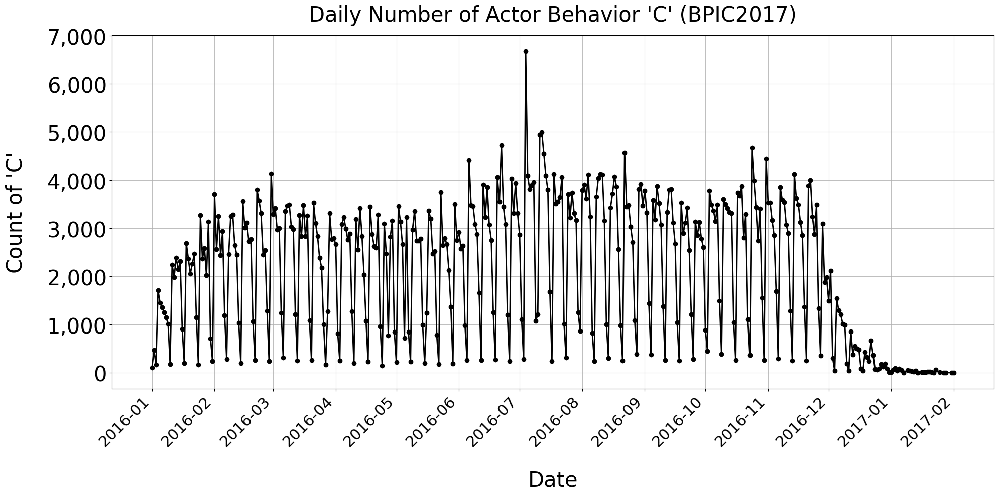

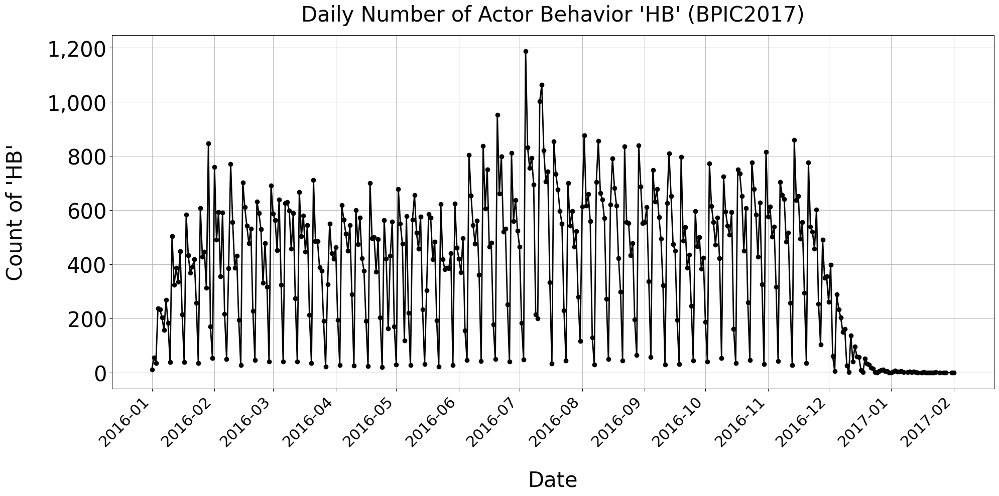

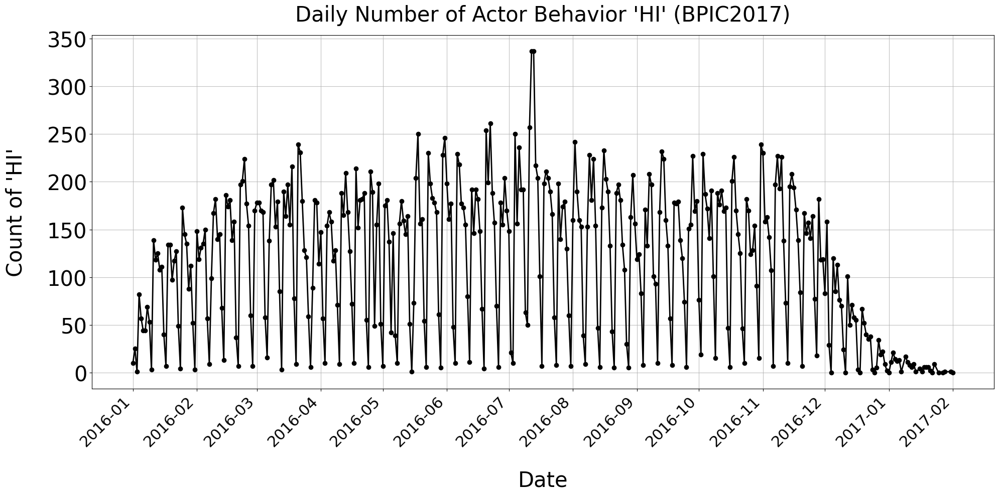

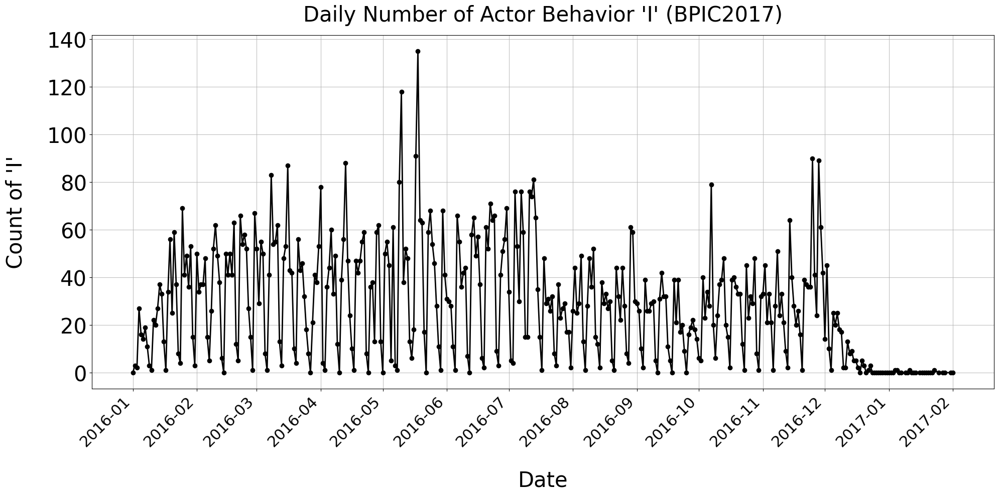

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

df = pd.read_csv("actor_behavior_results.csv")

# Convert timestamp to datetime
df['timestamp_i'] = pd.to_datetime(df['timestamp_i'])

# Rename 'HD' to 'HB'
df['behavior'] = df['behavior'].replace('HD', 'HB')

# Group by day and behavior type, count occurrences
behavior_daily = df.groupby([
    df['timestamp_i'].dt.to_period('D').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Get 4 behaviors
top_behaviors = df['behavior'].value_counts().head(4).index.tolist()

# Plot each behavior
for behavior in top_behaviors:
    plt.figure(figsize=(20, 10))  
    behavior_daily[behavior].plot(marker='o', color='black', linewidth=2)

    
    plt.title(f"Daily Number of Actor Behavior '{behavior}' (BPIC2017)", fontsize=30, pad=20)
    plt.xlabel("Date", fontsize=30, labelpad=30)
    plt.ylabel(f"Count of '{behavior}'", fontsize=30, labelpad=30)

    plt.xticks(rotation=45, fontsize=22)
    plt.yticks(fontsize=30)

    plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))

    plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: f"{int(x):,}"))

    plt.grid(True, which='major', linestyle='-', linewidth=0.8, alpha=0.8)
    plt.grid(True, which='minor', linestyle='--', linewidth=0.4, alpha=0.5)

    plt.tight_layout()

    # Save the figure with high resolution
    plt.savefig(f"{behavior}_bpic2017_large.png", dpi=300)

    plt.show()



per user

User 1

        case:concept:name            concept:name      time:timestamp  \
0  Application_1000158214    A_Create Application 2016-06-02 10:14:26   
1  Application_1000158214             A_Submitted 2016-06-02 10:14:26   
2  Application_1000158214          W_Handle leads 2016-06-02 10:14:27   
3  Application_1000158214          W_Handle leads 2016-06-02 10:15:36   
4  Application_1000158214  W_Complete application 2016-06-02 10:15:36   

                  event_j         timestamp_j actor_i actor_j behavior  \
0             A_Submitted 2016-06-02 10:14:26  User_1  User_1        C   
1          W_Handle leads 2016-06-02 10:14:27  User_1  User_1        C   
2          W_Handle leads 2016-06-02 10:15:36  User_1  User_1        C   
3  W_Complete application 2016-06-02 10:15:36  User_1  User_1        C   
4               A_Concept 2016-06-02 10:15:36  User_1  User_1        C   

   delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
0      0.0      NaN        NaN     Accep

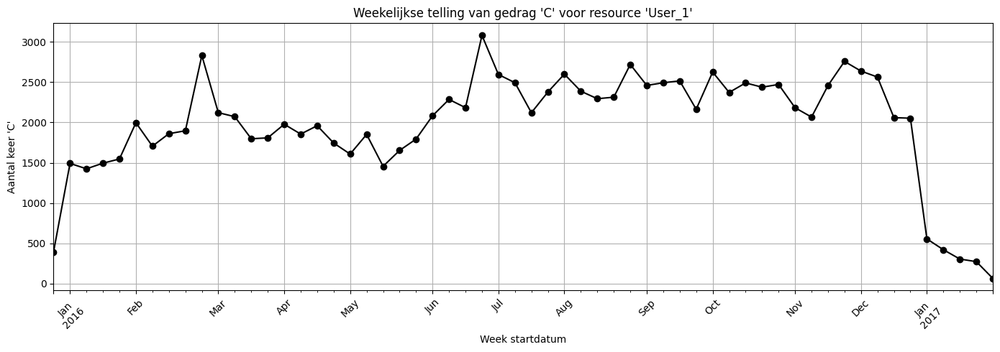

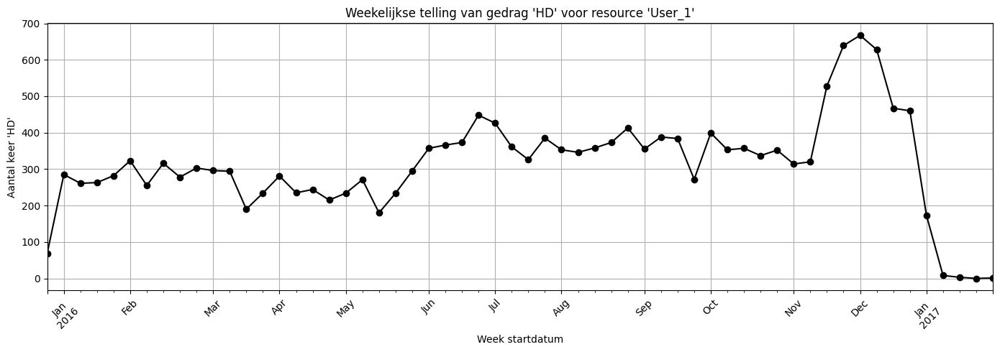

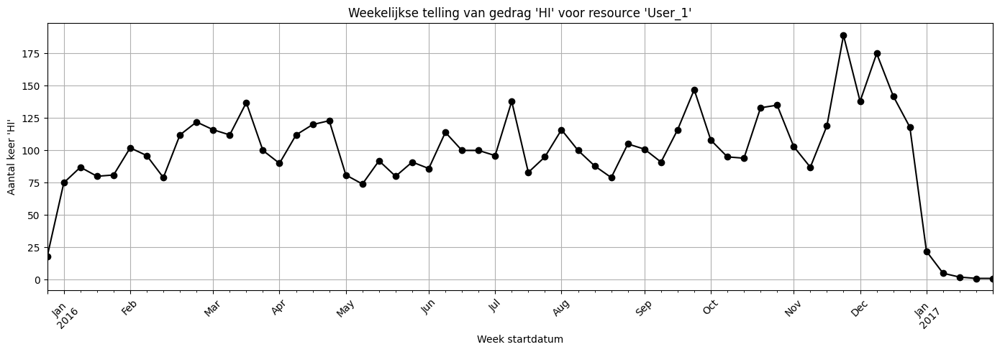

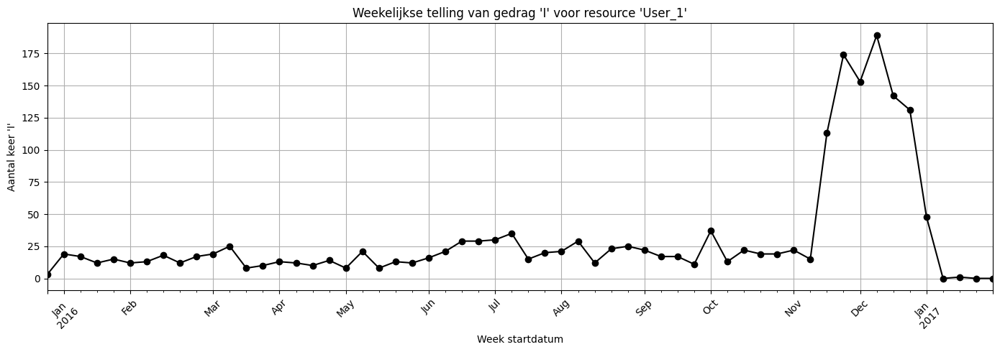

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Select rows where resource= "User_1"
df_user1 = df_wt[df_wt['actor_i'] == 'User_1'].copy()

# check
print(df_user1.head())

# Group per week
behavior_weekly_user1 = df_user1.groupby([
    df_user1['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# select the 4 behaviors
top_behaviors_user1 = df_user1['behavior'].value_counts().head(4).index.tolist()

# visualize
for behavior in top_behaviors_user1:
    plt.figure(figsize=(14, 5))
    behavior_weekly_user1[behavior].plot(marker='o', color='black')
    plt.title(f"Weekly number of behavior '{behavior}' for resource 'User_1'")
    plt.xlabel("Start date weekly")
    plt.ylabel(f"Number of '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


user 5

          case:concept:name            concept:name      time:timestamp  \
387  Application_1009956698     W_Call after offers 2016-06-14 06:42:05   
388  Application_1009956698     W_Call after offers 2016-06-14 06:42:30   
502  Application_1012036369     W_Call after offers 2016-06-21 06:41:20   
503  Application_1012036369     W_Call after offers 2016-06-21 06:42:04   
651  Application_1014808270  W_Complete application 2016-06-16 10:07:06   

                    event_j         timestamp_j actor_i   actor_j behavior  \
387     W_Call after offers 2016-06-14 06:42:30  User_5    User_5        C   
388  W_Validate application 2016-06-21 10:14:06  User_5  User_123       HD   
502     W_Call after offers 2016-06-21 06:42:04  User_5    User_5        C   
503     W_Call after offers 2016-06-21 06:42:21  User_5   User_45       HI   
651  W_Complete application 2016-06-16 10:08:34  User_5    User_5        C   

      delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
3

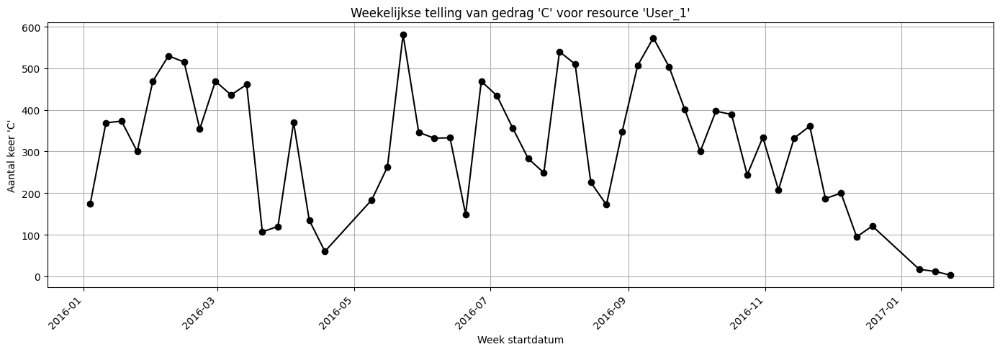

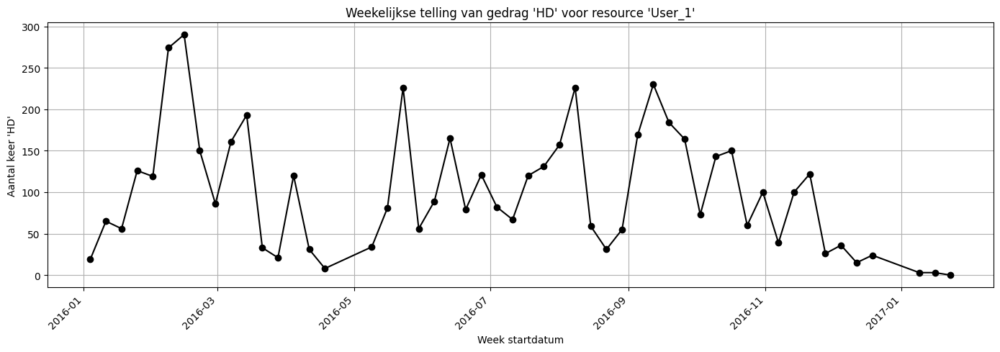

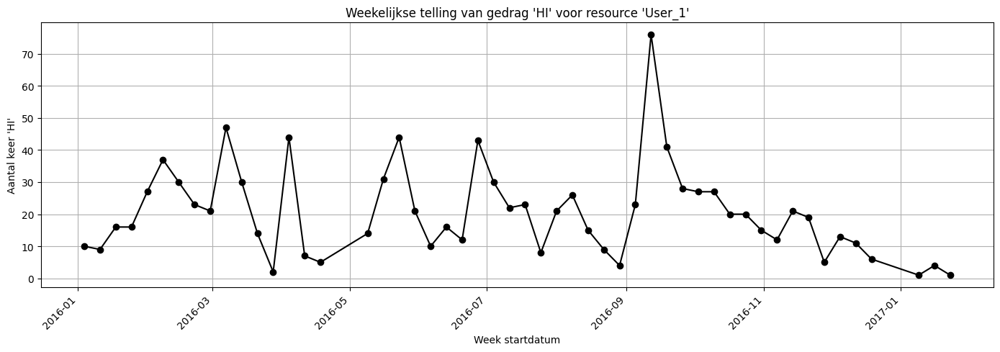

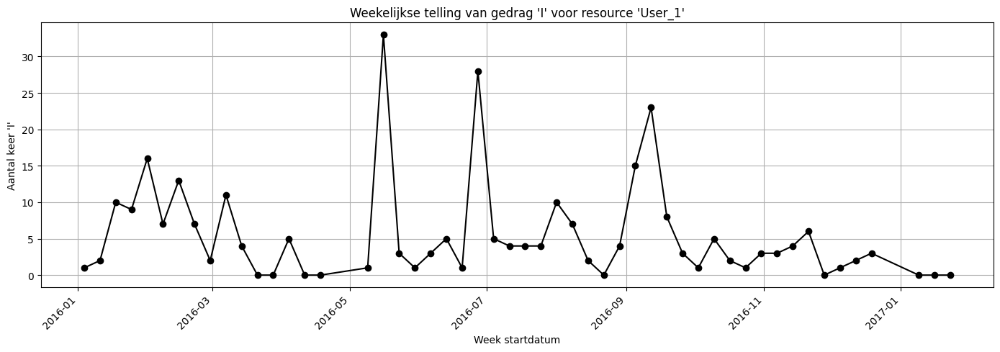

In [ ]:
# Select rows where resource= "User_5"
df_user5 = df_wt[df_wt['actor_i'] == 'User_5'].copy()

print(df_user5.head())

behavior_weekly_user5 = df_user1.groupby([
    df_user5['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

top_behaviors_user1 = df_user5['behavior'].value_counts().head(4).index.tolist()

for behavior in top_behaviors_user1:
    plt.figure(figsize=(14, 5))
    behavior_weekly_user1[behavior].plot(marker='o', color='black')
    plt.title(f"Weekly number of behavior '{behavior}' for resource 'User_5'")
    plt.xlabel("Start date weekly")
    plt.ylabel(f"Number of '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

user 2

          case:concept:name             concept:name      time:timestamp  \
216  Application_1006372947  W_Call incomplete files 2016-06-27 07:31:46   
217  Application_1006372947  W_Call incomplete files 2016-06-27 07:32:48   
835   Application_101548356  W_Call incomplete files 2016-06-06 14:05:14   
836   Application_101548356             A_Validating 2016-06-06 14:12:08   
837   Application_101548356  W_Call incomplete files 2016-06-06 14:12:08   

                     event_j         timestamp_j actor_i   actor_j behavior  \
216  W_Call incomplete files 2016-06-27 07:32:48  User_2    User_2        C   
217             A_Validating 2016-06-28 09:21:18  User_2  User_123       HI   
835             A_Validating 2016-06-06 14:12:08  User_2    User_2        C   
836  W_Call incomplete files 2016-06-06 14:12:08  User_2    User_2        C   
837   W_Validate application 2016-06-06 14:12:08  User_2    User_2        C   

     delta_t accepted accepted_j case_outcome  case_accepted  case_r

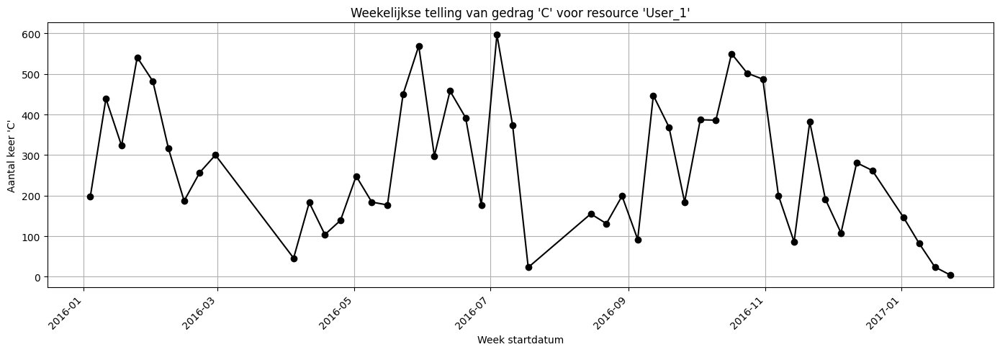

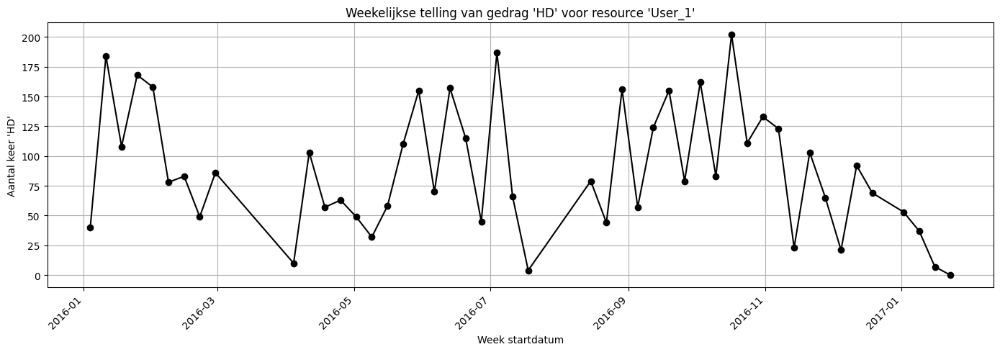

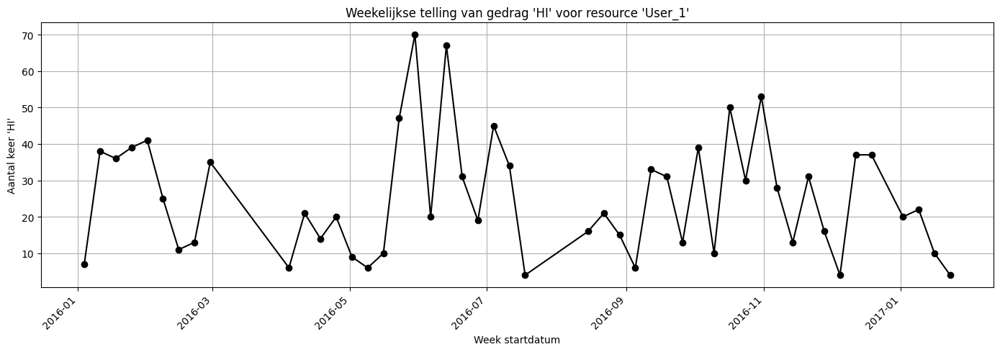

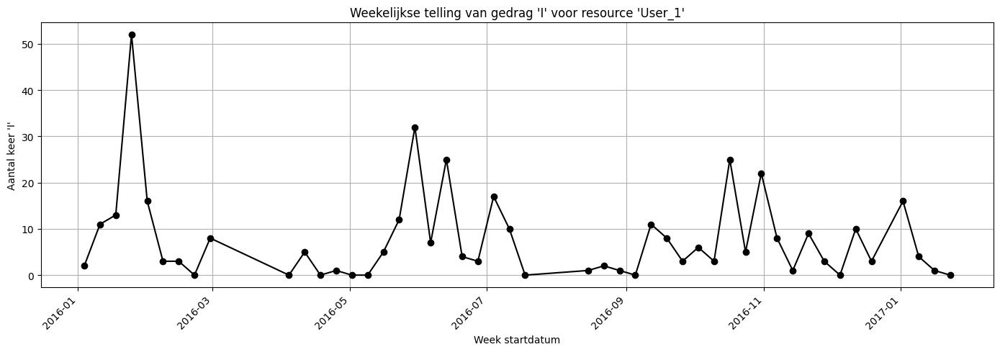

In [ ]:
# Select rows where resource="User_2"
df_user2 = df_wt[df_wt['actor_i'] == 'User_2'].copy()

print(df_user2.head())

behavior_weekly_user2 = df_user2.groupby([
    df_user2['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

top_behaviors_user1 = df_user2['behavior'].value_counts().head(4).index.tolist()

for behavior in top_behaviors_user2:
    plt.figure(figsize=(14, 5))
    behavior_weekly_user1[behavior].plot(marker='o', color='black')
    plt.title(f"Weekly number of behavior  '{behavior}' for resource 'User_2'")
    plt.xlabel("Start date weekly")
    plt.ylabel(f"Number of  '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

user 3

          case:concept:name              concept:name      time:timestamp  \
93   Application_1003568418       W_Call after offers 2016-06-08 07:30:40   
94   Application_1003568418       W_Call after offers 2016-06-08 07:31:09   
127  Application_1005586643  O_Sent (mail and online) 2016-05-26 16:27:41   
128  Application_1005586643    W_Complete application 2016-05-26 16:27:41   
129  Application_1005586643       W_Call after offers 2016-05-26 16:27:41   

                    event_j         timestamp_j actor_i actor_j behavior  \
93      W_Call after offers 2016-06-08 07:31:09  User_3  User_3        C   
94              O_Cancelled 2016-07-05 06:00:25  User_3  User_1       HI   
127  W_Complete application 2016-05-26 16:27:41  User_3  User_3        C   
128     W_Call after offers 2016-05-26 16:27:41  User_3  User_3        C   
129     W_Call after offers 2016-05-26 16:27:41  User_3  User_3        C   

       delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \


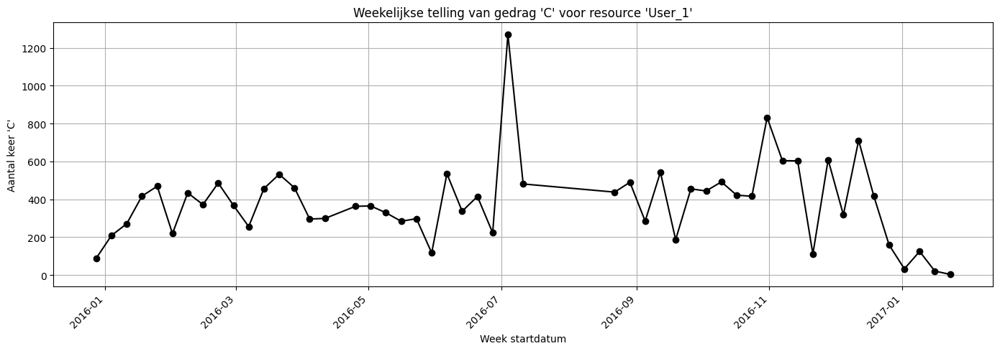

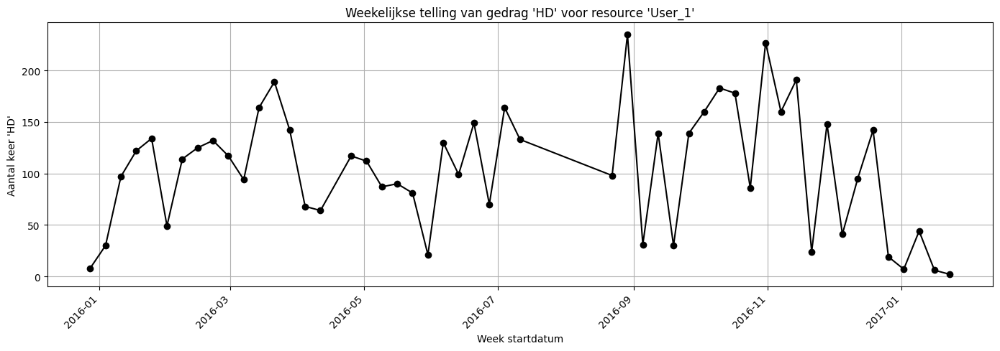

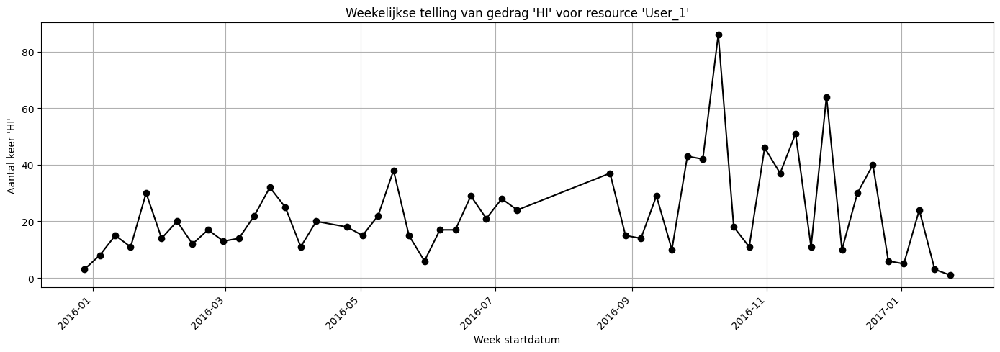

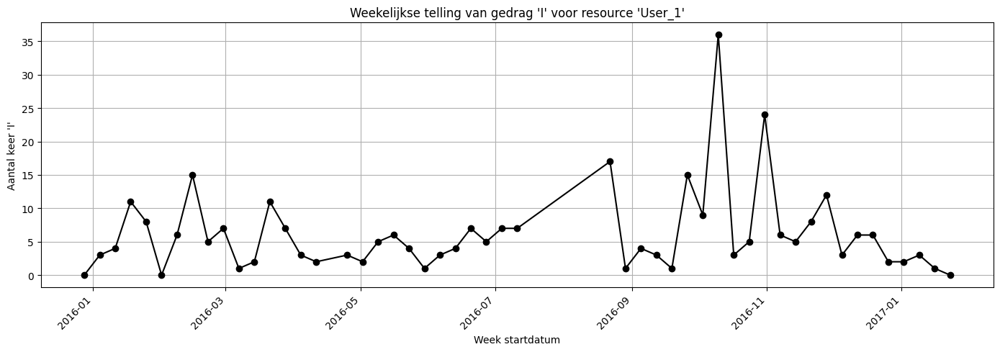

In [ ]:
# Select rows where resource= "User_3"
df_user3 = df_wt[df_wt['actor_i'] == 'User_3'].copy()

print(df_user3.head())

behavior_weekly_user3 = df_user1.groupby([
    df_user1['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

top_behaviors_user3 = df_user1['behavior'].value_counts().head(4).index.tolist()

for behavior in top_behaviors_user3:
    plt.figure(figsize=(14, 5))
    behavior_weekly_user1[behavior].plot(marker='o', color='black')
    plt.title(f"Weekly number of behavior '{behavior}' for resource 'User_3'")
    plt.xlabel("Start date weekly")
    plt.ylabel(f"Number of  '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

user 49

         case:concept:name            concept:name      time:timestamp  \
83  Application_1003568418  W_Complete application 2016-06-04 13:22:48   
84  Application_1003568418              A_Accepted 2016-06-04 13:27:53   
85  Application_1003568418          O_Create Offer 2016-06-04 13:29:31   
86  Application_1003568418               O_Created 2016-06-04 13:29:32   
87  Application_1003568418              A_Complete 2016-06-04 13:29:47   

                     event_j         timestamp_j  actor_i  actor_j behavior  \
83                A_Accepted 2016-06-04 13:27:53  User_49  User_49        C   
84            O_Create Offer 2016-06-04 13:29:31  User_49  User_49        C   
85                 O_Created 2016-06-04 13:29:32  User_49  User_49        C   
86                A_Complete 2016-06-04 13:29:47  User_49  User_49        C   
87  O_Sent (mail and online) 2016-06-04 13:29:47  User_49  User_49        C   

    delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
83 

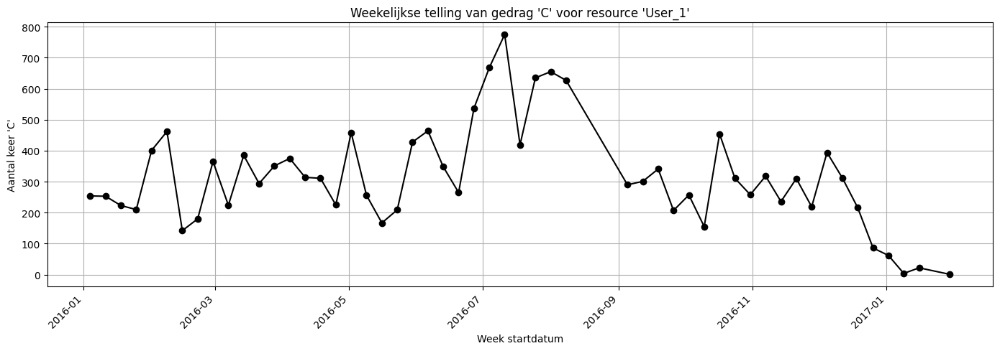

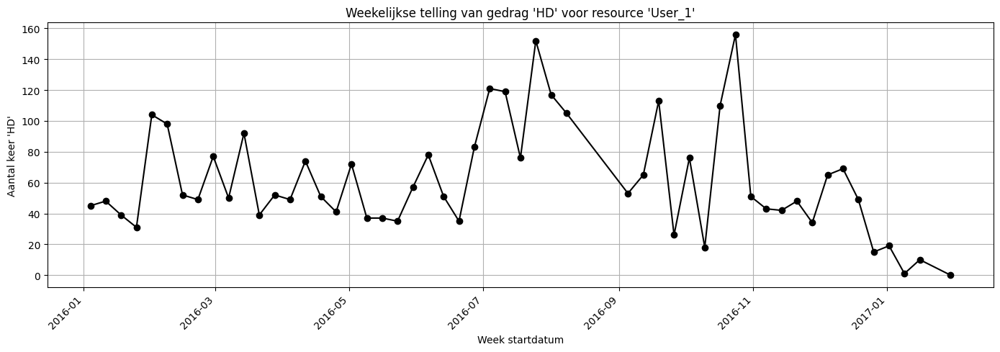

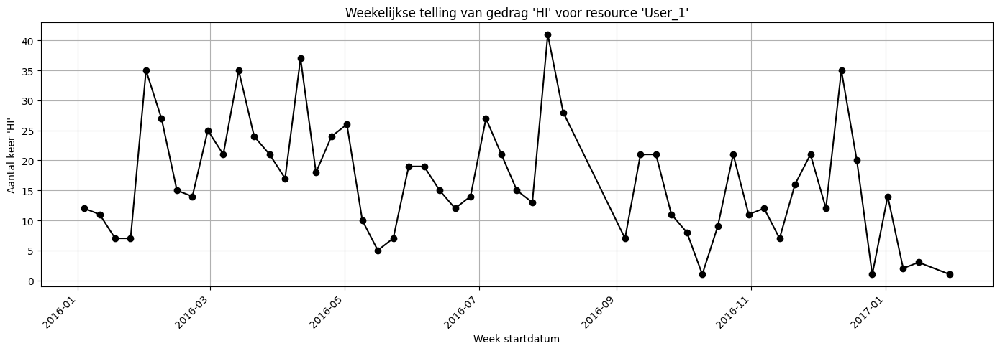

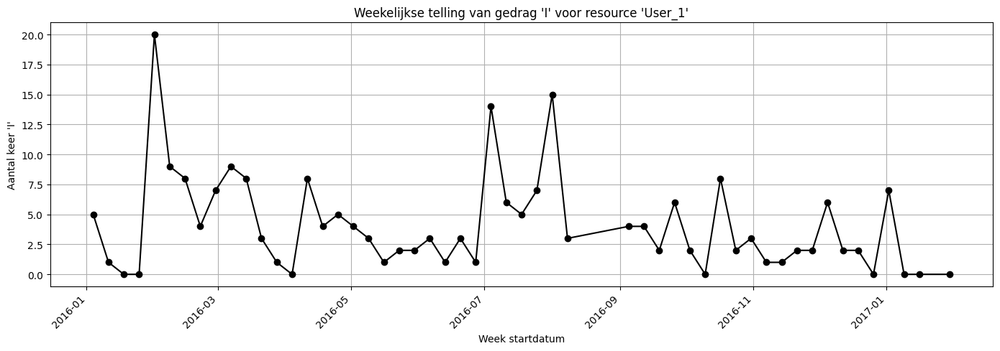

In [ ]:
# Select rows where resource= "User_49"
df_user49 = df_wt[df_wt['actor_i'] == 'User_49'].copy()

print(df_user49.head())

behavior_weekly_user1 = df_user1.groupby([
    df_user1['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

top_behaviors_user49 = df_user49['behavior'].value_counts().head(4).index.tolist()

for behavior in top_behaviors_user49:
    plt.figure(figsize=(14, 5))
    behavior_weekly_user1[behavior].plot(marker='o', color='black')
    plt.title(f"Weeklu number of behavior '{behavior}' for resource 'User_49'")
    plt.xlabel("Start date weekly")
    plt.ylabel(f"Number of '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

user 53

           case:concept:name            concept:name      time:timestamp  \
582   Application_1012880100  W_Complete application 2016-06-13 09:17:47   
583   Application_1012880100  W_Complete application 2016-06-13 09:19:55   
892    Application_101604435  W_Complete application 2016-06-09 12:40:36   
893    Application_101604435  W_Complete application 2016-06-09 12:41:29   
1136  Application_1017661250  W_Complete application 2016-06-07 12:25:39   

                     event_j         timestamp_j  actor_i  actor_j behavior  \
582   W_Complete application 2016-06-13 09:19:55  User_53  User_53        C   
583               A_Accepted 2016-06-13 09:35:29  User_53  User_13       HI   
892   W_Complete application 2016-06-09 12:41:29  User_53  User_53        C   
893   W_Complete application 2016-06-09 13:18:30  User_53  User_49       HI   
1136  W_Complete application 2016-06-07 12:27:21  User_53  User_53        C   

      delta_t accepted accepted_j case_outcome  case_accepted  case_

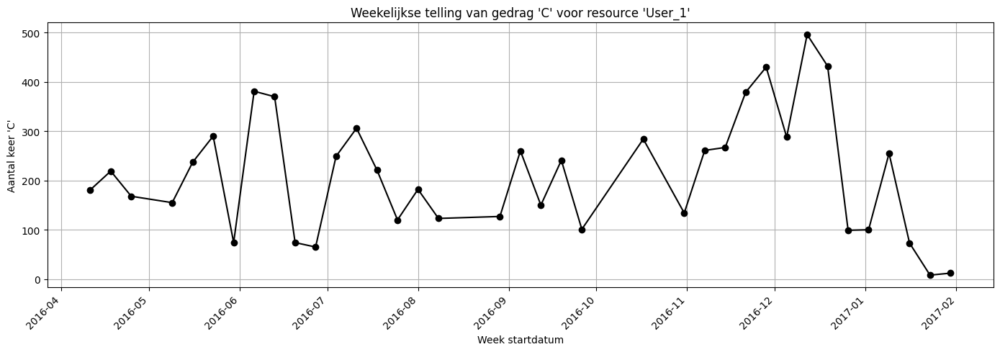

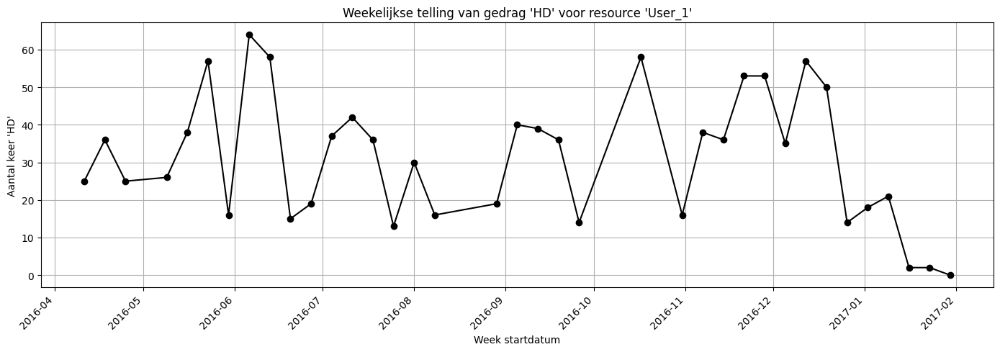

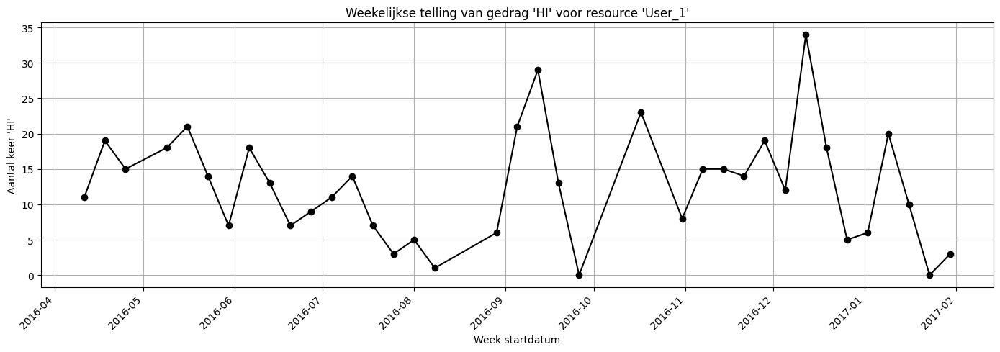

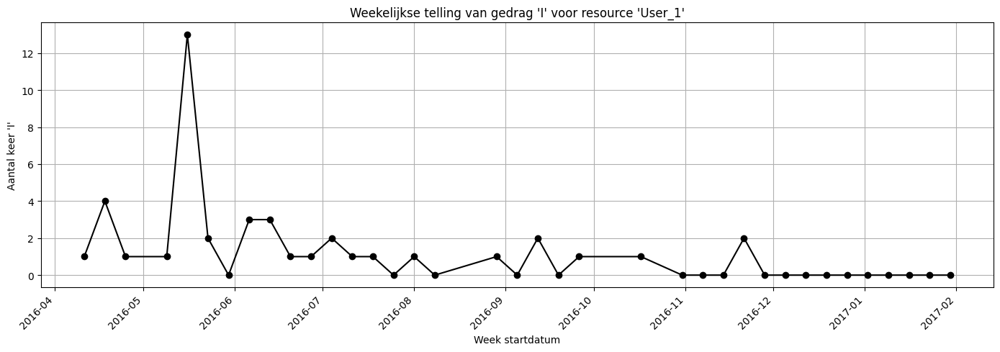

In [ ]:
# Select rows where resource= "User_53"
df_user53 = df_wt[df_wt['actor_i'] == 'User_53'].copy()

print(df_user53.head())

behavior_weekly_user53 = df_user53.groupby([
    df_user53['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

top_behaviors_user53 = df_user1['behavior'].value_counts().head(4).index.tolist()

for behavior in top_behaviors_user53:
    plt.figure(figsize=(14, 5))
    behavior_weekly_user1[behavior].plot(marker='o', color='black')
    plt.title(f"Weekly number of behavior'{behavior}' fpr resource 'User_53'")
    plt.xlabel("Start date weekly")
    plt.ylabel(f"Number of '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

Per activity

         case:concept:name            concept:name      time:timestamp  \
17  Application_1000158214  W_Validate application 2016-06-09 09:54:35   
18  Application_1000158214  W_Validate application 2016-06-09 09:54:35   
21  Application_1000158214  W_Validate application 2016-06-09 09:56:08   
23  Application_1000158214  W_Validate application 2016-06-10 11:02:01   
42  Application_1000806256  W_Validate application 2016-06-15 09:40:15   

                   event_j         timestamp_j   actor_i   actor_j behavior  \
17  W_Validate application 2016-06-09 09:54:35  User_118  User_118        C   
18            A_Validating 2016-06-09 09:54:36  User_118  User_118        C   
21               A_Pending 2016-06-10 11:02:01  User_118   User_90       HI   
23              O_Accepted 2016-06-10 11:02:01   User_90   User_90        C   
42  W_Validate application 2016-06-15 09:40:15  User_121  User_121        C   

    delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
17 

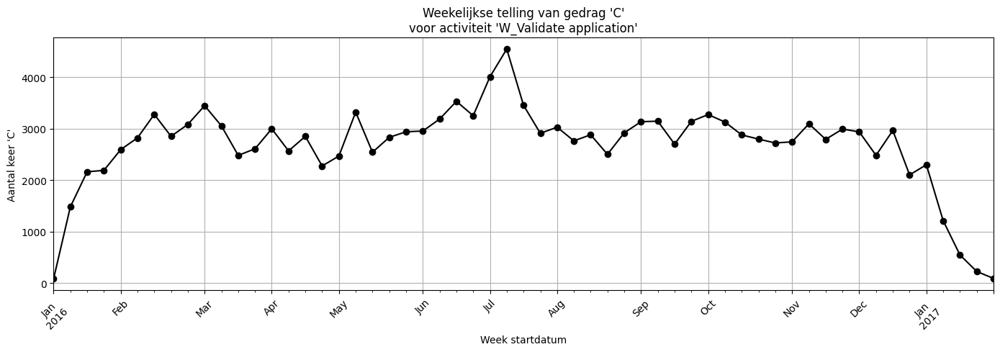

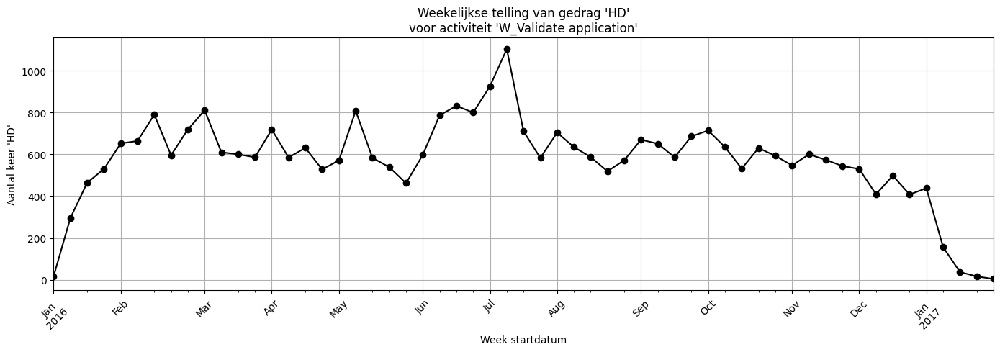

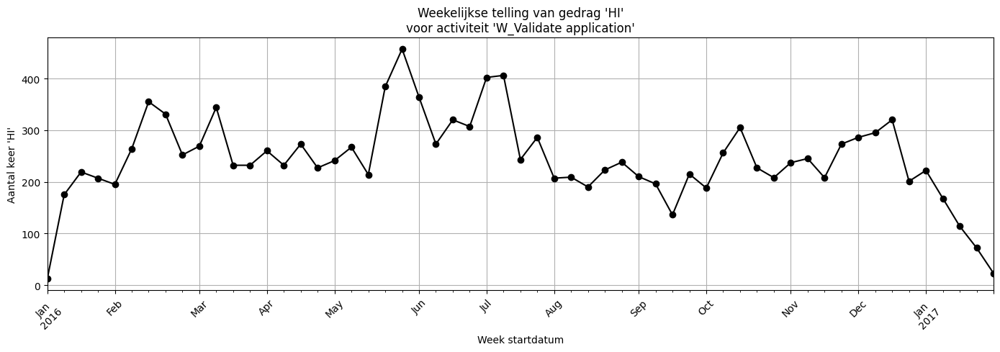

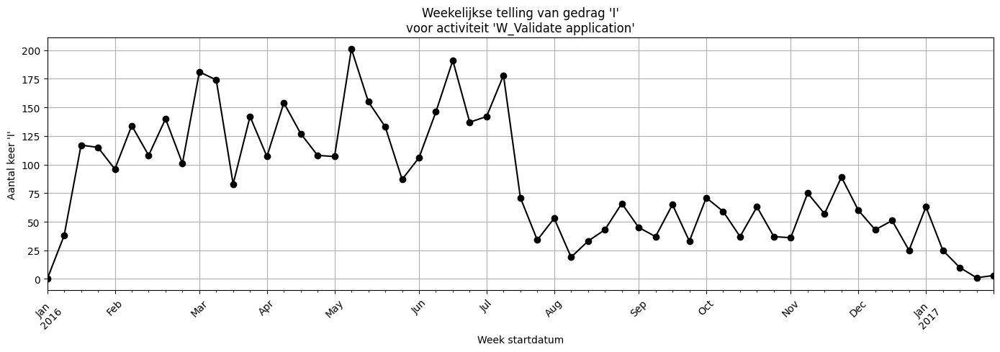

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "W_Validate application"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

         case:concept:name         concept:name      time:timestamp  \
11  Application_1000158214  W_Call after offers 2016-06-06 08:16:46   
12  Application_1000158214  W_Call after offers 2016-06-06 08:16:46   
15  Application_1000158214  W_Call after offers 2016-06-06 08:18:42   
16  Application_1000158214  W_Call after offers 2016-06-09 09:54:35   
33  Application_1000806256  W_Call after offers 2016-06-01 10:42:51   

                     event_j         timestamp_j   actor_i   actor_j behavior  \
11       W_Call after offers 2016-06-06 08:16:46   User_32   User_32        C   
12    W_Complete application 2016-06-06 08:16:46   User_32   User_32        C   
15       W_Call after offers 2016-06-09 09:54:35   User_32  User_118       HI   
16    W_Validate application 2016-06-09 09:54:35  User_118  User_118        C   
33  O_Sent (mail and online) 2016-06-01 10:42:51    User_4    User_4        C   

     delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
11      

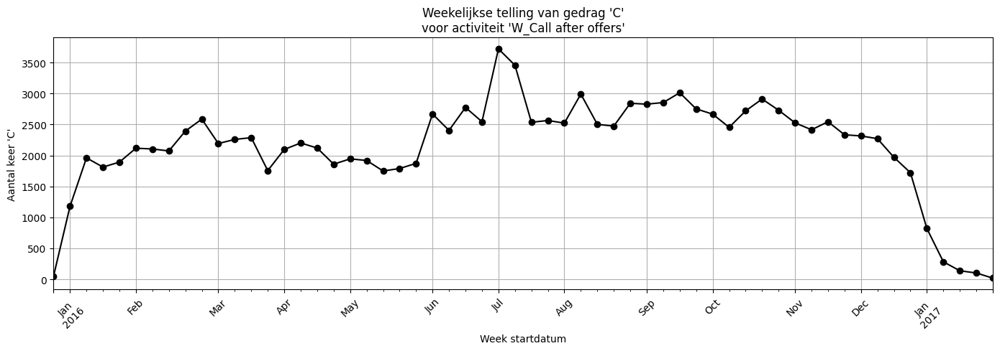

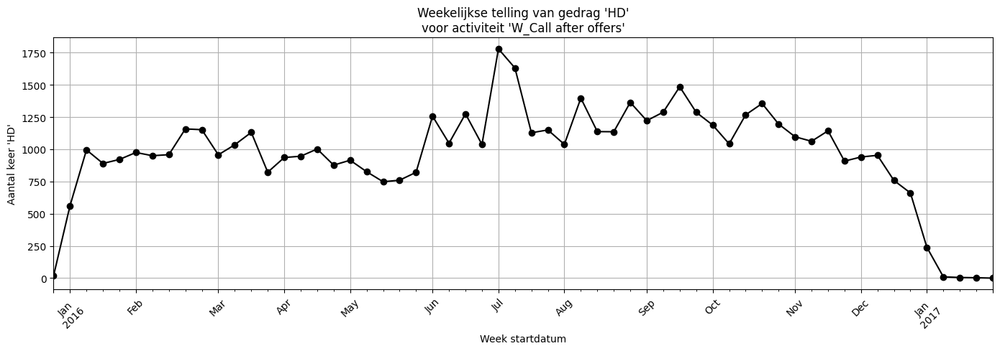

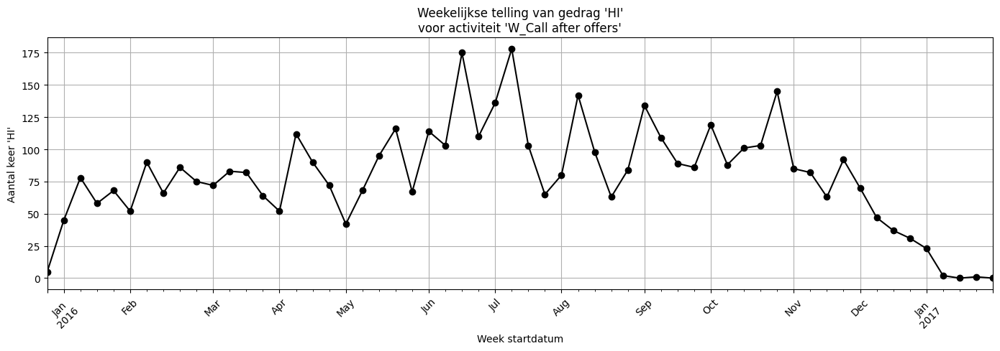

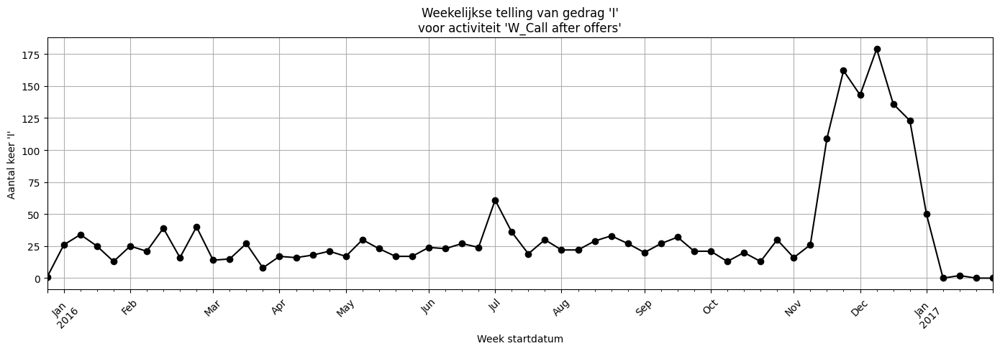

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "W_Call after offers"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name             concept:name      time:timestamp  \
210  Application_1006372947  W_Call incomplete files 2016-06-23 10:30:19   
211  Application_1006372947  W_Call incomplete files 2016-06-23 10:30:19   
213  Application_1006372947  W_Call incomplete files 2016-06-23 10:32:03   
214  Application_1006372947  W_Call incomplete files 2016-06-23 12:49:51   
215  Application_1006372947  W_Call incomplete files 2016-06-23 12:54:29   

                     event_j         timestamp_j  actor_i  actor_j behavior  \
210  W_Call incomplete files 2016-06-23 10:30:19  User_68  User_68        C   
211   W_Validate application 2016-06-23 10:30:19  User_68  User_68        C   
213  W_Call incomplete files 2016-06-23 12:49:51  User_68  User_37       HI   
214  W_Call incomplete files 2016-06-23 12:54:29  User_37  User_37        C   
215  W_Call incomplete files 2016-06-27 07:31:46  User_37   User_2       HI   

      delta_t accepted accepted_j case_outcome  case_accepted  case_

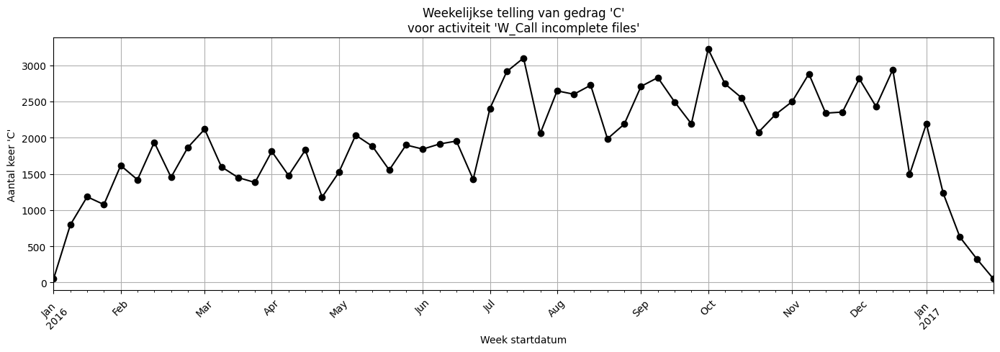

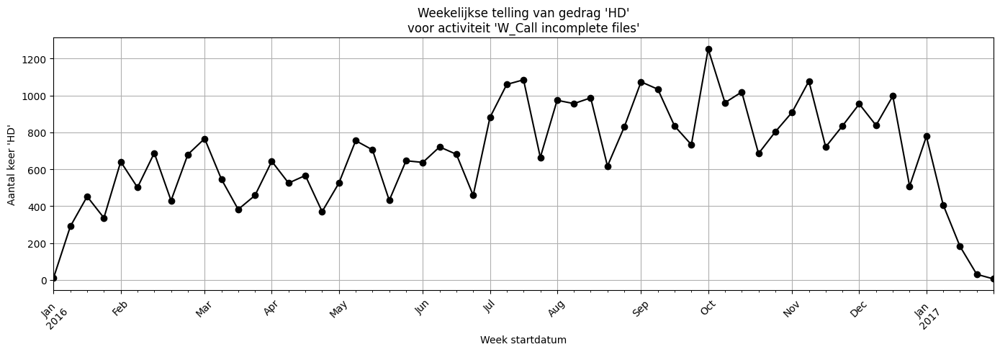

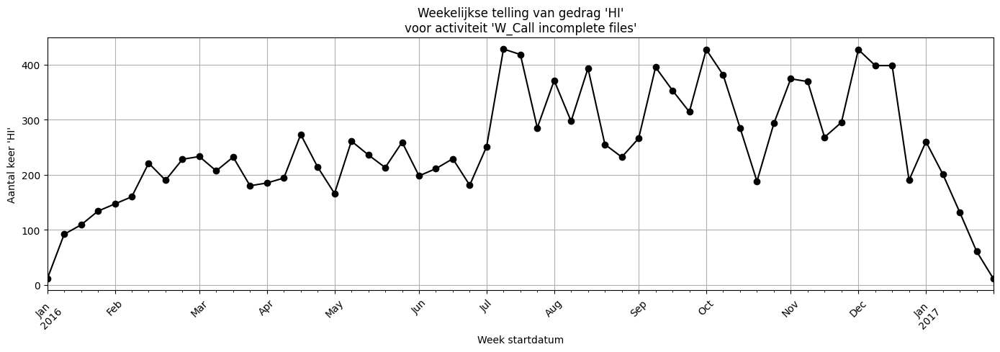

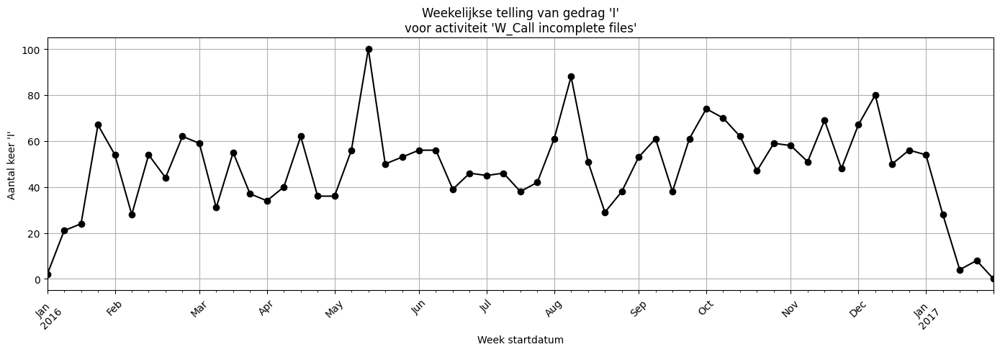

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "W_Call incomplete files"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

         case:concept:name            concept:name      time:timestamp  \
4   Application_1000158214  W_Complete application 2016-06-02 10:15:36   
6   Application_1000158214  W_Complete application 2016-06-06 08:02:16   
13  Application_1000158214  W_Complete application 2016-06-06 08:16:46   
24  Application_1000806256  W_Complete application 2016-06-01 09:03:46   
26  Application_1000806256  W_Complete application 2016-06-01 09:03:46   

                     event_j         timestamp_j  actor_i  actor_j behavior  \
4                  A_Concept 2016-06-02 10:15:36   User_1   User_1        C   
6                 A_Accepted 2016-06-06 08:10:07  User_32  User_32        C   
13  O_Sent (mail and online) 2016-06-06 08:16:46  User_32  User_32        C   
24                 A_Concept 2016-06-01 09:03:46   User_4   User_4        C   
26      A_Create Application 2016-06-01 09:03:46   User_4   User_4        C   

    delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
4  

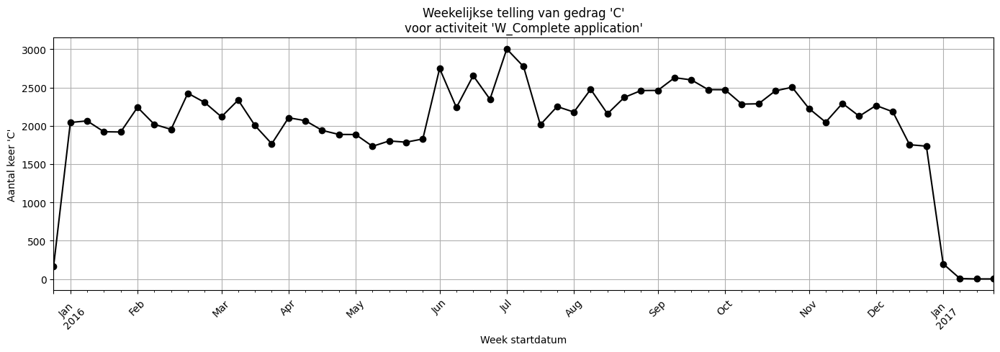

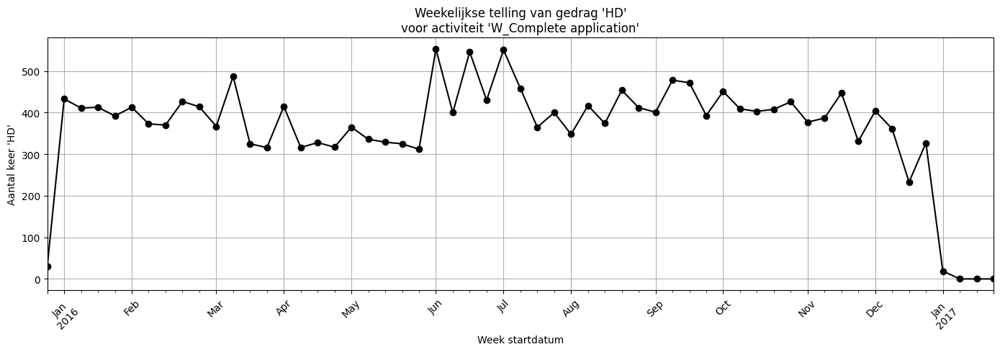

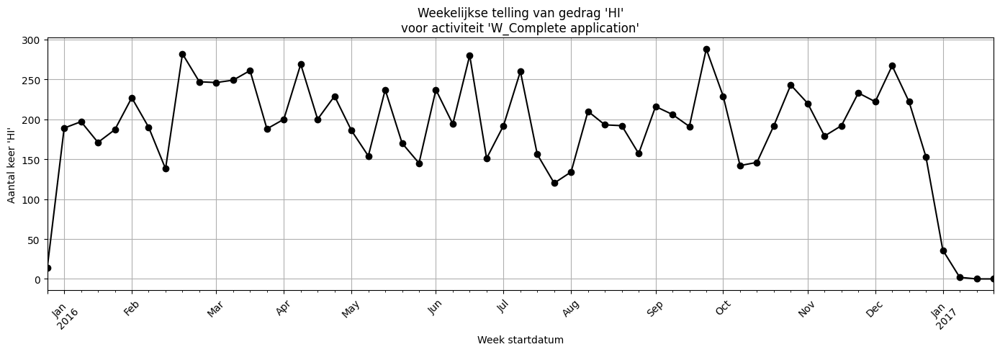

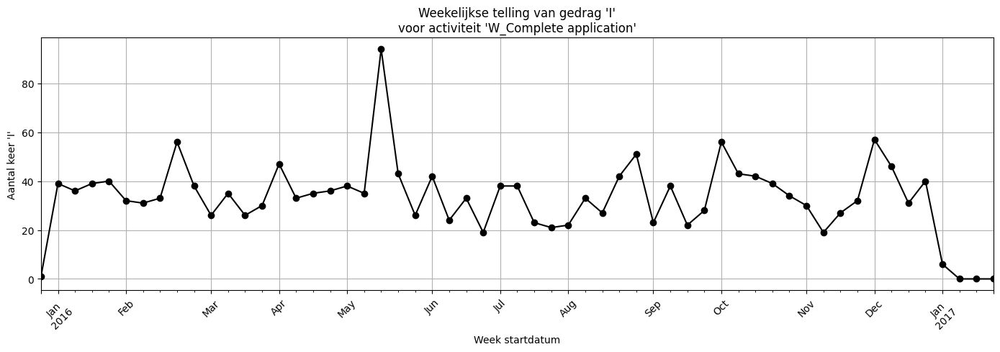

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "W_Complete application"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name    concept:name      time:timestamp  \
2    Application_1000158214  W_Handle leads 2016-06-02 10:14:27   
3    Application_1000158214  W_Handle leads 2016-06-02 10:15:36   
79   Application_1003568418  W_Handle leads 2016-06-01 19:55:34   
80   Application_1003568418  W_Handle leads 2016-06-01 19:56:18   
147  Application_1006058240  W_Handle leads 2016-06-03 11:34:40   

                    event_j         timestamp_j actor_i actor_j behavior  \
2            W_Handle leads 2016-06-02 10:15:36  User_1  User_1        C   
3    W_Complete application 2016-06-02 10:15:36  User_1  User_1        C   
79           W_Handle leads 2016-06-01 19:56:18  User_1  User_1        C   
80   W_Complete application 2016-06-01 19:56:18  User_1  User_1        C   
147          W_Handle leads 2016-06-03 11:35:37  User_1  User_1        C   

     delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
2       69.0      NaN        NaN     Accepted              1  

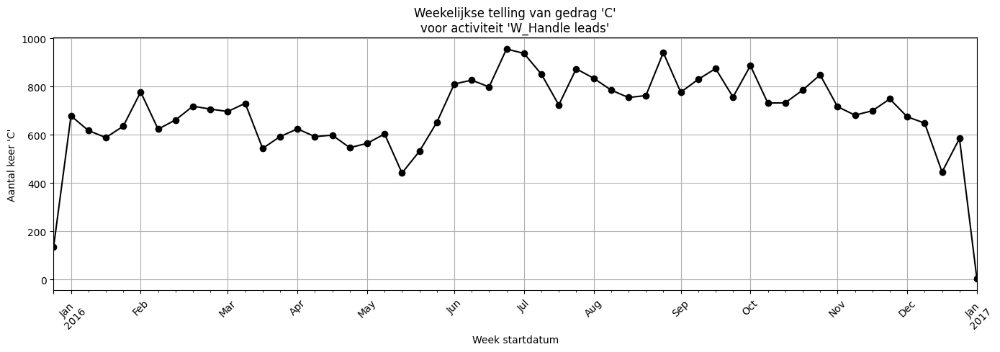

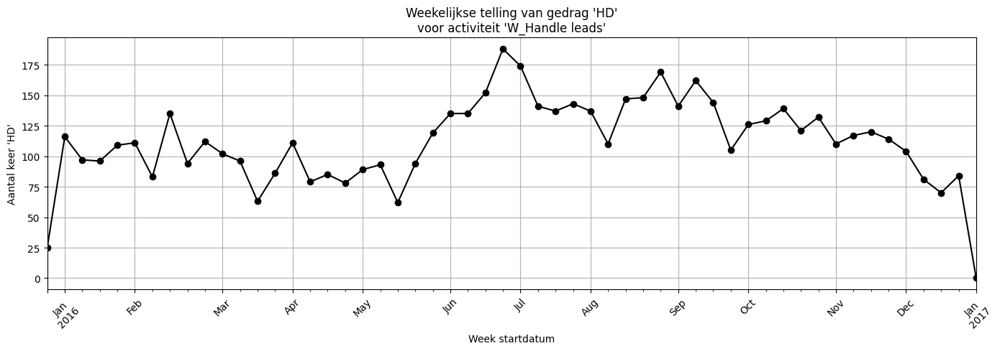

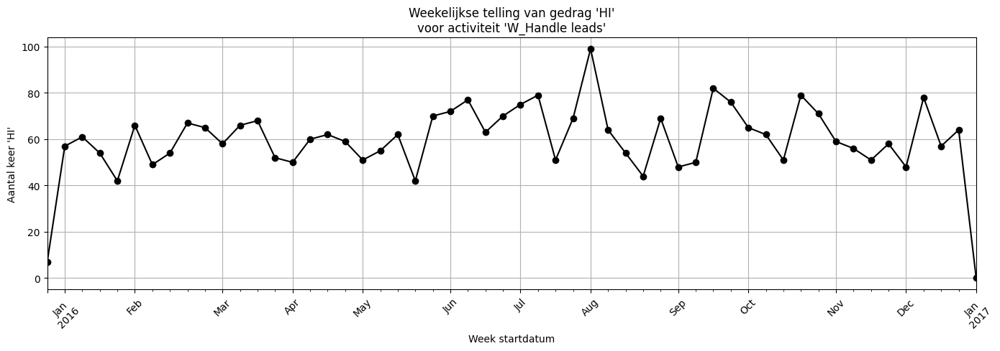

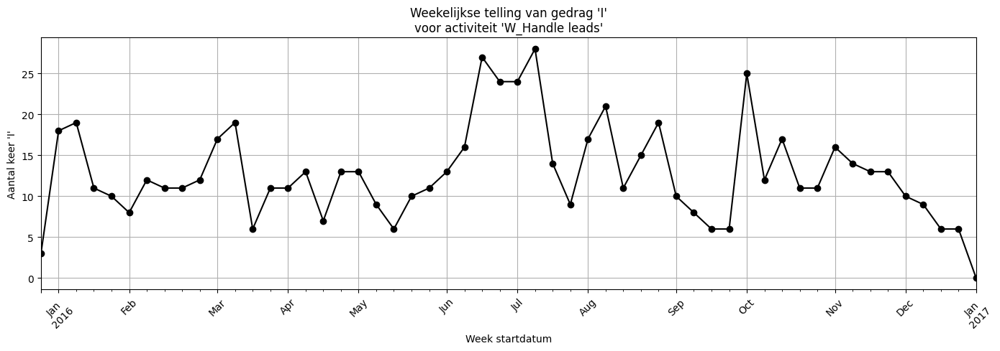

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "W_Handle leads"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name    concept:name      time:timestamp    event_j  \
8    Application_1000158214  O_Create Offer 2016-06-06 08:12:02  O_Created   
31   Application_1000806256  O_Create Offer 2016-06-01 10:42:09  O_Created   
59   Application_1002324382  O_Create Offer 2016-06-01 11:37:38  O_Created   
85   Application_1003568418  O_Create Offer 2016-06-04 13:29:31  O_Created   
103  Application_1005003910  O_Create Offer 2016-06-06 18:33:57  O_Created   

            timestamp_j  actor_i  actor_j behavior  delta_t accepted  \
8   2016-06-06 08:12:03  User_32  User_32        C      1.0     True   
31  2016-06-01 10:42:10   User_4   User_4        C      1.0     True   
59  2016-06-01 11:37:39  User_51  User_51        C      1.0    False   
85  2016-06-04 13:29:32  User_49  User_49        C      1.0     True   
103 2016-06-06 18:33:58  User_76  User_76        C      1.0    False   

    accepted_j case_outcome  case_accepted  case_refused  case_canceled  
8          NaN     Accep

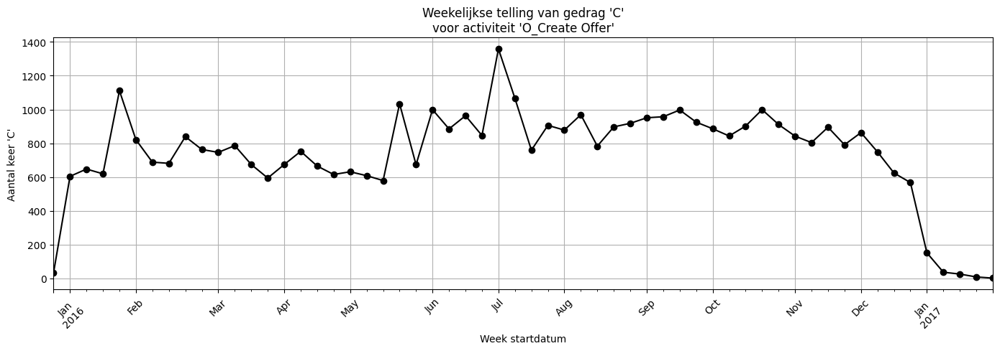

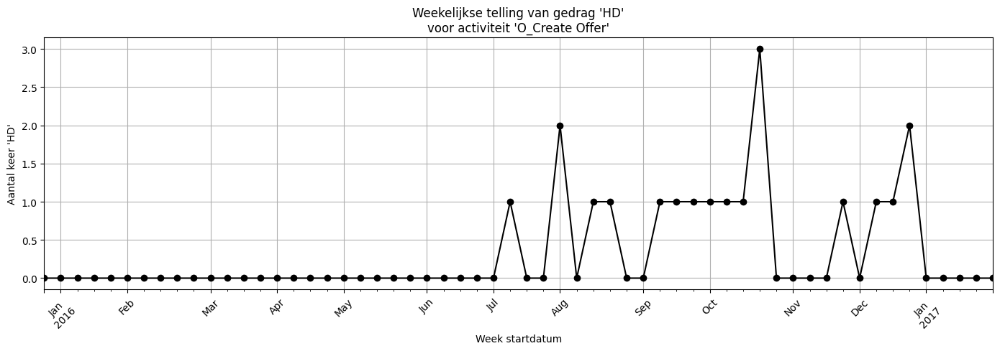

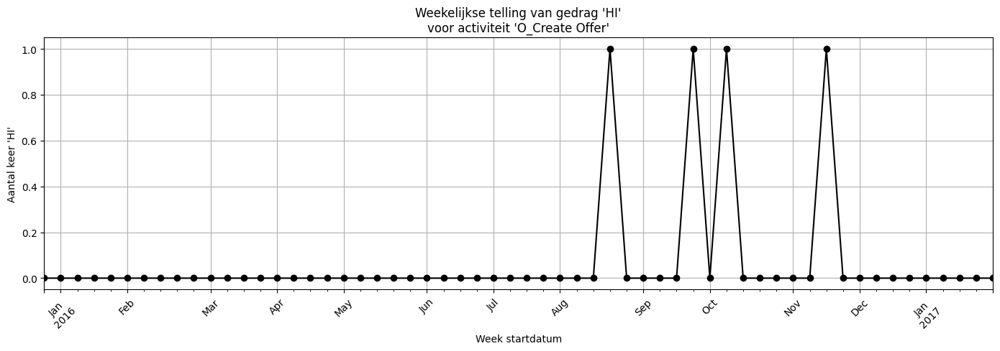

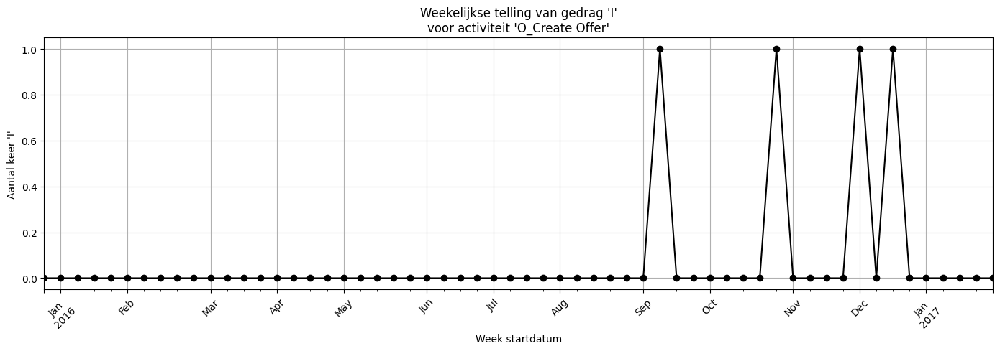

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "O_Create Offer"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name concept:name      time:timestamp  \
9    Application_1000158214    O_Created 2016-06-06 08:12:03   
32   Application_1000806256    O_Created 2016-06-01 10:42:10   
60   Application_1002324382    O_Created 2016-06-01 11:37:39   
86   Application_1003568418    O_Created 2016-06-04 13:29:32   
104  Application_1005003910    O_Created 2016-06-06 18:33:58   

                    event_j         timestamp_j  actor_i  actor_j behavior  \
9                A_Complete 2016-06-06 08:16:46  User_32  User_32        C   
32      W_Call after offers 2016-06-01 10:42:51   User_4   User_4        C   
60   W_Complete application 2016-06-01 11:38:53  User_51  User_51        C   
86               A_Complete 2016-06-04 13:29:47  User_49  User_49        C   
104  W_Complete application 2016-06-06 18:36:12  User_76  User_76        C   

     delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
9      283.0      NaN        NaN     Accepted              1        

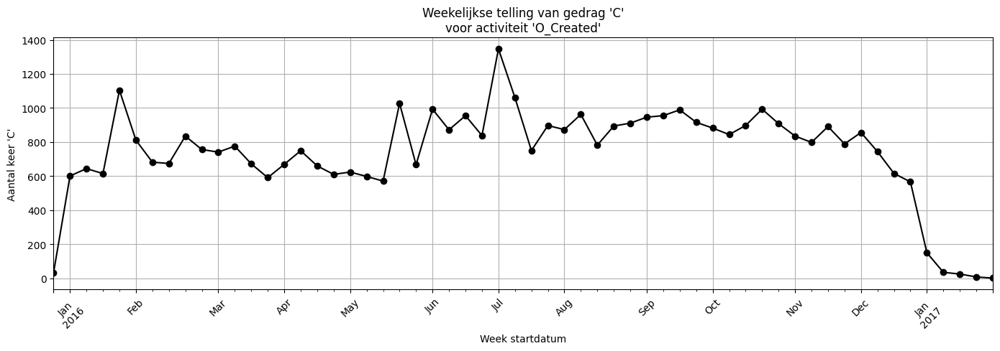

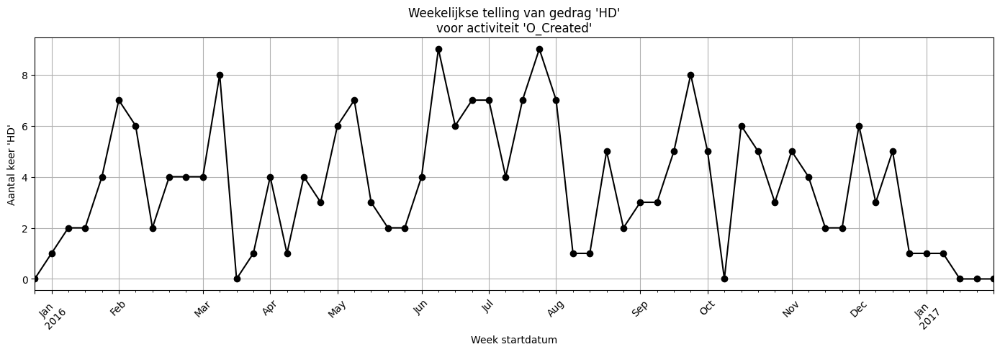

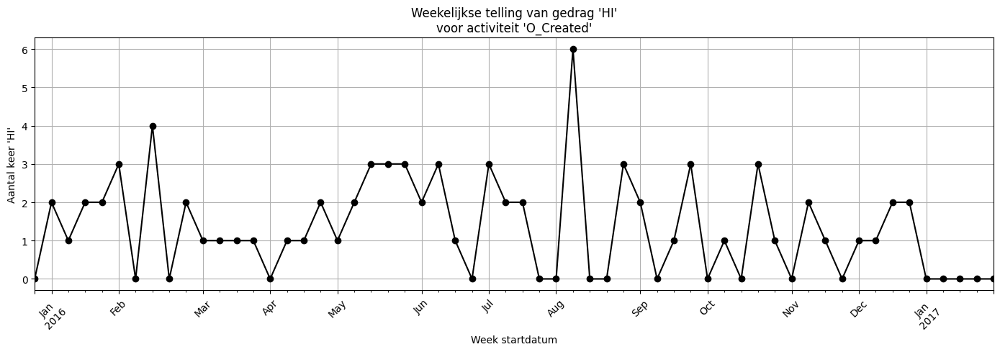

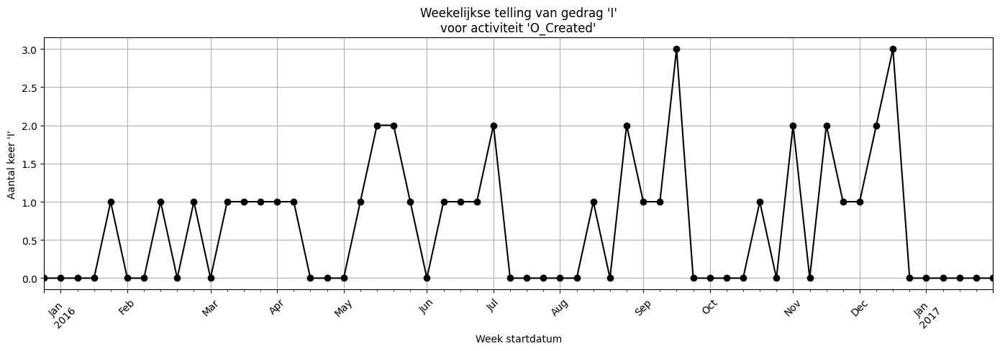

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "O_Created"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name              concept:name      time:timestamp  \
14   Application_1000158214  O_Sent (mail and online) 2016-06-06 08:16:46   
34   Application_1000806256  O_Sent (mail and online) 2016-06-01 10:42:51   
62   Application_1002324382  O_Sent (mail and online) 2016-06-01 11:38:53   
88   Application_1003568418  O_Sent (mail and online) 2016-06-04 13:29:47   
106  Application_1005003910  O_Sent (mail and online) 2016-06-06 18:36:12   

                    event_j         timestamp_j  actor_i  actor_j behavior  \
14      W_Call after offers 2016-06-06 08:18:42  User_32  User_32        C   
34   W_Complete application 2016-06-01 10:42:51   User_4   User_4        C   
62      W_Call after offers 2016-06-01 11:38:53  User_51  User_51        C   
88   W_Complete application 2016-06-04 13:29:47  User_49  User_49        C   
106     W_Call after offers 2016-06-06 18:36:12  User_76  User_76        C   

     delta_t accepted accepted_j case_outcome  case_accepted  case_r

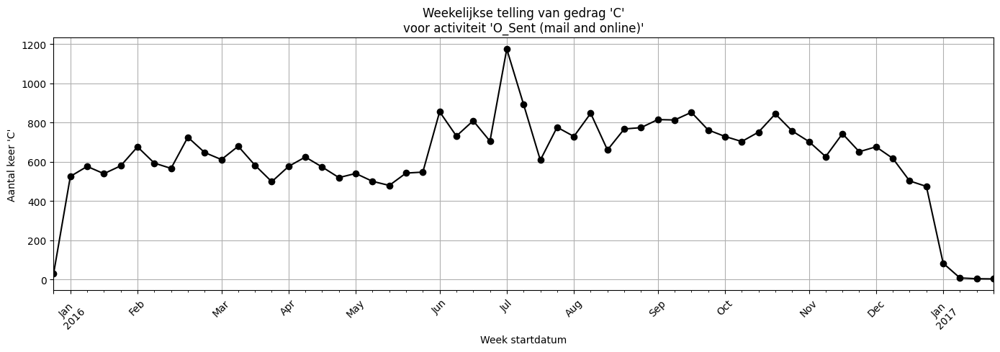

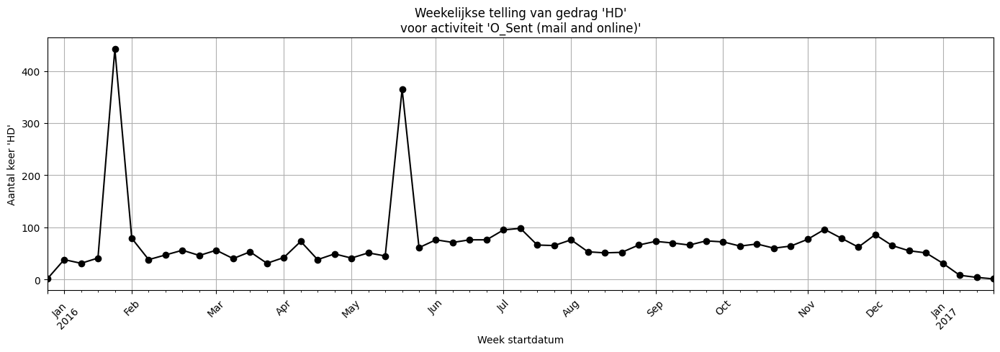

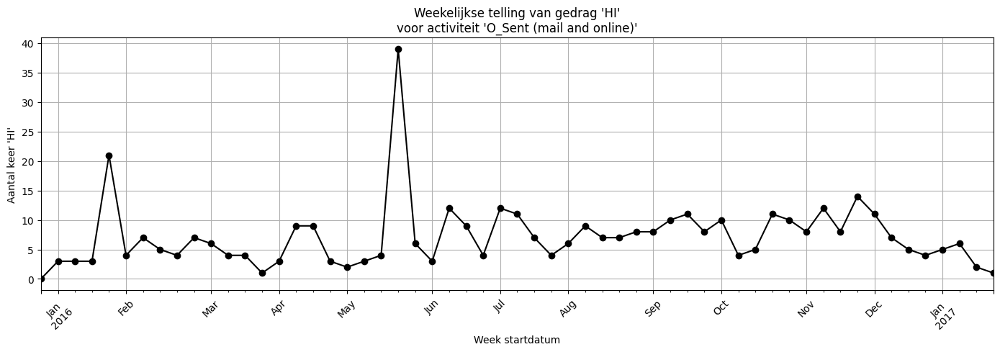

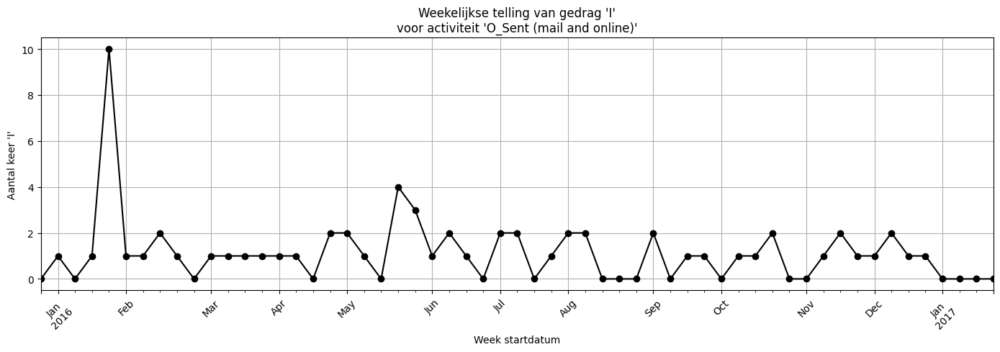

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "O_Sent (mail and online)"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name  concept:name      time:timestamp  \
19   Application_1000158214  A_Validating 2016-06-09 09:54:36   
44   Application_1000806256  A_Validating 2016-06-15 09:40:16   
69   Application_1002324382  A_Validating 2016-06-08 11:07:10   
112  Application_1005003910  A_Validating 2016-06-10 08:39:05   
140  Application_1005586643  A_Validating 2016-06-02 10:50:35   

                    event_j         timestamp_j   actor_i   actor_j behavior  \
19               O_Returned 2016-06-09 09:55:13  User_118  User_118        C   
44               O_Returned 2016-06-15 09:40:21  User_121  User_121        C   
69      W_Call after offers 2016-06-08 11:07:10  User_113  User_113        C   
112  W_Validate application 2016-06-10 08:39:05  User_122  User_122        C   
140              O_Returned 2016-06-02 10:51:25  User_116  User_116        C   

     delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
19      37.0      NaN        NaN     Accepted     

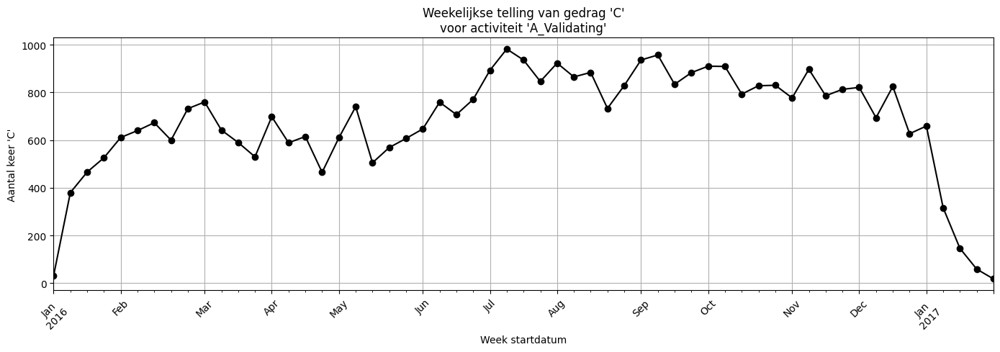

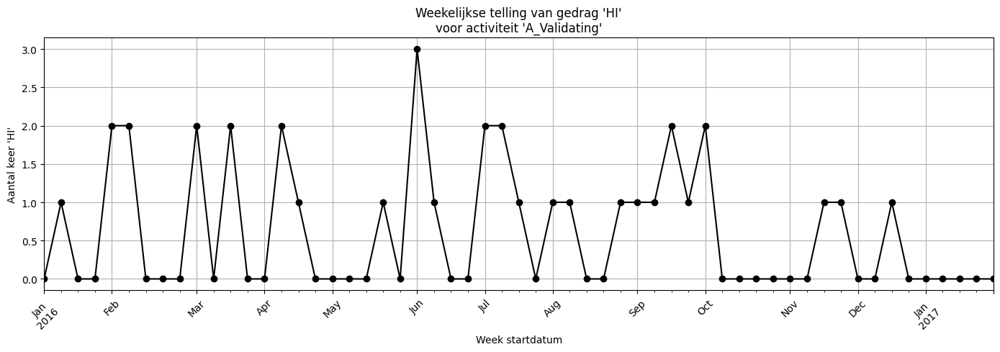

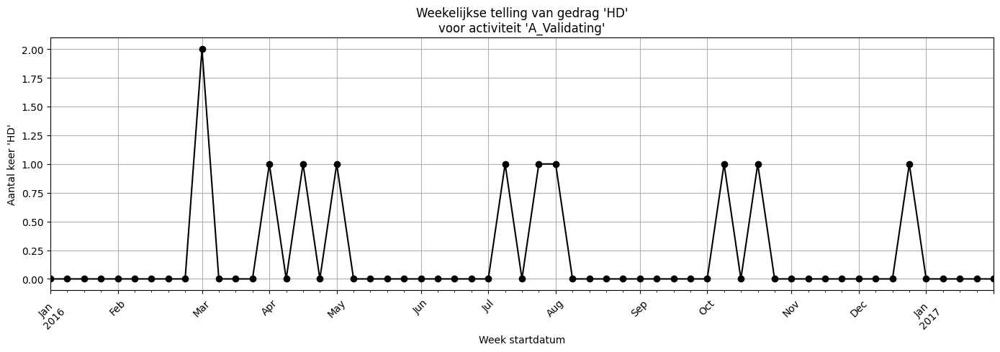

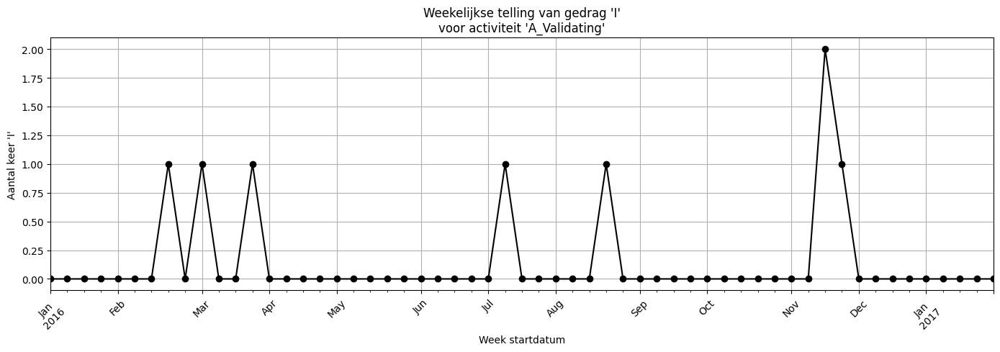

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "A_Validating"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

         case:concept:name          concept:name      time:timestamp  \
0   Application_1000158214  A_Create Application 2016-06-02 10:14:26   
27  Application_1000806256  A_Create Application 2016-06-01 09:03:46   
52  Application_1002324382  A_Create Application 2016-05-30 16:14:44   
77  Application_1003568418  A_Create Application 2016-06-01 19:55:34   
97  Application_1005003910  A_Create Application 2016-06-06 12:49:11   

                   event_j         timestamp_j  actor_i  actor_j behavior  \
0              A_Submitted 2016-06-02 10:14:26   User_1   User_1        C   
27  W_Complete application 2016-06-01 09:08:42   User_4   User_4        C   
52  W_Complete application 2016-05-30 16:14:44  User_23  User_23        C   
77             A_Submitted 2016-06-01 19:55:34   User_1   User_1        C   
97               A_Concept 2016-06-06 12:49:11  User_10  User_10        C   

    delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
0       0.0      NaN       

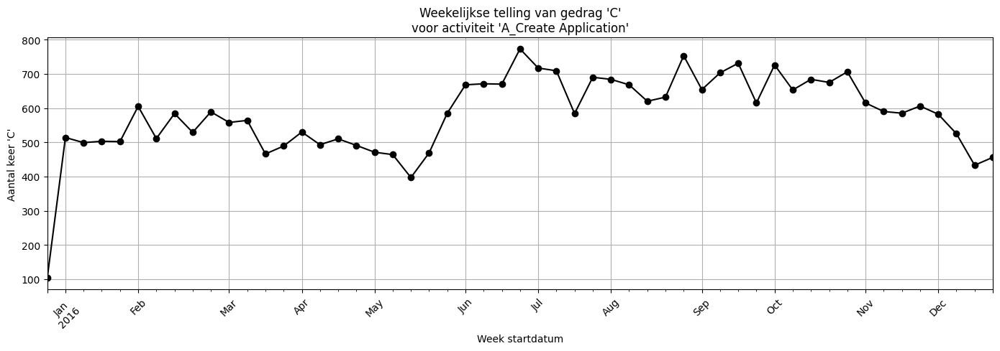

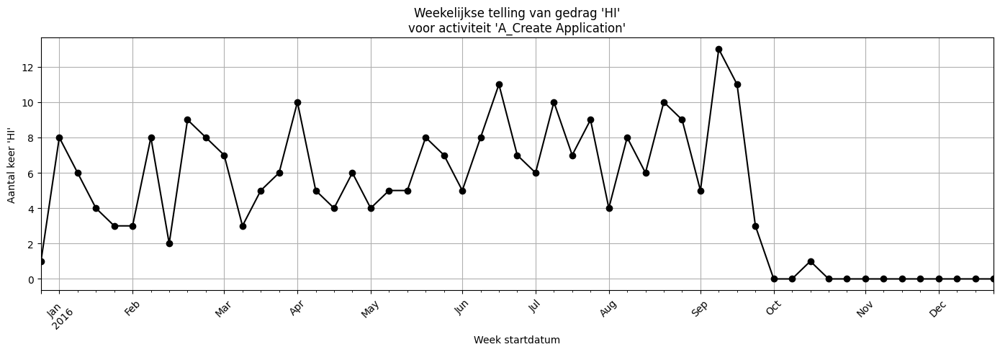

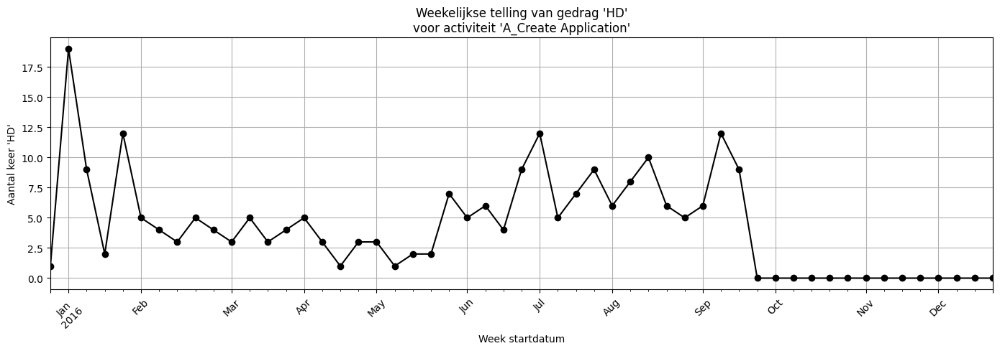

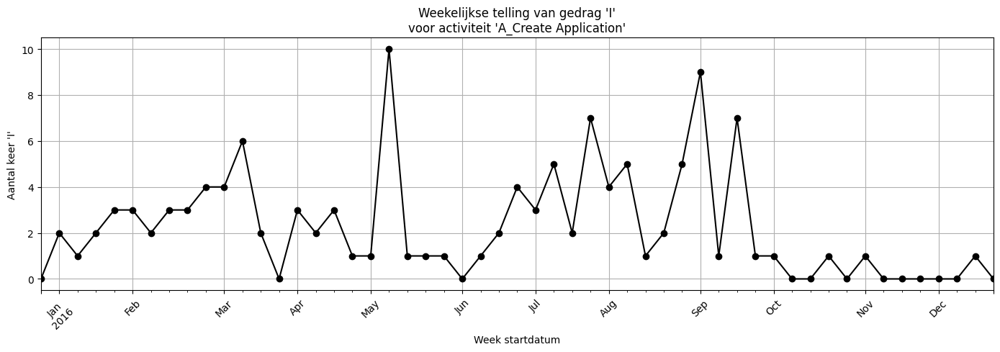

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "A_Create Application"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

         case:concept:name concept:name      time:timestamp  \
5   Application_1000158214    A_Concept 2016-06-02 10:15:36   
25  Application_1000806256    A_Concept 2016-06-01 09:03:46   
55  Application_1002324382    A_Concept 2016-05-30 16:14:44   
82  Application_1003568418    A_Concept 2016-06-01 19:56:18   
98  Application_1005003910    A_Concept 2016-06-06 12:49:11   

                   event_j         timestamp_j  actor_i  actor_j behavior  \
5   W_Complete application 2016-06-06 08:02:16   User_1  User_32       HI   
25  W_Complete application 2016-06-01 09:03:46   User_4   User_4        C   
55  W_Complete application 2016-05-30 16:15:03  User_23  User_23        C   
82  W_Complete application 2016-06-04 13:22:48   User_1  User_49       HI   
98  W_Complete application 2016-06-06 12:49:11  User_10  User_10        C   

     delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
5   337600.0      NaN        NaN     Accepted              1             0   
25

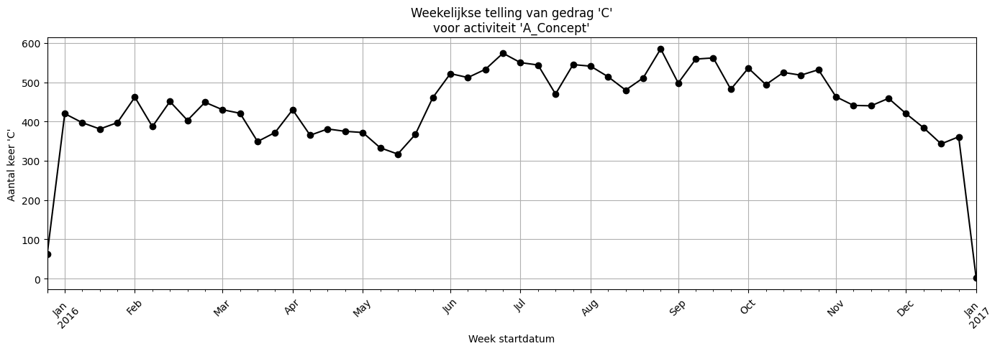

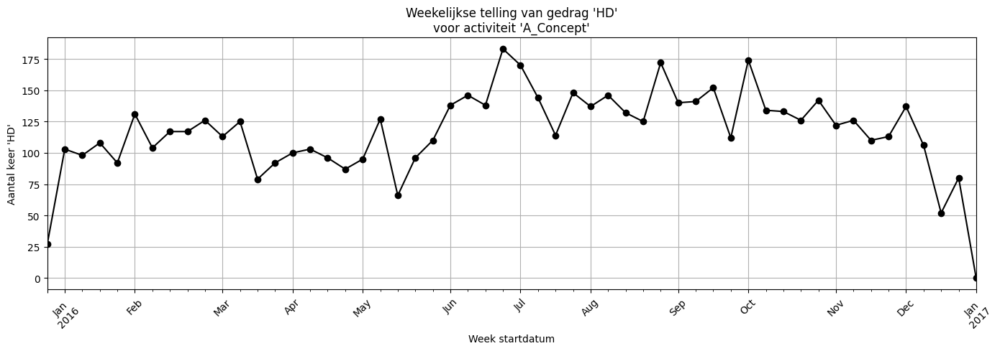

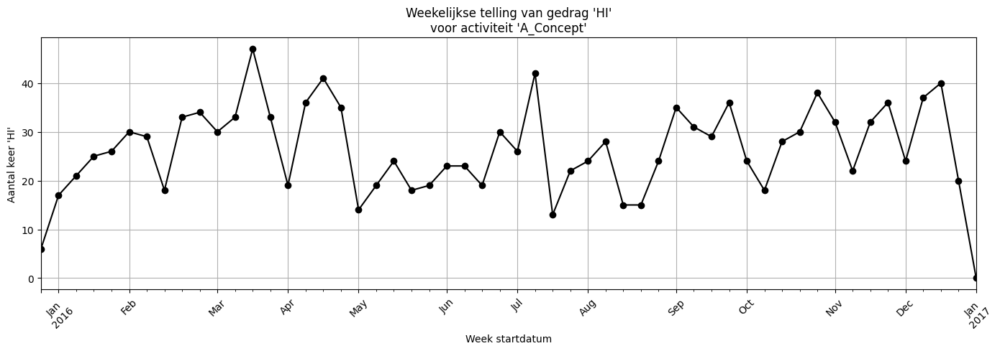

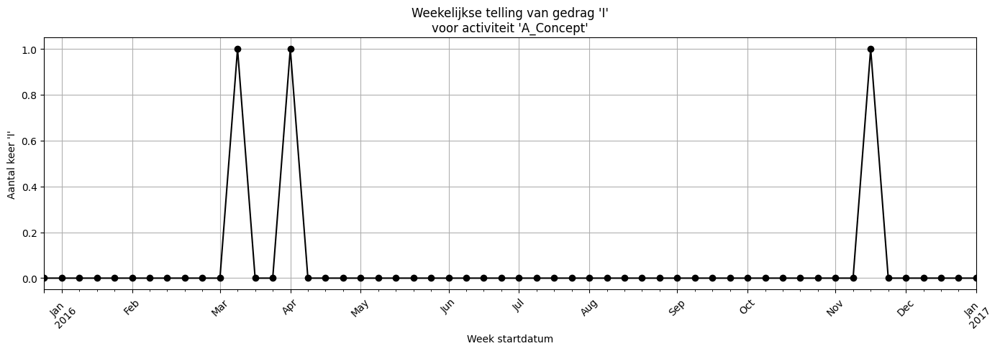

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "A_Concept"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name concept:name      time:timestamp         event_j  \
7    Application_1000158214   A_Accepted 2016-06-06 08:10:07  O_Create Offer   
30   Application_1000806256   A_Accepted 2016-06-01 10:40:27  O_Create Offer   
58   Application_1002324382   A_Accepted 2016-06-01 11:35:26  O_Create Offer   
84   Application_1003568418   A_Accepted 2016-06-04 13:27:53  O_Create Offer   
102  Application_1005003910   A_Accepted 2016-06-06 18:32:08  O_Create Offer   

            timestamp_j  actor_i  actor_j behavior  delta_t accepted  \
7   2016-06-06 08:12:02  User_32  User_32        C    115.0      NaN   
30  2016-06-01 10:42:09   User_4   User_4        C    102.0      NaN   
58  2016-06-01 11:37:38  User_51  User_51        C    132.0      NaN   
84  2016-06-04 13:29:31  User_49  User_49        C     98.0      NaN   
102 2016-06-06 18:33:57  User_76  User_76        C    109.0      NaN   

    accepted_j case_outcome  case_accepted  case_refused  case_canceled  
7         Tr

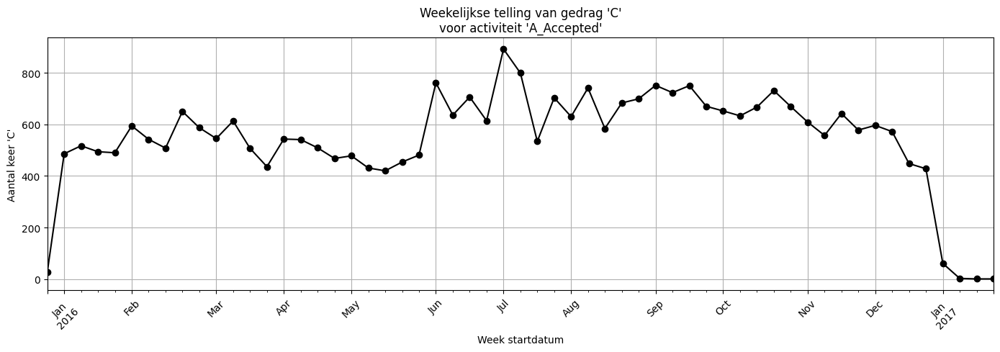

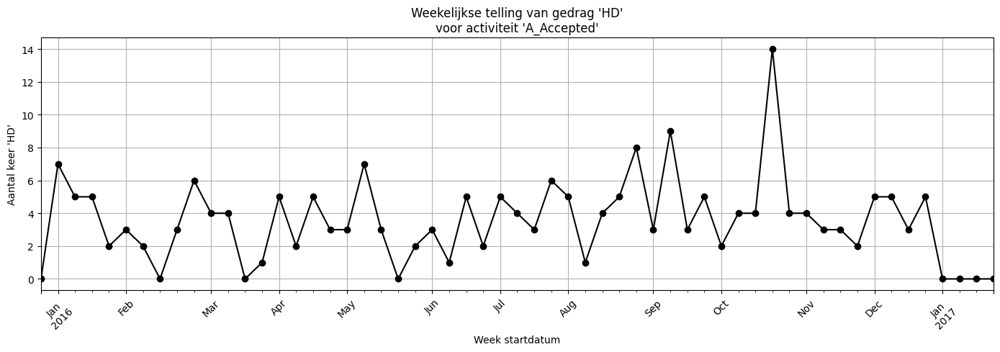

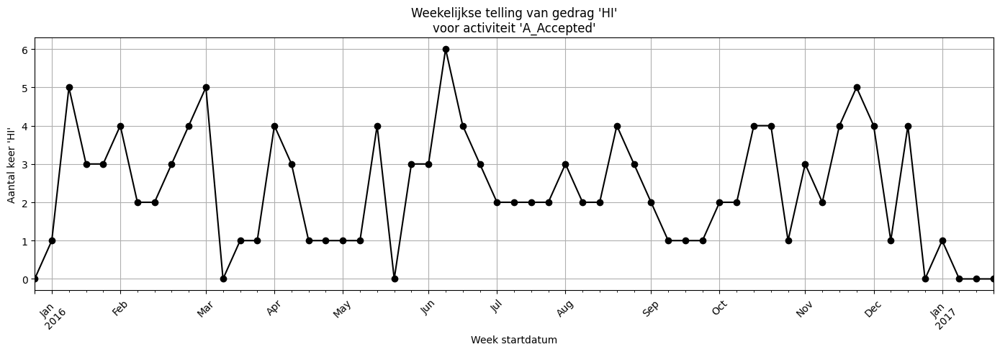

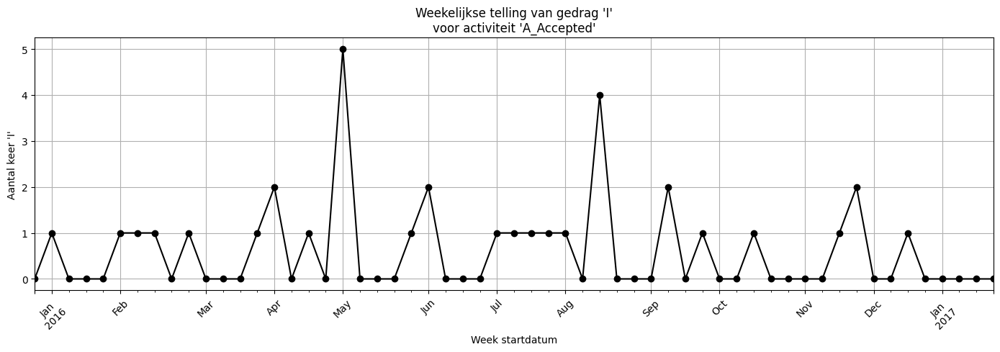

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "A_Accepted"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name concept:name      time:timestamp  \
10   Application_1000158214   A_Complete 2016-06-06 08:16:46   
37   Application_1000806256   A_Complete 2016-06-01 10:42:51   
64   Application_1002324382   A_Complete 2016-06-01 11:38:53   
87   Application_1003568418   A_Complete 2016-06-04 13:29:47   
109  Application_1005003910   A_Complete 2016-06-06 18:36:12   

                      event_j         timestamp_j  actor_i  actor_j behavior  \
10        W_Call after offers 2016-06-06 08:16:46  User_32  User_32        C   
37        W_Call after offers 2016-06-01 10:49:16   User_4   User_4        C   
64        W_Call after offers 2016-06-01 11:38:53  User_51  User_51        C   
87   O_Sent (mail and online) 2016-06-04 13:29:47  User_49  User_49        C   
109       W_Call after offers 2016-06-06 18:36:55  User_76  User_76        C   

     delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
10       0.0      NaN        NaN     Accepted           

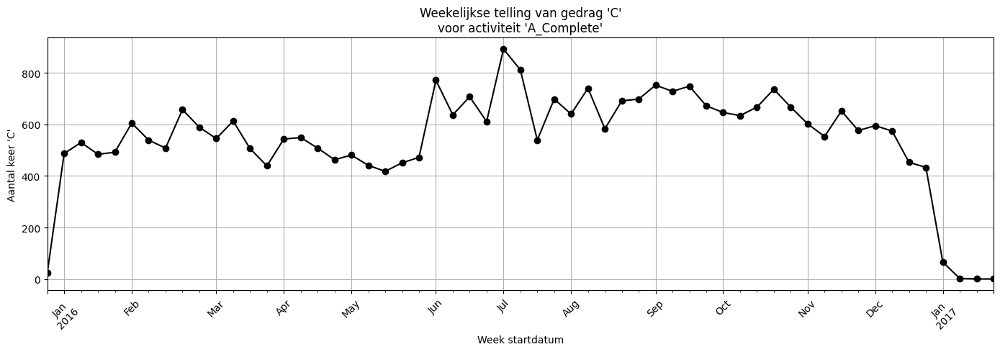

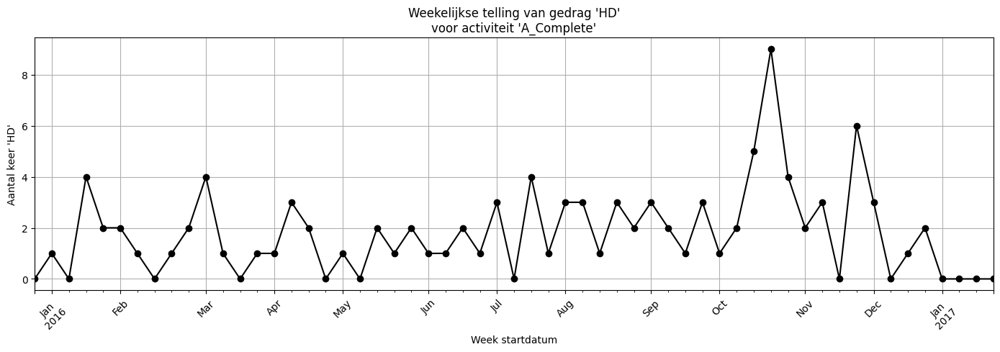

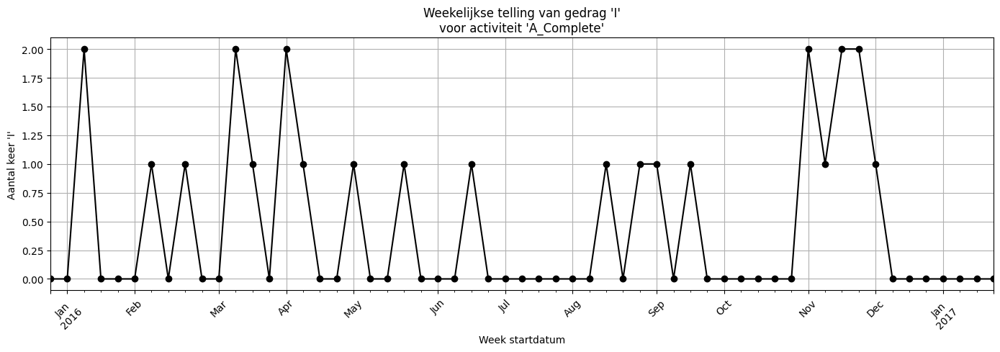

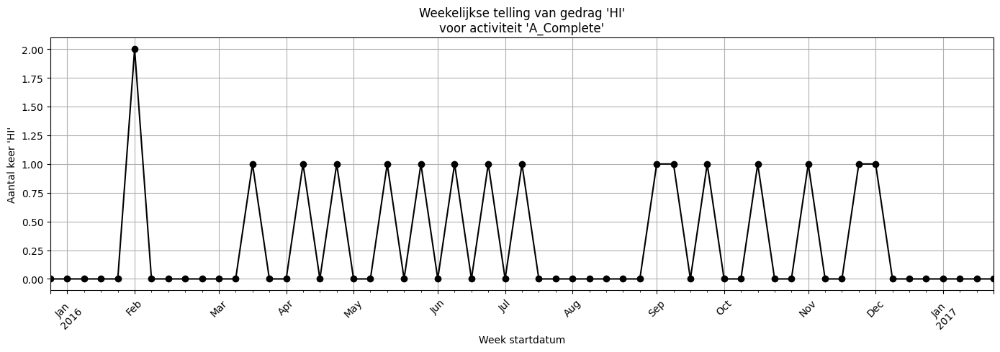

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "A_Complete"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name concept:name      time:timestamp  \
20   Application_1000158214   O_Returned 2016-06-09 09:55:13   
45   Application_1000806256   O_Returned 2016-06-15 09:40:21   
73   Application_1002324382   O_Returned 2016-06-08 11:07:17   
115  Application_1005003910   O_Returned 2016-06-10 08:39:14   
141  Application_1005586643   O_Returned 2016-06-02 10:51:25   

                    event_j         timestamp_j   actor_i   actor_j behavior  \
20   W_Validate application 2016-06-09 09:56:08  User_118  User_118        C   
45   W_Validate application 2016-06-15 09:41:48  User_121  User_121        C   
73   W_Validate application 2016-06-08 11:09:39  User_113  User_113        C   
115  W_Validate application 2016-06-10 08:51:25  User_122  User_122        C   
141  W_Validate application 2016-06-02 10:53:13  User_116  User_116        C   

     delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
20      55.0      NaN        NaN     Accepted           

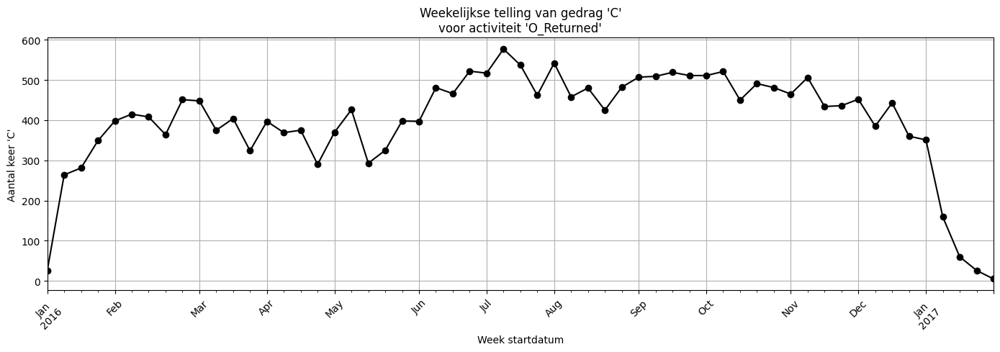

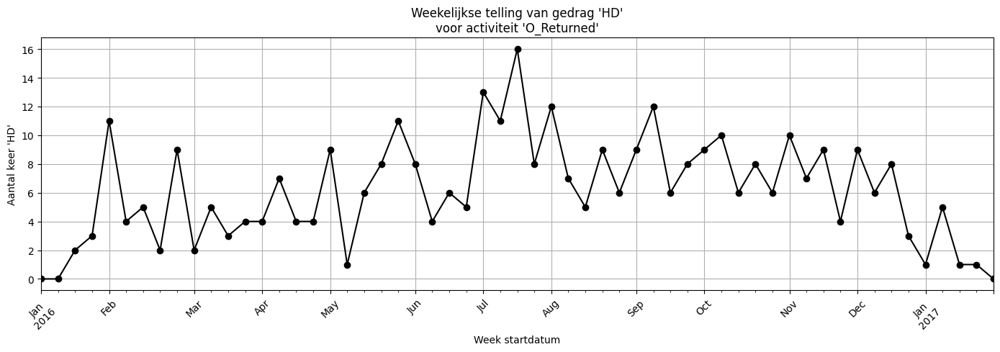

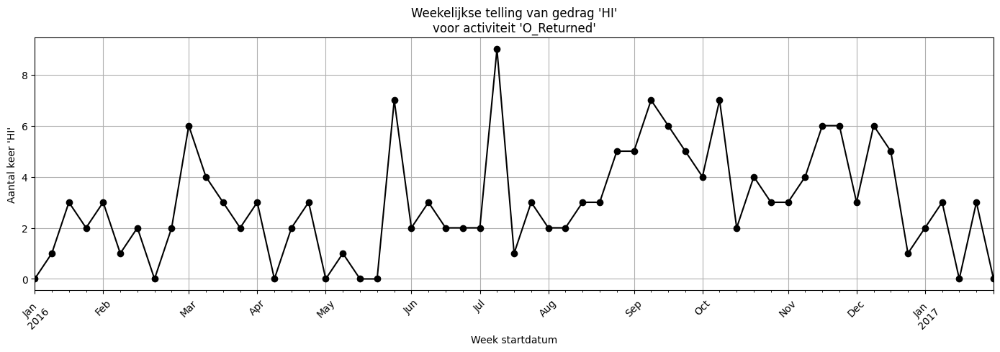

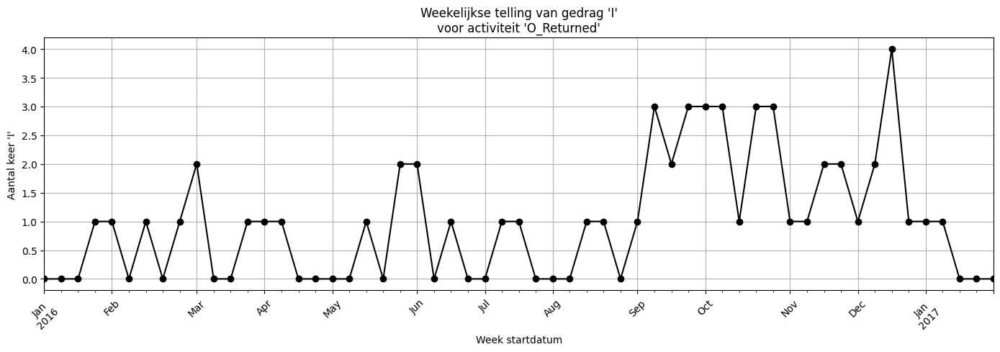

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "O_Returned"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name  concept:name      time:timestamp  \
209  Application_1006372947  A_Incomplete 2016-06-23 10:30:19   
288  Application_1008820487  A_Incomplete 2016-06-01 13:33:47   
343  Application_1008980114  A_Incomplete 2016-07-08 08:14:49   
357  Application_1008980114  A_Incomplete 2016-07-11 07:07:34   
398  Application_1009956698  A_Incomplete 2016-06-23 12:48:07   

                     event_j         timestamp_j   actor_i   actor_j behavior  \
209  W_Call incomplete files 2016-06-23 10:30:19   User_68   User_68        C   
288   W_Validate application 2016-06-01 13:33:47  User_124  User_124        C   
343  W_Call incomplete files 2016-07-08 08:14:49  User_109  User_109        C   
357   W_Validate application 2016-07-11 07:07:34  User_109  User_109        C   
398  W_Call incomplete files 2016-06-23 12:48:07   User_87   User_87        C   

     delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
209      0.0      NaN        NaN     Cancele

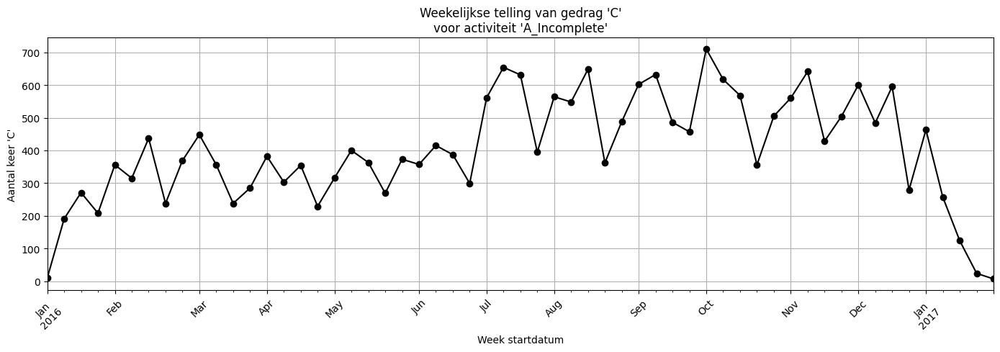

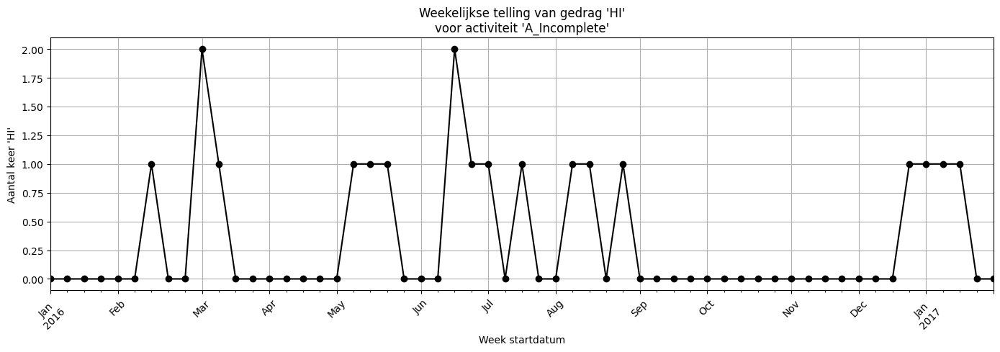

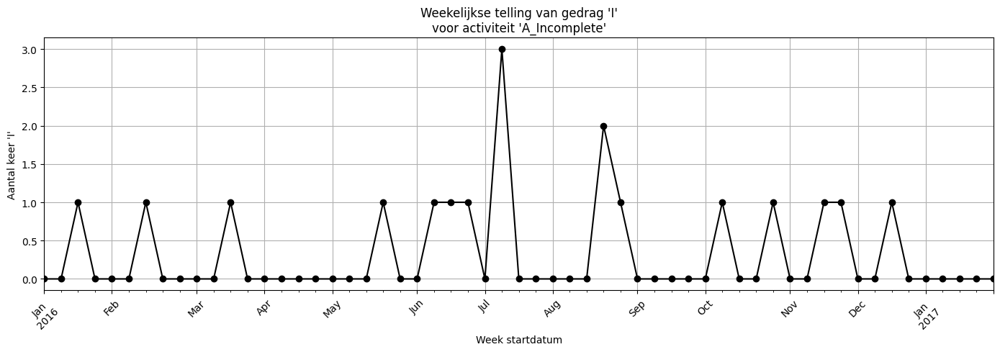

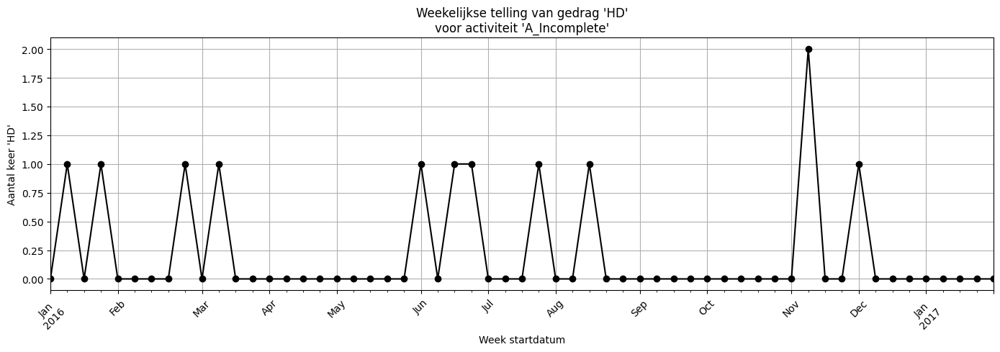

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "A_Incomplete"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name concept:name      time:timestamp  \
95   Application_1003568418  O_Cancelled 2016-07-05 06:00:25   
226  Application_1006372947  O_Cancelled 2016-06-28 10:08:00   
260  Application_1006959642  O_Cancelled 2016-05-30 12:28:36   
307  Application_1008820487  O_Cancelled 2016-07-08 07:01:46   
442  Application_1010778247  O_Cancelled 2016-06-28 11:47:23   

                     event_j         timestamp_j  actor_i  actor_j behavior  \
95       W_Call after offers 2016-07-05 06:00:25   User_1   User_1        C   
226               O_Accepted 2016-06-28 10:08:00  User_68  User_68        C   
260   W_Validate application 2016-05-30 12:28:36  User_29  User_29        C   
307  W_Call incomplete files 2016-07-08 07:01:46   User_3   User_3        C   
442      W_Call after offers 2016-07-04 11:50:50  User_51  User_27       HI   

      delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
95        0.0      NaN        NaN     Canceled              0

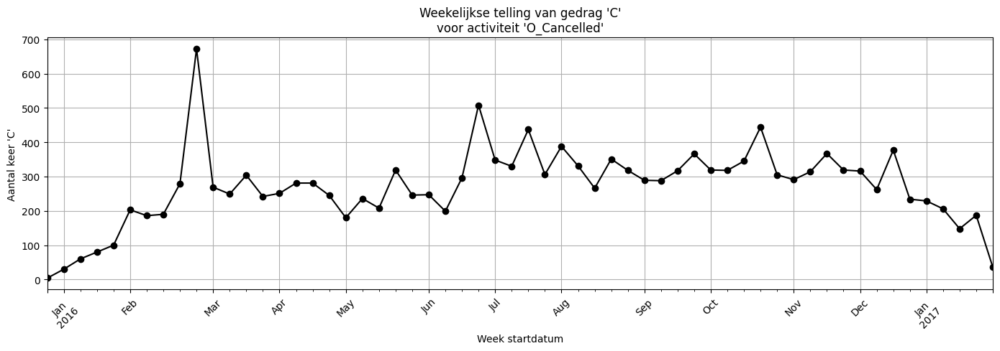

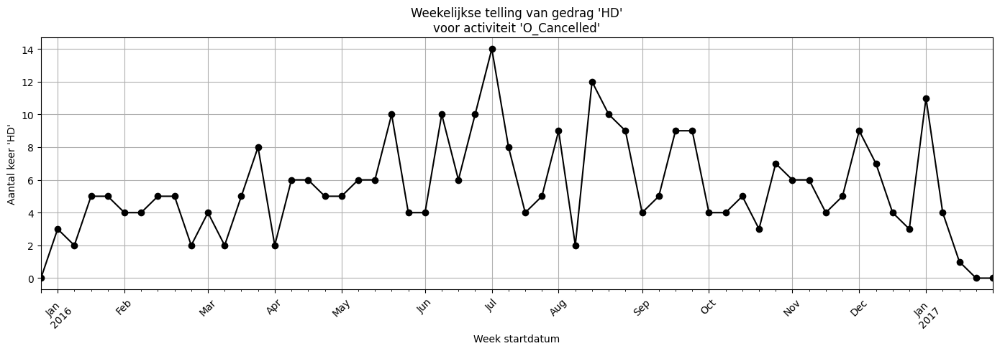

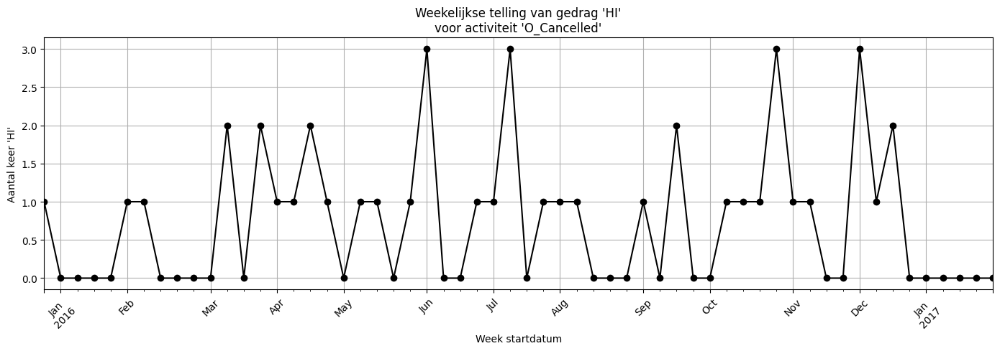

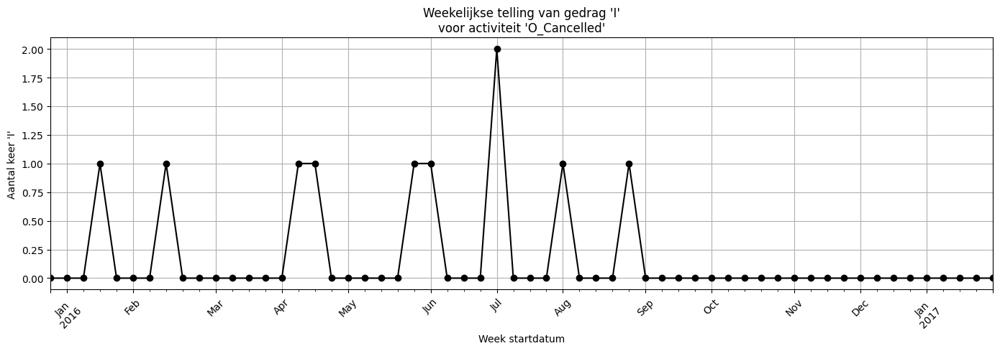

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "O_Cancelled"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name concept:name      time:timestamp  \
1    Application_1000158214  A_Submitted 2016-06-02 10:14:26   
78   Application_1003568418  A_Submitted 2016-06-01 19:55:34   
146  Application_1006058240  A_Submitted 2016-06-03 11:34:39   
229  Application_1006959642  A_Submitted 2016-05-23 16:29:24   
263  Application_1008820487  A_Submitted 2016-05-31 13:49:44   

                  event_j         timestamp_j actor_i actor_j behavior  \
1          W_Handle leads 2016-06-02 10:14:27  User_1  User_1        C   
78         W_Handle leads 2016-06-01 19:55:34  User_1  User_1        C   
146        W_Handle leads 2016-06-03 11:34:40  User_1  User_1        C   
229        W_Handle leads 2016-05-23 16:29:24  User_1  User_1        C   
263  A_Create Application 2016-05-31 13:49:44  User_1  User_1        C   

     delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
1        1.0      NaN        NaN     Accepted              1             0   
78       0.0  

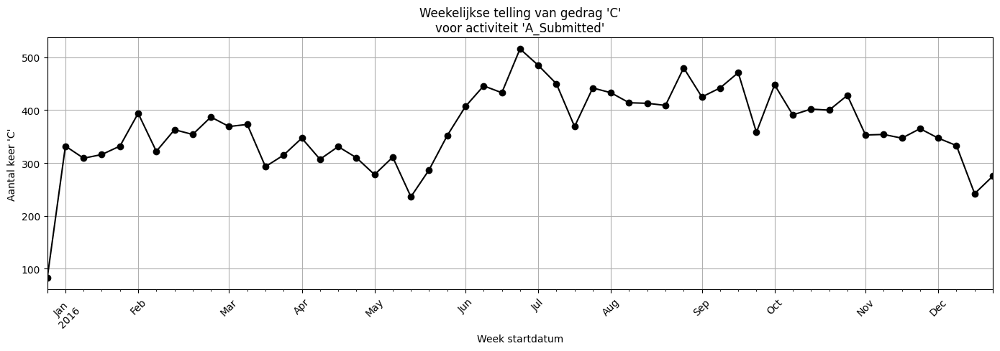

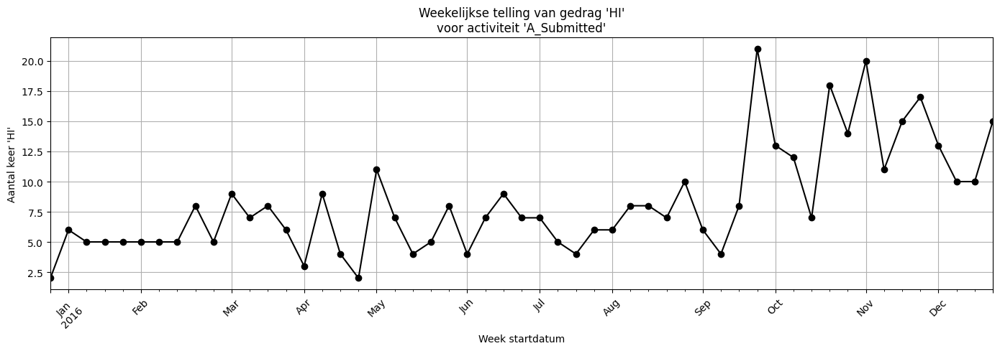

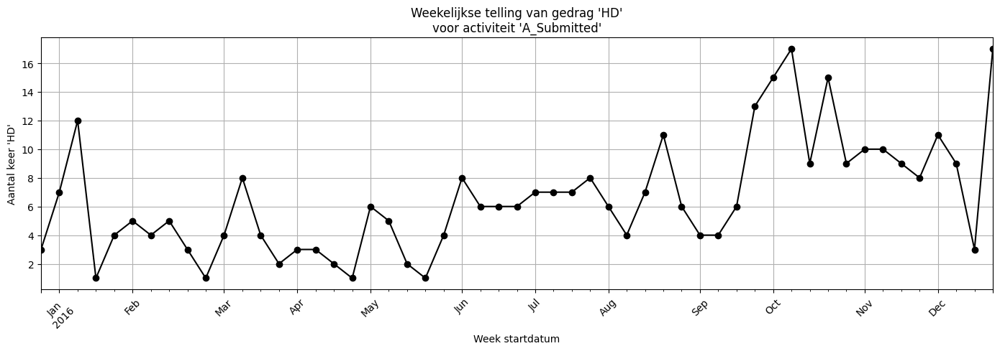

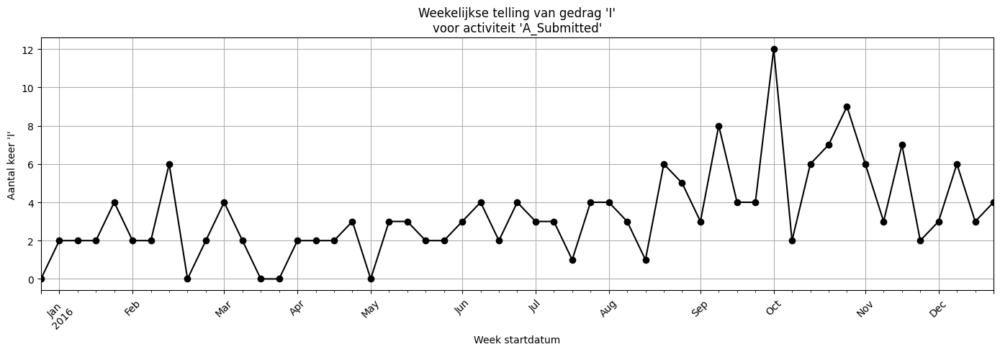

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "A_Submitted"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name concept:name      time:timestamp  \
117  Application_1005003910   O_Accepted 2016-06-10 13:52:27   
227  Application_1006372947   O_Accepted 2016-06-28 10:08:00   
702  Application_1014808270   O_Accepted 2016-07-01 14:28:13   
784  Application_1015296509   O_Accepted 2016-07-26 10:50:56   
980   Application_101604435   O_Accepted 2016-07-06 10:02:39   

                    event_j         timestamp_j   actor_i   actor_j behavior  \
117  W_Validate application 2016-06-10 13:52:27   User_90   User_90        C   
227               A_Pending 2016-06-28 10:08:00   User_68   User_68        C   
702               A_Pending 2016-07-01 14:28:13  User_113  User_113        C   
784             O_Cancelled 2016-07-26 10:50:56  User_109  User_109        C   
980  W_Validate application 2016-07-06 10:02:39   User_29   User_29        C   

     delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
117      0.0      NaN        NaN     Accepted           

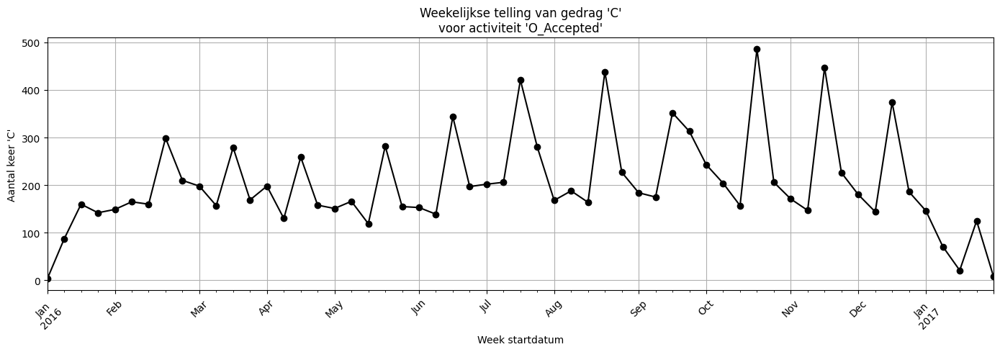

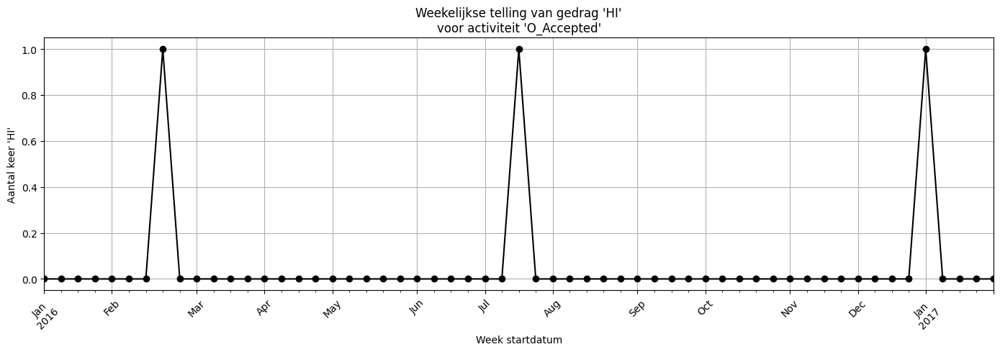

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "O_Accepted"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

          case:concept:name concept:name      time:timestamp  \
22   Application_1000158214    A_Pending 2016-06-10 11:02:01   
76   Application_1002324382    A_Pending 2016-06-09 08:56:02   
143  Application_1005586643    A_Pending 2016-06-02 15:33:35   
228  Application_1006372947    A_Pending 2016-06-28 10:08:00   
262  Application_1006959642    A_Pending 2016-05-30 12:28:36   

                    event_j         timestamp_j   actor_i   actor_j behavior  \
22   W_Validate application 2016-06-10 11:02:01   User_90   User_90        C   
76               O_Accepted 2016-06-09 08:56:02   User_90   User_90        C   
143  W_Validate application 2016-06-02 15:33:35  User_102  User_102        C   
228  W_Validate application 2016-06-28 10:08:00   User_68   User_68        C   
262              O_Accepted 2016-05-30 12:28:36   User_29   User_29        C   

     delta_t accepted accepted_j case_outcome  case_accepted  case_refused  \
22       0.0      NaN        NaN     Accepted           

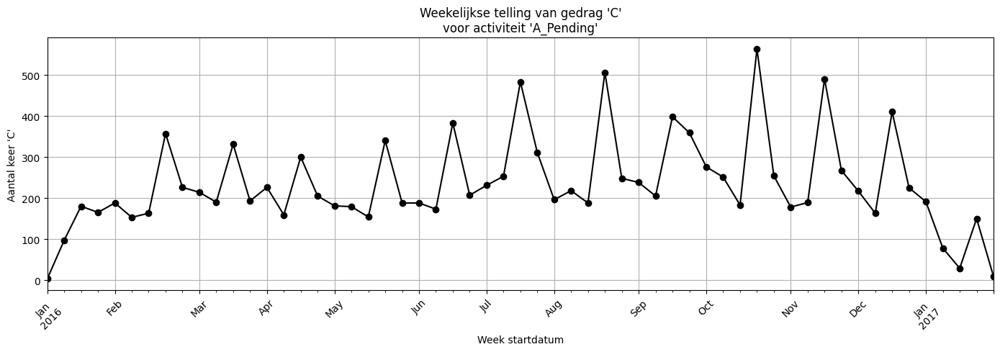

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "A_Pending"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

           case:concept:name concept:name      time:timestamp      event_j  \
306   Application_1008820487  A_Cancelled 2016-07-08 07:01:45  O_Cancelled   
575   Application_1012472852  A_Cancelled 2016-07-16 06:00:51  O_Cancelled   
857    Application_101548356  A_Cancelled 2016-07-06 15:27:10  O_Cancelled   
1001  Application_1016139280  A_Cancelled 2016-07-02 06:16:51  O_Cancelled   
1414  Application_1019277788  A_Cancelled 2016-07-15 06:00:51  O_Cancelled   

             timestamp_j  actor_i  actor_j behavior  delta_t accepted  \
306  2016-07-08 07:01:46   User_3   User_3        C      1.0      NaN   
575  2016-07-16 06:00:51   User_1   User_1        C      0.0      NaN   
857  2016-07-06 15:27:10  User_71  User_71        C      0.0      NaN   
1001 2016-07-02 06:16:51   User_1   User_1        C      0.0      NaN   
1414 2016-07-15 06:00:51   User_1   User_1        C      0.0      NaN   

     accepted_j case_outcome  case_accepted  case_refused  case_canceled  
306         NaN  

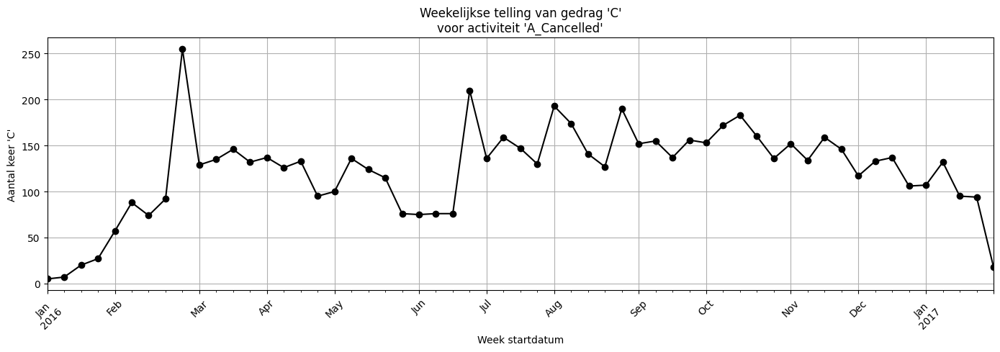

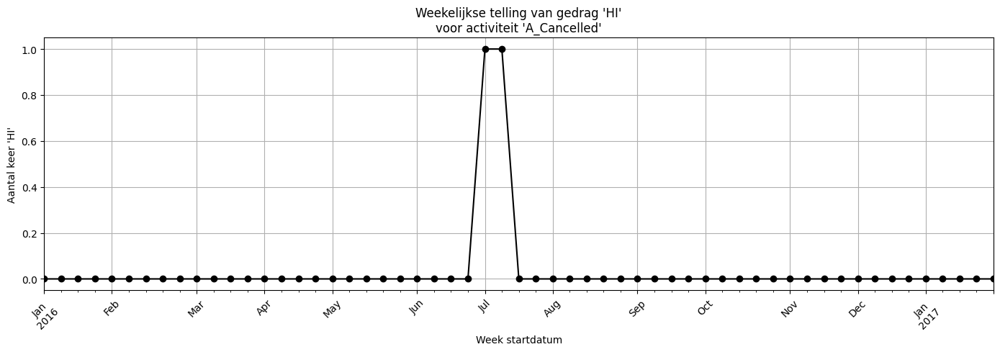

In [ ]:
# Specificeer hier de gewenste activiteit
selected_activity = "A_Cancelled"  # <-- Vul hier de exacte activiteit in

# Filter op de gekozen activiteit (event_i -> concept:name)
df_activity = df_wt[df_wt['concept:name'] == selected_activity].copy()

# Check of het filter goed werkt
print(df_activity.head())

# Groepeer per week en gedragstype, tel het aantal
behavior_weekly_activity = df_activity.groupby([
    df_activity['time:timestamp'].dt.to_period('W').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

# Pak de top 4 gedragstypes voor deze activiteit
top_behaviors_activity = df_activity['behavior'].value_counts().head(4).index.tolist()

# Plot voor elk gedragstype de tijdreeks
for behavior in top_behaviors_activity:
    plt.figure(figsize=(14, 5))
    behavior_weekly_activity[behavior].plot(marker='o', color='black')
    plt.title(f"Weekelijkse telling van gedrag '{behavior}'\nvoor activiteit '{selected_activity}'")
    plt.xlabel("Week startdatum")
    plt.ylabel(f"Aantal keer '{behavior}'")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

Time Series generation for granger

In [ ]:
import pandas as pd

# Stap 1: Lijst om alles op te bouwen
all_series = []

# ✳️ DAGELIJKSE versie
# Stap 2: Algemene time series voor alle data
behavior_daily = df_wt.groupby([
    df_wt['time:timestamp'].dt.to_period('D').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

top_behaviors = df_wt['behavior'].value_counts().head(4).index.tolist()

for behavior in top_behaviors:
    if behavior in behavior_daily.columns:
        s = behavior_daily[behavior].rename(f"All_{behavior}")
        all_series.append(s)

# Stap 3: Per user (dagelijks)
user_list = ['User_1', 'User_2', 'User_3', 'User_5', 'User_49', 'User_53']

for user in user_list:
    df_user = df_wt[df_wt['actor_i'] == user]
    if df_user.empty:
        continue
    daily = df_user.groupby([
        df_user['time:timestamp'].dt.to_period('D').apply(lambda r: r.start_time),
        'behavior'
    ]).size().unstack(fill_value=0)
    top_behaviors_user = df_user['behavior'].value_counts().head(4).index.tolist()
    for behavior in top_behaviors_user:
        if behavior in daily.columns:
            s = daily[behavior].rename(f"{user}_{behavior}")
            all_series.append(s)

# Stap 4: Per activiteit (dagelijks)
activity_list = [
    "W_Validate application", "W_Call after offers", "W_Call incomplete files",
    "W_Complete application", "W_Handle leads", "O_Create Offer", "O_Created",
    "O_Sent (mail and online)", "A_Validating", "A_Create Application",
    "A_Concept", "A_Accepted", "A_Complete", "O_Returned", "A_Incomplete",
    "O_Cancelled", "A_Submitted", "O_Accepted", "A_Pending", "A_Cancelled"
]

for activity in activity_list:
    df_act = df_wt[df_wt['concept:name'] == activity]
    if df_act.empty:
        continue
    daily = df_act.groupby([
        df_act['time:timestamp'].dt.to_period('D').apply(lambda r: r.start_time),
        'behavior'
    ]).size().unstack(fill_value=0)
    top_behaviors_act = df_act['behavior'].value_counts().head(4).index.tolist()
    for behavior in top_behaviors_act:
        if behavior in daily.columns:
            s = daily[behavior].rename(f"{activity}_{behavior}")
            all_series.append(s)

# Stap 5: Combineer alles
df_all = pd.concat(all_series, axis=1).sort_index()
df_all = df_all.fillna(0)

# Resultaat bekijken
print(df_all.shape)
df_all.head()



(398, 101)


,All_C,All_HD,All_HI,All_I,User_1_C,User_1_HD,User_1_HI,User_1_I,User_2_C,User_2_HD,...,O_Cancelled_I,A_Submitted_C,A_Submitted_HI,A_Submitted_HD,A_Submitted_I,O_Accepted_C,O_Accepted_HI,A_Pending_C,A_Cancelled_C,A_Cancelled_HI
time:timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01,104,12,10,0,104.0,12.0,10.0,0.0,0.0,0.0,...,0.0,22.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-01-02,470,56,25,3,121.0,21.0,7.0,1.0,0.0,0.0,...,0.0,26.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-01-03,168,36,1,2,168.0,36.0,1.0,2.0,0.0,0.0,...,0.0,34.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-01-04,1715,238,82,27,299.0,55.0,17.0,6.0,12.0,1.0,...,0.0,64.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-01-05,1451,233,57,16,303.0,59.0,11.0,6.0,0.0,0.0,...,0.0,67.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
import pandas as pd

# Stap 1: Lijst om alles op te bouwen
all_series = []

# ✳️ DAGELIJKSE versie
# Stap 2: Algemene time series voor alle data
behavior_daily = df_wt.groupby([
    df_wt['time:timestamp'].dt.to_period('D').apply(lambda r: r.start_time),
    'behavior'
]).size().unstack(fill_value=0)

top_behaviors = df_wt['behavior'].value_counts().head(4).index.tolist()

for behavior in top_behaviors:
    if behavior in behavior_daily.columns:
        s = behavior_daily[behavior].rename(f"All_{behavior}")
        all_series.append(s)

# Stap 5: Combineer alles
df_all = pd.concat(all_series, axis=1).sort_index()
df_all = df_all.fillna(0)

# Resultaat bekijken
print(df_all.shape)
df_all.head()


(392, 4)


,All_C,All_HD,All_HI,All_I
time:timestamp,,,,
2016-01-01,104,12,10,0
2016-01-02,470,56,25,3
2016-01-03,168,36,1,2
2016-01-04,1715,238,82,27
2016-01-05,1451,233,57,16


#TT

Preprocessing the data...


/usr/local/lib/python3.11/dist-packages/DyLoPro/preprocess_utils.py:105: UserWarning: In some cases in the given log, the events were not ordered correctly based on their timestamp. In the DynamicLogPlots instance' internal representation of the log, this problem is resolved by correctly sorting the events.
  warnings.warn(warning_message)
/usr/local/lib/python3.11/dist-packages/DyLoPro/preprocess_utils.py:274: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  log['hourly_timestamp'] = timestamps.dt.floor("1H")
/usr/local/lib/python3.11/dist-packages/DyLoPro/preprocess_utils.py:277: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  log['2hour_timestamp'] = timestamps.dt.floor("2H")
/usr/local/lib/python3.11/dist-packages/DyLoPro/preprocess_utils.py:280: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  log['12hour_timestamp'] = timestamps

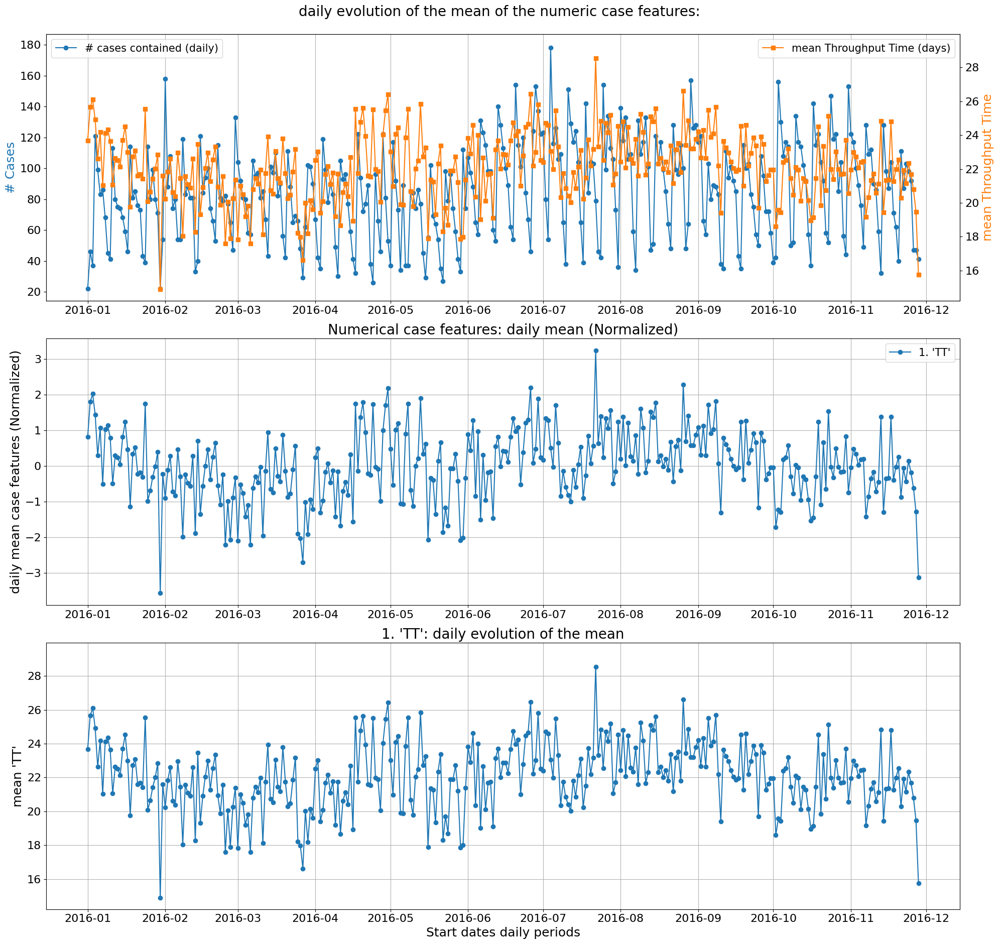

In [ ]:
import pandas as pd
from DyLoPro import DynamicLogPlots
import matplotlib.pyplot as plt

# Initializeer DyLoPro
dlp = DynamicLogPlots(
    event_log=df_wt,
    case_id_key='case:concept:name',
    activity_key='concept:name',
    timestamp_key='time:timestamp',
)
dlp.add_numerical_caseft('TT')

# Stel de plotstijl in
plt.rcParams.update({
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'axes.titlesize': 20,
    'legend.fontsize': 15,
    'legend.title_fontsize': 15
})

# Plot de throughput time voor alle cases
dlp.num_casefts_evol(
    numeric_case_list=['TT'],
    time_unit='days',
    frequency='daily',
    case_assignment='first_event',
    plt_type='univariate',
    numeric_agg='mean',
    xtr_outlier_rem=True
)

plt.show()



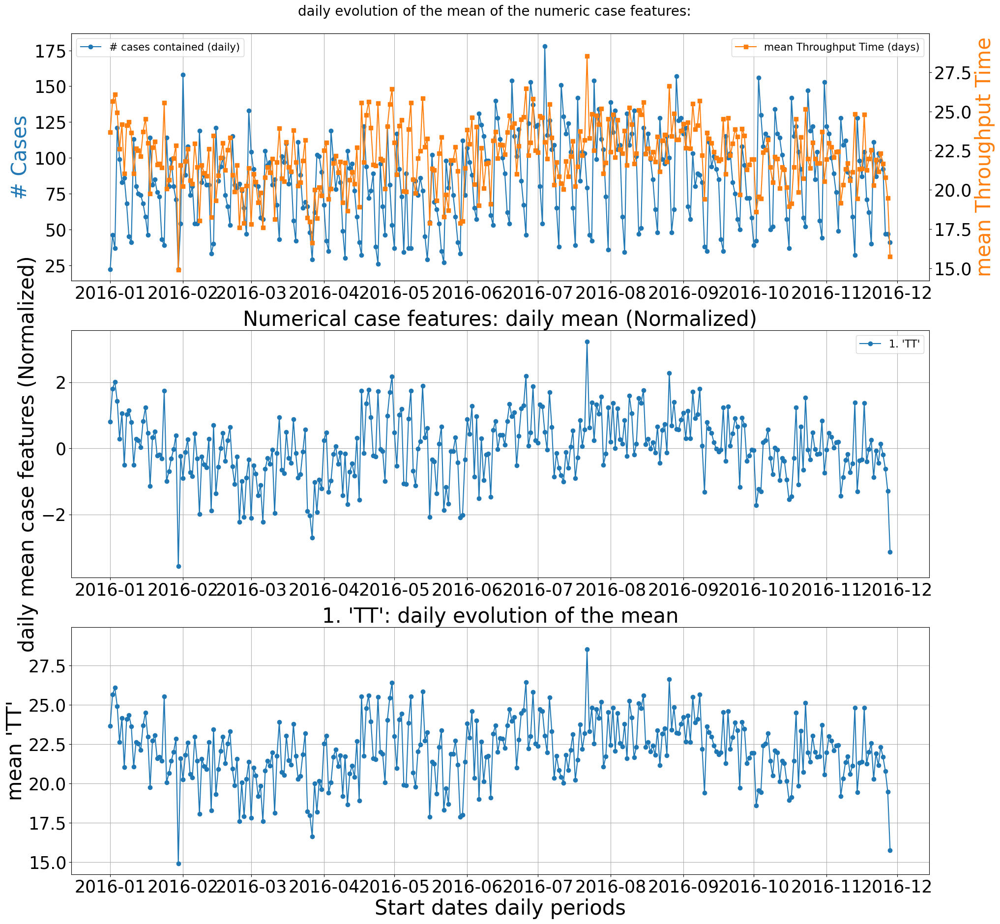

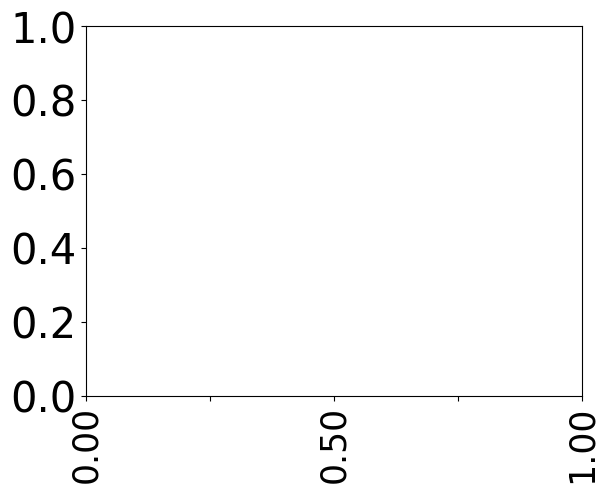

In [ ]:
import matplotlib.pyplot as plt

# Create the plot using DyLoPro
dlp.num_casefts_evol(
    numeric_case_list=['TT'],
    time_unit='days',
    frequency='daily',
    case_assignment='first_event',
    plt_type='univariate',
    numeric_agg='mean',
    xtr_outlier_rem=True
)

# Get the current figure and axis
fig = plt.gcf()
ax = plt.gca()

# Rotate x-axis labels
for label in ax.get_xticklabels():
    label.set_rotation(90)
    label.set_fontsize(25)

# Adjust y-axis label size
for label in ax.get_yticklabels():
    label.set_fontsize(30)

# Optionally, reduce the number of x-ticks for better spacing
labels = ax.get_xticklabels()
for i, label in enumerate(labels):
    if i % 2 != 0:  # Show every second label
        label.set_visible(False)

plt.show()



#Fraction and Duration of a case per outcome (accepted, refused or cancelled)

In [ ]:
import matplotlib.pyplot as plt

# Set the font size for axes labels, ticks, titles, and legends
plt.rcParams.update({
    'axes.labelsize': 20,
    'xtick.labelsize': 14,
    'ytick.labelsize': 16,
    'axes.titlesize': 20,
    'legend.fontsize': 18,
    'legend.title_fontsize': 20
})

import pandas as pd
from DyLoPro import DynamicLogPlots

# Initialize DyLoPro
dlp = DynamicLogPlots(
    event_log=df_wt,
    case_id_key='case:concept:name',
    activity_key='concept:name',
    timestamp_key='time:timestamp',
    categorical_eventfeatures=['case_outcome']
)

# Create the plot
ax = dlp.topK_categorical_eventftr_evol(
    event_feature='case_outcome',
    frequency='daily',
    plt_type='type_tt',
    numeric_agg='mean',
    max_k=4,
    xtr_outlier_rem=True
)

# Rotate and adjust x-axis labels
plt.xticks(rotation=45, ha='right', fontsize=18)

# Increase legend size
plt.legend(title="Case Outcome", fontsize=18, title_fontsize=20)

plt.tight_layout()  # Prevent label overlap
plt.show()



TypeError: The log object should be a pandas DataFrame. Convert the log to a pandas DataFrame first.

Time Series generation for granger

In [ ]:
# Zorg dat timestamps datetime zijn
df_wt['time:timestamp'] = pd.to_datetime(df_wt['time:timestamp'])

# Bereken start- en eindtijd per case + outcome
case_durations = df_wt.groupby('case:concept:name').agg(
    start=('time:timestamp', 'min'),
    end=('time:timestamp', 'max'),
    outcome=('case_outcome', 'first')  # outcome per case
)

# Duur in uren
case_durations['duration'] = (case_durations['end'] - case_durations['start']).dt.total_seconds() / 3600

# Startdag bepalen
case_durations['start_day'] = case_durations['start'].dt.to_period('D').apply(lambda r: r.start_time)

# Totaal aantal cases per dag
total_per_day = case_durations.groupby('start_day').size()

# Aantal cases per outcome per dag
outcome_counts = case_durations.groupby(['start_day', 'outcome']).size().unstack(fill_value=0)

# Fractie "Accepted" per dag (pas aan als je andere uitkomst wilt)
if 'Accepted' in outcome_counts.columns:
    fraction_accepted = (outcome_counts['Accepted'] / total_per_day).rename("fraction_Accepted")
else:
    fraction_accepted = pd.Series(0, index=total_per_day.index, name="fraction_Accepted")

# Gemiddelde duur van *alle* cases per dag
avg_duration = case_durations.groupby('start_day')['duration'].mean().rename("avg_duration")

# Combineer alles in één DataFrame
df_outcome_series = pd.concat([fraction_accepted, avg_duration], axis=1).fillna(0).sort_index()

# Bekijk het resultaat
print(df_outcome_series.shape)
df_outcome_series.head()




(333, 2)


,fraction_Accepted,avg_duration
start_day,,
2016-01-01,0.363636,568.101237
2016-01-02,0.413043,615.750151
2016-01-03,0.270270,626.330691
2016-01-04,0.388430,598.048432
2016-01-05,0.424242,542.949997


In [ ]:
# Alle unieke uren van beide dataframes combineren
all_hours = df_all.index.union(df_outcome_series.index).sort_values()

# Reindex beide op de volledige datumlijst (vult gaten met nullen)
df_all = df_all.reindex(all_hours).fillna(0)
df_outcome_series = df_outcome_series.reindex(all_hours).fillna(0)

# Combineer gedrag + uitkomst
df_all_combined = pd.concat([df_all, df_outcome_series], axis=1)

# Controleer laatste kolommen (dit zijn de outcome time series)
print(df_all_combined.columns[-6:])

# Exporteer naar CSV
df_all_combined.to_csv("df_combined_bpic2017.csv")

# Download in Google Colab
from google.colab import files
files.download("df_combined_bpic2017.csv")


Index(['All_C', 'All_HD', 'All_HI', 'All_I', 'fraction_Accepted',
       'avg_duration'],
      dtype='object')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#Granger Causalities

In [71]:
#inlezen csv
from google.colab import files
uploaded = files.upload()

Saving df_all_combined_bpic2017 (2).csv to df_all_combined_bpic2017 (2) (3).csv


In [72]:
import io
import pandas as pd

# Inlezen van het bestand
df_all_combined = pd.read_csv(io.BytesIO(uploaded['df_all_combined_bpic2017 (2) (3).csv']))


In [73]:
df_all_combined.head()

,Unnamed: 0,All_C,All_HD,All_HI,All_I,User_1_C,User_1_HD,User_1_HI,User_1_I,User_2_C,...,O_Accepted_HI,A_Pending_C,A_Cancelled_C,A_Cancelled_HI,fraction_Accepted,fraction_Canceled,fraction_Refused,duration_Accepted,duration_Canceled,duration_Refused
0,2016-01-01,104,12,10,0,104.0,12.0,10.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.363636,0.500000,0.136364,472.202812,736.554545,206.168241
1,2016-01-02,470,56,25,3,121.0,21.0,7.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.413043,0.521739,0.065217,328.807544,875.318449,356.506944
2,2016-01-03,168,36,1,2,168.0,36.0,1.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.270270,0.648649,0.081081,446.088333,746.071354,269.213241
3,2016-01-04,1715,238,82,27,299.0,55.0,17.0,6.0,12.0,...,0.0,0.0,0.0,0.0,0.388430,0.495868,0.115702,436.025047,776.407426,377.588393
4,2016-01-05,1451,233,57,16,303.0,59.0,11.0,6.0,0.0,...,0.0,0.0,0.0,0.0,0.424242,0.454545,0.121212,316.119881,814.984673,316.725370


#basis

In [52]:
from statsmodels.tsa.stattools import grangercausalitytests, adfuller
import pandas as pd

# Functies
def is_stationary(series, alpha=0.05):
    """Check stationariteit via ADF-test."""
    result = adfuller(series.dropna())
    return result[1] < alpha

def make_stationary(series):
    """Eerste verschil nemen om stationair te maken."""
    return series.diff()

def print_adf_result(series, name, alpha=0.05):
    """Print ADF-statistieken."""
    series = series.dropna()
    result = adfuller(series)
    test_stat, p_value, lags, n_obs, crit_values, _ = result

    print(f"\n🔍 ADF Test voor '{name}':")
    print(f" - Teststatistiek: {test_stat:.4f}")
    print(f" - p-waarde: {p_value:.4f}")
    for key, val in crit_values.items():
        print(f" - Kritieke waarde ({key}): {val:.4f}")
    if p_value < alpha:
        print(" ✅ Stationair")
    else:
        print(" ❌ Niet-stationair → wordt gedifferentieerd")

# Kolommen
X_columns = ['All_C', 'All_HD', 'All_HI', 'All_I']
Y_columns = ['fraction_Accepted', 'duration_Accepted']
max_lag = 3

# Voor het bewaren van stationaire series
stationary_df = pd.DataFrame(index=df_all_combined.index)

# Granger resultaten opslaan
results = []

# Loop door combinaties
for x in X_columns:
    for y in Y_columns:
        try:
            data = df_all_combined[[x, y]].dropna()

            # ADF printen
            print_adf_result(data[x], name=x)
            print_adf_result(data[y], name=y)

            # Stationaire reeksen toevoegen
            stationary_df[x] = make_stationary(data[x]) if not is_stationary(data[x]) else data[x]
            stationary_df[y] = make_stationary(data[y]) if not is_stationary(data[y]) else data[y]

            # Bereid data voor Granger test
            data_granger = stationary_df[[y, x]].dropna()

            test_result = grangercausalitytests(data_granger, maxlag=max_lag, verbose=False)
            p_values = [test_result[lag][0]['ssr_ftest'][1] for lag in range(1, max_lag + 1)]

        except Exception as e:
            print(f"⚠️ Fout bij combinatie {x} ➝ {y}: {e}")
            p_values = [None] * max_lag

        result = {'X (cause)': x, 'Y (effect)': y}
        for lag in range(1, max_lag + 1):
            result[f'p_lag{lag}'] = p_values[lag - 1]
        results.append(result)

# Resultaten als DataFrame
granger_df = pd.DataFrame(results)

# Bekijk resultaten
granger_df




🔍 ADF Test voor 'All_C':
 - Teststatistiek: -0.4058
 - p-waarde: 0.9091
 - Kritieke waarde (1%): -3.4477
 - Kritieke waarde (5%): -2.8692
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'All_C':
 - Teststatistiek: -0.4058
 - p-waarde: 0.9091
 - Kritieke waarde (1%): -3.4477
 - Kritieke waarde (5%): -2.8692
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'All_HD':
 - Teststatistiek: -0.5374
 - p-waarde: 0.8845
 - Kritieke waarde (1%): -3.4477
 

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'All_HI':
 - Teststatistiek: -1.1740
 - p-waarde: 0.6847
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'All_HI':
 - Teststatistiek: -1.1740
 - p-waarde: 0.6847
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'All_I':
 - Teststatistiek: -2.3822
 - p-waarde: 0.1468
 - Kritieke waarde (1%): -3.4475


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


,X (cause),Y (effect),p_lag1,p_lag2,p_lag3
0,All_C,fraction_Accepted,0.332514,0.858275,0.743301
1,All_C,duration_Accepted,0.084482,0.001479,0.003372
2,All_HD,fraction_Accepted,0.266056,0.854704,0.460770
3,All_HD,duration_Accepted,0.124324,0.001505,0.003415
4,All_HI,fraction_Accepted,0.724036,0.619148,0.872906
5,All_HI,duration_Accepted,0.019505,0.001399,0.003666
6,All_I,fraction_Accepted,0.757437,0.991333,0.999759
7,All_I,duration_Accepted,0.590464,0.179784,0.201442


In [53]:
!pip install group-lasso

🔍 Lag-selectie over (group_reg, l1_reg):
λg=0.1, λ1=0.0 → geselecteerde lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=0.1, λ1=0.1 → geselecteerde lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]
λg=0.1, λ1=0.5 → geselecteerde lags: [ 1  2  3  5  6  7 11 12 15 16 17 18 19 20 22]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=0.1, λ1=1.0 → geselecteerde lags: [ 1  2  5  6  7 12 15 18 19]
λg=0.5, λ1=0.0 → geselecteerde lags: [ 1  2  3  5  6  7 11 12 15 16 18 19 22]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=0.5, λ1=0.1 → geselecteerde lags: [ 1  2  3  5  6  7 11 12 14 15 16 18 19 22]
λg=0.5, λ1=0.5 → geselecteerde lags: [ 1  2  5  6  7 12 15 18 19]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=0.5, λ1=1.0 → geselecteerde lags: [ 1  2  5  6  7 12 15 19]
λg=1.0, λ1=0.0 → geselecteerde lags: [ 1  2  5  6  7 12 14 15 18]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=1.0, λ1=0.1 → geselecteerde lags: [ 1  2  5  6  7 12 14 15 18]
λg=1.0, λ1=0.5 → geselecteerde lags: [ 2  5  6  7 14 15]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=1.0, λ1=1.0 → geselecteerde lags: [ 2  5  6  7 15]
λg=2.0, λ1=0.0 → geselecteerde lags: [ 2  5  6  7 14 15]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=2.0, λ1=0.1 → geselecteerde lags: [ 2  5  7 14 15]
λg=2.0, λ1=0.5 → geselecteerde lags: [ 2  5 15]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=2.0, λ1=1.0 → geselecteerde lags: [ 2 15]
λg=5.0, λ1=0.0 → geselecteerde lags: [15]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=5.0, λ1=0.1 → geselecteerde lags: [15]
λg=5.0, λ1=0.5 → geselecteerde lags: geen


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=5.0, λ1=1.0 → geselecteerde lags: geen
λg=10.0, λ1=0.0 → geselecteerde lags: geen


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=10.0, λ1=0.1 → geselecteerde lags: geen
λg=10.0, λ1=0.5 → geselecteerde lags: geen


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=10.0, λ1=1.0 → geselecteerde lags: geen

Top 5 meest causale lags: [ 6  7  5  2 15]
Top 6 meest causale lags: [12  6  7  5  2 15]
Top 7 meest causale lags: [ 1 12  6  7  5  2 15]


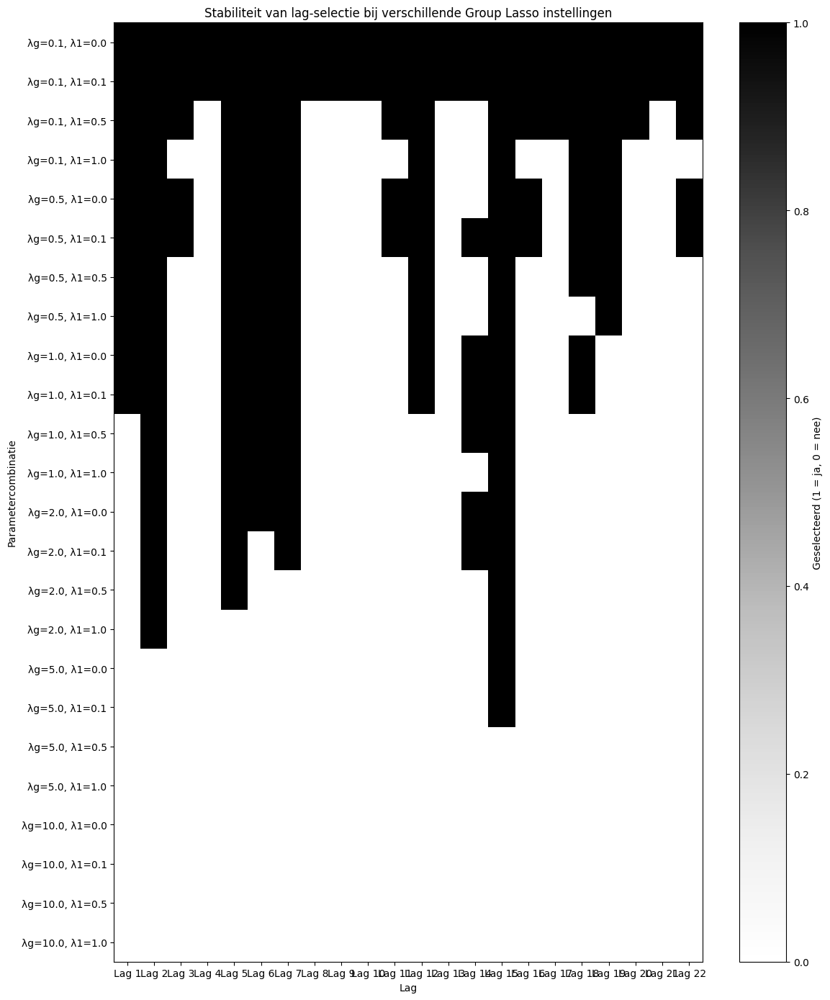

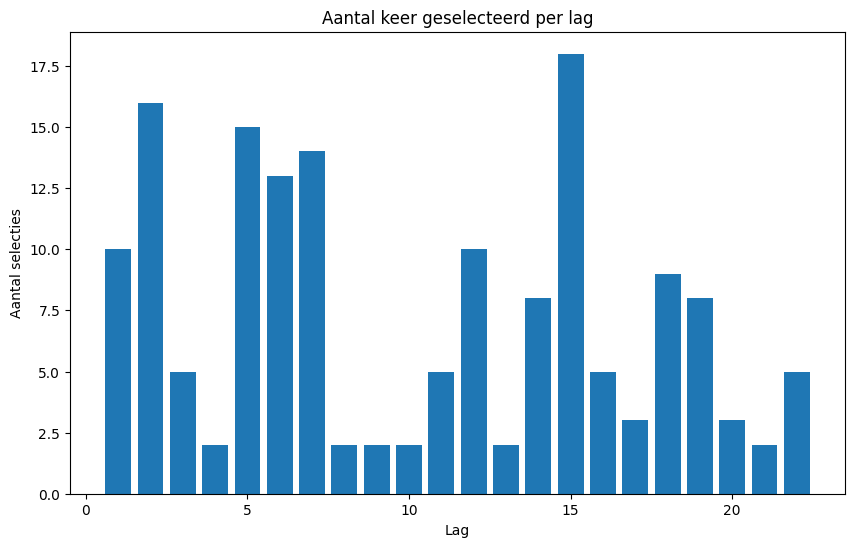

In [54]:
import numpy as np
import pandas as pd
from group_lasso import GroupLasso
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from itertools import product

# ⚙️ Parameters
max_lag = 22  # working days
cause_cols = ['All_C', 'All_HD', 'All_HI', 'All_I']
effect_cols = ['fraction_Accepted', 'duration_Accepted']
df = stationary_df[cause_cols + effect_cols].dropna()

# 🔁 Lagged matrix bouwen
def create_lagged_input(df, cause_cols, effect_cols, max_lag):
    X_lagged, Y = [], []
    for t in range(max_lag, len(df)):
        lags = []
        for lag in range(1, max_lag + 1):
            lags.extend(df[cause_cols].iloc[t - lag].values)
        X_lagged.append(lags)
        Y.append(df[effect_cols].iloc[t].values)
    return np.array(X_lagged), np.array(Y)

X_lagged, Y = create_lagged_input(df, cause_cols, effect_cols, max_lag)

# 🔄 Normaliseren
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_lagged)

# 🎯 Group labels per lag (1 groep per blok)
n_causes = len(cause_cols)
groups = np.repeat(np.arange(max_lag), n_causes)

# 📐 Raster van hyperparameters
group_regs = [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
l1_regs = [0.0, 0.1, 0.5, 1.0]
param_grid = list(product(group_regs, l1_regs))

# 📊 Resultaten opslaan
lag_matrix = np.zeros((len(param_grid), max_lag), dtype=int)
param_labels = []
lag_counts = np.zeros(max_lag, dtype=int)

print("🔍 Lag-selectie over (group_reg, l1_reg):")
for i, (group_reg, l1_reg) in enumerate(param_grid):
    model = GroupLasso(
        groups=groups,
        group_reg=group_reg,
        l1_reg=l1_reg,
        fit_intercept=True,
        supress_warning=True
    )
    model.fit(X_scaled, Y)
    selected_lags = np.unique(groups[np.any(model.coef_ != 0, axis=1)])
    for lag in selected_lags:
        lag_matrix[i, lag] = 1
        lag_counts[lag] += 1  # Count the number of times each lag is selected
    label = f"λg={group_reg}, λ1={l1_reg}"
    param_labels.append(label)
    print(f"{label} → geselecteerde lags: {selected_lags + 1 if len(selected_lags) > 0 else 'geen'}")

# 🥇 Select the top 5, 6, or 7 most frequent lags
top_5_lags = np.argsort(lag_counts)[-5:] + 1
top_6_lags = np.argsort(lag_counts)[-6:] + 1
top_7_lags = np.argsort(lag_counts)[-7:] + 1
print("\nTop 5 meest causale lags:", top_5_lags)
print("Top 6 meest causale lags:", top_6_lags)
print("Top 7 meest causale lags:", top_7_lags)

# 🖼️ Visualisatie als matrix
plt.figure(figsize=(12, len(param_grid) * 0.5 + 2))
plt.imshow(lag_matrix, cmap="Greys", aspect="auto")
plt.xticks(range(max_lag), [f"Lag {i+1}" for i in range(max_lag)])
plt.yticks(range(len(param_grid)), param_labels)
plt.xlabel("Lag")
plt.ylabel("Parametercombinatie")
plt.title("Stabiliteit van lag-selectie bij verschillende Group Lasso instellingen")
plt.colorbar(label="Geselecteerd (1 = ja, 0 = nee)")
plt.tight_layout()
plt.show()

# 📊 Plot most influential lags
plt.figure(figsize=(10, 6))
plt.bar(np.arange(1, max_lag+1), lag_counts)
plt.title("Aantal keer geselecteerd per lag")
plt.xlabel("Lag")
plt.ylabel("Aantal selecties")
plt.show()



In [13]:
from statsmodels.tsa.stattools import grangercausalitytests
import pandas as pd

# Kolommen
X_columns = ['All_C', 'All_HD', 'All_HI', 'All_I']
Y_columns = ['fraction_Accepted', 'duration_Accepted']
selected_lags = [2, 5, 6, 7, 15]  # Gebaseerd op Group Lasso-analyse

results = []

# Loop door alle combinaties van X ➡ Y
for x in X_columns:
    for y in Y_columns:
        try:
            data = stationary_df[[y, x]].dropna()
            test_result = grangercausalitytests(data, maxlag=max(selected_lags), verbose=False)

            result = {
                'X (cause)': x,
                'Y (effect)': y,
            }

            for lag in selected_lags:
                p_val = test_result[lag][0]['ssr_ftest'][1]
                result[f'p_lag{lag}'] = p_val

        except Exception as e:
            result = {'X (cause)': x, 'Y (effect)': y}
            for lag in selected_lags:
                result[f'p_lag{lag}'] = None

        results.append(result)

# Zet het in een DataFrame
granger_df_selected = pd.DataFrame(results)

# Bekijk de resultaten
from IPython.display import display
display(granger_df_selected)



/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print resul

,X (cause),Y (effect),p_lag2,p_lag5,p_lag6,p_lag7,p_lag15
0,All_C,fraction_Accepted,0.858275,0.798704,0.074346,0.075227,0.253839
1,All_C,duration_Accepted,0.001479,0.002473,0.004593,0.005811,0.004788
2,All_HD,fraction_Accepted,0.854704,0.651508,0.076335,0.044426,0.144866
3,All_HD,duration_Accepted,0.001505,0.004348,0.010118,0.012363,0.007051
4,All_HI,fraction_Accepted,0.619148,0.952657,0.166372,0.210411,0.040290
5,All_HI,duration_Accepted,0.001399,0.008141,0.021770,0.025632,0.038112
6,All_I,fraction_Accepted,0.991333,0.997508,0.555526,0.652097,0.299039
7,All_I,duration_Accepted,0.179784,0.100564,0.259169,0.152546,0.023506


In [14]:
# Functie om kleur te bepalen op basis van p-waarde
def color_pval(val):
    if pd.isna(val):
        return ''
    elif val < 0.05:
        return 'color: green'
    else:
        return 'color: red'

# Pas de stijl toe op de DataFrame
styled_df = granger_df_selected.style.applymap(
    color_pval,
    subset=[col for col in granger_df_selected.columns if col.startswith('p_lag')]
)

# Toon de gestylede DataFrame
display(styled_df)

<ipython-input-14-263a20e10463>:11: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styled_df = granger_df_selected.style.applymap(


,X (cause),Y (effect),p_lag2,p_lag5,p_lag6,p_lag7,p_lag15
0,All_C,fraction_Accepted,0.858275,0.798704,0.074346,0.075227,0.253839
1,All_C,duration_Accepted,0.001479,0.002473,0.004593,0.005811,0.004788
2,All_HD,fraction_Accepted,0.854704,0.651508,0.076335,0.044426,0.144866
3,All_HD,duration_Accepted,0.001505,0.004348,0.010118,0.012363,0.007051
4,All_HI,fraction_Accepted,0.619148,0.952657,0.166372,0.210411,0.040290
5,All_HI,duration_Accepted,0.001399,0.008141,0.021770,0.025632,0.038112
6,All_I,fraction_Accepted,0.991333,0.997508,0.555526,0.652097,0.299039
7,All_I,duration_Accepted,0.179784,0.100564,0.259169,0.152546,0.023506


#advanced for causality graph

In [74]:
from statsmodels.tsa.stattools import grangercausalitytests, adfuller
import pandas as pd

# Functies
def is_stationary(series, alpha=0.05):
    """Check stationariteit via ADF-test."""
    result = adfuller(series.dropna())
    return result[1] < alpha

def make_stationary(series):
    """Eerste verschil nemen om stationair te maken."""
    return series.diff()

def print_adf_result(series, name, alpha=0.05):
    """Print ADF-statistieken."""
    series = series.dropna()
    result = adfuller(series)
    test_stat, p_value, lags, n_obs, crit_values, _ = result

    print(f"\n🔍 ADF Test voor '{name}':")
    print(f" - Teststatistiek: {test_stat:.4f}")
    print(f" - p-waarde: {p_value:.4f}")
    for key, val in crit_values.items():
        print(f" - Kritieke waarde ({key}): {val:.4f}")
    if p_value < alpha:
        print(" ✅ Stationair")
    else:
        print(" ❌ Niet-stationair → wordt gedifferentieerd")

# Kolommen
X_columns = [col for col in df_all_combined.columns if col.startswith(('User_', 'A_', 'All_'))]
Y_columns = ['fraction_Accepted', 'duration_Accepted']
max_lag = 3

# Voor het bewaren van stationaire series
stationary_df = pd.DataFrame(index=df_all_combined.index)

# Granger resultaten opslaan
results = []

# Loop door combinaties
for x in X_columns:
    for y in Y_columns:
        try:
            data = df_all_combined[[x, y]].dropna()

            # ADF printen
            print_adf_result(data[x], name=x)
            print_adf_result(data[y], name=y)

            # Stationaire reeksen toevoegen
            stationary_df[x] = make_stationary(data[x]) if not is_stationary(data[x]) else data[x]
            stationary_df[y] = make_stationary(data[y]) if not is_stationary(data[y]) else data[y]

            # Bereid data voor Granger test
            data_granger = stationary_df[[y, x]].dropna()

            test_result = grangercausalitytests(data_granger, maxlag=max_lag, verbose=False)
            p_values = [test_result[lag][0]['ssr_ftest'][1] for lag in range(1, max_lag + 1)]

        except Exception as e:
            print(f"⚠️ Fout bij combinatie {x} ➝ {y}: {e}")
            p_values = [None] * max_lag

        result = {'X (cause)': x, 'Y (effect)': y}
        for lag in range(1, max_lag + 1):
            result[f'p_lag{lag}'] = p_values[lag - 1]
        results.append(result)

# Resultaten als DataFrame
granger_df = pd.DataFrame(results)

# Bekijk resultaten
granger_df



🔍 ADF Test voor 'All_C':
 - Teststatistiek: -0.4058
 - p-waarde: 0.9091
 - Kritieke waarde (1%): -3.4477
 - Kritieke waarde (5%): -2.8692
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'All_C':
 - Teststatistiek: -0.4058
 - p-waarde: 0.9091
 - Kritieke waarde (1%): -3.4477
 - Kritieke waarde (5%): -2.8692
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'All_HD':
 - Teststatistiek: -0.5374
 - p-waarde: 0.8845
 - Kritieke waarde (1%): -3.4477
 

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'All_HI':
 - Teststatistiek: -1.1740
 - p-waarde: 0.6847
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'All_HI':
 - Teststatistiek: -1.1740
 - p-waarde: 0.6847
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'All_I':
 - Teststatistiek: -2.3822
 - p-waarde: 0.1468
 - Kritieke waarde (1%): -3.4475


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'User_1_C':
 - Teststatistiek: -1.1196
 - p-waarde: 0.7072
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_1_C':
 - Teststatistiek: -1.1196
 - p-waarde: 0.7072
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_1_HD':
 - Teststatistiek: -2.3887
 - p-waarde: 0.1450
 - Kritieke waarde (1%): 

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'User_1_HI':
 - Teststatistiek: -2.6091
 - p-waarde: 0.0911
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8692
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_1_HI':
 - Teststatistiek: -2.6091
 - p-waarde: 0.0911
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8692
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_1_I':
 - Teststatistiek: -2.4803
 - p-waarde: 0.1203
 - Kritieke waarde (1%):

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'User_2_C':
 - Teststatistiek: -3.4553
 - p-waarde: 0.0092
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_2_C':
 - Teststatistiek: -3.4553
 - p-waarde: 0.0092
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_2_HD':
 - Teststatistiek: -2.9693
 - p-waarde: 0.0379
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde 

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'User_2_HI':
 - Teststatistiek: -4.9293
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_2_HI':
 - Teststatistiek: -4.9293
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_2_I':
 - Teststatistiek: -5.0029
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'User_3_C':
 - Teststatistiek: -5.9709
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_3_C':
 - Teststatistiek: -5.9709
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_3_HD':
 - Teststatistiek: -6.4753
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde 

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'User_3_HI':
 - Teststatistiek: -3.7192
 - p-waarde: 0.0039
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_3_HI':
 - Teststatistiek: -3.7192
 - p-waarde: 0.0039
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_3_I':
 - Teststatistiek: -17.9700
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4469
 - Kritieke waarde (5%): -2.8688
 - Kritieke waard

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'User_5_C':
 - Teststatistiek: -2.4486
 - p-waarde: 0.1285
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_5_C':
 - Teststatistiek: -2.4486
 - p-waarde: 0.1285
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_5_HD':
 - Teststatistiek: -2.9122
 - p-waarde: 0.0439
 - Kritieke waarde (1%): 

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'User_5_HI':
 - Teststatistiek: -4.0357
 - p-waarde: 0.0012
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_5_HI':
 - Teststatistiek: -4.0357
 - p-waarde: 0.0012
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_5_I':
 - Teststatistiek: -11.7226
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4470
 - Kritieke waarde (5%): -2.8689
 - Kritieke waard

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'User_49_C':
 - Teststatistiek: -3.2722
 - p-waarde: 0.0162
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_49_C':
 - Teststatistiek: -3.2722
 - p-waarde: 0.0162
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_49_HD':
 - Teststatistiek: -3.6259
 - p-waarde: 0.0053
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waar

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'User_49_HI':
 - Teststatistiek: -5.0052
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_49_HI':
 - Teststatistiek: -5.0052
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_49_I':
 - Teststatistiek: -8.2921
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4471
 - Kritieke waarde (5%): -2.8689
 - Kritieke waa

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'User_53_C':
 - Teststatistiek: -3.5099
 - p-waarde: 0.0077
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_53_C':
 - Teststatistiek: -3.5099
 - p-waarde: 0.0077
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_53_HD':
 - Teststatistiek: -3.6566
 - p-waarde: 0.0048
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waar

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'User_53_HI':
 - Teststatistiek: -3.9116
 - p-waarde: 0.0020
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_53_HI':
 - Teststatistiek: -3.9116
 - p-waarde: 0.0020
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'User_53_I':
 - Teststatistiek: -10.7913
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4470
 - Kritieke waarde (5%): -2.8689
 - Kritieke wa

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Validating_C':
 - Teststatistiek: -0.8071
 - p-waarde: 0.8170
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Validating_C':
 - Teststatistiek: -0.8071
 - p-waarde: 0.8170
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Validating_HI':
 - Teststatistiek: -15.3007
 - p-waarde: 0.0000
 - Kri

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Validating_HD':
 - Teststatistiek: -20.4493
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4469
 - Kritieke waarde (5%): -2.8688
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Validating_HD':
 - Teststatistiek: -20.4493
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4469
 - Kritieke waarde (5%): -2.8688
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Validating_I':
 - Teststatistiek: -12.7248
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4470
 - Kritieke waarde (5%): -2.86

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Create Application_C':
 - Teststatistiek: -0.1305
 - p-waarde: 0.9463
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Create Application_C':
 - Teststatistiek: -0.1305
 - p-waarde: 0.9463
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Create Application_HI':
 - Teststatistiek: -1.6501
 - 

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Create Application_HD':
 - Teststatistiek: -2.5332
 - p-waarde: 0.1076
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8692
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Create Application_HD':
 - Teststatistiek: -2.5332
 - p-waarde: 0.1076
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8692
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Create Application_I':
 - Teststatistiek: -3.1330
 -

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Concept_C':
 - Teststatistiek: -0.1240
 - p-waarde: 0.9470
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Concept_C':
 - Teststatistiek: -0.1240
 - p-waarde: 0.9470
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Concept_HD':
 - Teststatistiek: -0.4342
 - p-waarde: 0.9042
 - Kritieke waar

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Concept_HI':
 - Teststatistiek: -3.7076
 - p-waarde: 0.0040
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Concept_HI':
 - Teststatistiek: -3.7076
 - p-waarde: 0.0040
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Concept_I':
 - Teststatistiek: -20.0265
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4469
 - Kritieke waarde (5%): -2.8688
 - Kriti

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Accepted_C':
 - Teststatistiek: -0.0608
 - p-waarde: 0.9532
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Accepted_C':
 - Teststatistiek: -0.0608
 - p-waarde: 0.9532
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Accepted_HD':
 - Teststatistiek: -3.8077
 - p-waarde: 0.0028
 - Kritieke w

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Accepted_HI':
 - Teststatistiek: -5.5207
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Accepted_HI':
 - Teststatistiek: -5.5207
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Accepted_I':
 - Teststatistiek: -18.4330
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4469
 - Kritieke waarde (5%): -2.8688
 - Kr

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Complete_C':
 - Teststatistiek: -0.1318
 - p-waarde: 0.9462
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Complete_C':
 - Teststatistiek: -0.1318
 - p-waarde: 0.9462
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Complete_HD':
 - Teststatistiek: -4.9773
 - p-waarde: 0.0000
 - Kritieke w

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Complete_I':
 - Teststatistiek: -6.3609
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Complete_I':
 - Teststatistiek: -6.3609
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Complete_HI':
 - Teststatistiek: -20.7845
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4469
 - Kritieke waarde (5%): -2.8688
 - Kri

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Incomplete_C':
 - Teststatistiek: -2.0535
 - p-waarde: 0.2636
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Incomplete_C':
 - Teststatistiek: -2.0535
 - p-waarde: 0.2636
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Incomplete_HI':
 - Teststatistiek: -5.7074
 - p-waarde: 0.0000
 - Krit

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Incomplete_I':
 - Teststatistiek: -19.6631
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4469
 - Kritieke waarde (5%): -2.8688
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Incomplete_I':
 - Teststatistiek: -19.6631
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4469
 - Kritieke waarde (5%): -2.8688
 - Kritieke waarde (10%): -2.5707
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Incomplete_HD':
 - Teststatistiek: -20.5040
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4469
 - Kritieke waarde (5%): -2.868

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Submitted_C':
 - Teststatistiek: -0.0385
 - p-waarde: 0.9552
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Submitted_C':
 - Teststatistiek: -0.0385
 - p-waarde: 0.9552
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Submitted_HI':
 - Teststatistiek: -2.3202
 - p-waarde: 0.1655
 - Kritiek

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Submitted_HD':
 - Teststatistiek: -3.0910
 - p-waarde: 0.0272
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Submitted_HD':
 - Teststatistiek: -3.0910
 - p-waarde: 0.0272
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Submitted_I':
 - Teststatistiek: -2.5804
 - p-waarde: 0.0971
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - 

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Pending_C':
 - Teststatistiek: -4.5321
 - p-waarde: 0.0002
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Pending_C':
 - Teststatistiek: -4.5321
 - p-waarde: 0.0002
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Cancelled_C':
 - Teststatistiek: -3.2817
 - p-waarde: 0.0157
 - Kritieke waarde (1%): -3.4475
 - Kritieke waarde (5%): -2.8691
 - Kritie

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



🔍 ADF Test voor 'A_Cancelled_HI':
 - Teststatistiek: -4.9246
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ✅ Stationair

🔍 ADF Test voor 'fraction_Accepted':
 - Teststatistiek: -0.6924
 - p-waarde: 0.8487
 - Kritieke waarde (1%): -3.4473
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd

🔍 ADF Test voor 'A_Cancelled_HI':
 - Teststatistiek: -4.9246
 - p-waarde: 0.0000
 - Kritieke waarde (1%): -3.4476
 - Kritieke waarde (5%): -2.8691
 - Kritieke waarde (10%): -2.5708
 ✅ Stationair

🔍 ADF Test voor 'duration_Accepted':
 - Teststatistiek: -0.5539
 - p-waarde: 0.8811
 - Kritieke waarde (1%): -3.4472
 - Kritieke waarde (5%): -2.8690
 - Kritieke waarde (10%): -2.5707
 ❌ Niet-stationair → wordt gedifferentieerd


,X (cause),Y (effect),p_lag1,p_lag2,p_lag3
0,All_C,fraction_Accepted,0.332514,0.858275,0.743301
1,All_C,duration_Accepted,0.084482,0.001479,0.003372
2,All_HD,fraction_Accepted,0.266056,0.854704,0.460770
3,All_HD,duration_Accepted,0.124324,0.001505,0.003415
4,All_HI,fraction_Accepted,0.724036,0.619148,0.872906
...,...,...,...,...,...
113,A_Pending_C,duration_Accepted,0.149200,0.280888,0.052872
114,A_Cancelled_C,fraction_Accepted,0.687366,0.886812,0.334036
115,A_Cancelled_C,duration_Accepted,0.334460,0.442047,0.703499
116,A_Cancelled_HI,fraction_Accepted,0.921923,0.863993,0.968640


In [ ]:
!pip install group-lasso

🔍 Lag-selectie over (group_reg, l1_reg):


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=0.1, λ1=0.0 → geselecteerde lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=0.1, λ1=0.1 → geselecteerde lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=0.1, λ1=0.5 → geselecteerde lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=0.1, λ1=1.0 → geselecteerde lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=0.5, λ1=0.0 → geselecteerde lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=0.5, λ1=0.1 → geselecteerde lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=0.5, λ1=0.5 → geselecteerde lags: [ 1  2  3  4  5  6  7  9 10 11 12 15 16 17 18 19 20]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=0.5, λ1=1.0 → geselecteerde lags: [ 1  2  3  4  5  6  7  9 10 11 12 15 16 17 18 19]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=1.0, λ1=0.0 → geselecteerde lags: [ 1  2  3  4  5  6  7  9 10 11 12 15 16 17 18 19]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=1.0, λ1=0.1 → geselecteerde lags: [ 1  2  3  4  5  6  7  9 10 11 12 15 16 17 18 19]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=1.0, λ1=0.5 → geselecteerde lags: [ 1  2  3  5  7  9 11 15 16 18]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=1.0, λ1=1.0 → geselecteerde lags: [ 2  5 15 16]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=2.0, λ1=0.0 → geselecteerde lags: [ 5 15]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=2.0, λ1=0.1 → geselecteerde lags: [15]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=2.0, λ1=0.5 → geselecteerde lags: [15]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=2.0, λ1=1.0 → geselecteerde lags: [15]


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=5.0, λ1=0.0 → geselecteerde lags: geen


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=5.0, λ1=0.1 → geselecteerde lags: geen


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=5.0, λ1=0.5 → geselecteerde lags: geen


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=5.0, λ1=1.0 → geselecteerde lags: geen


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=10.0, λ1=0.0 → geselecteerde lags: geen


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=10.0, λ1=0.1 → geselecteerde lags: geen


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=10.0, λ1=0.5 → geselecteerde lags: geen


/usr/local/lib/python3.11/dist-packages/group_lasso/_fista.py:114: ConvergenceWarning: The FISTA iterations did not converge to a sufficient minimum.
You used subsampling then this is expected, otherwise, try increasing the number of iterations or decreasing the tolerance.
  warnings.warn(


λg=10.0, λ1=1.0 → geselecteerde lags: geen

Top 5 meest causale lags: [18  2 16  5 15]
Top 6 meest causale lags: [ 7 18  2 16  5 15]
Top 7 meest causale lags: [ 1  7 18  2 16  5 15]


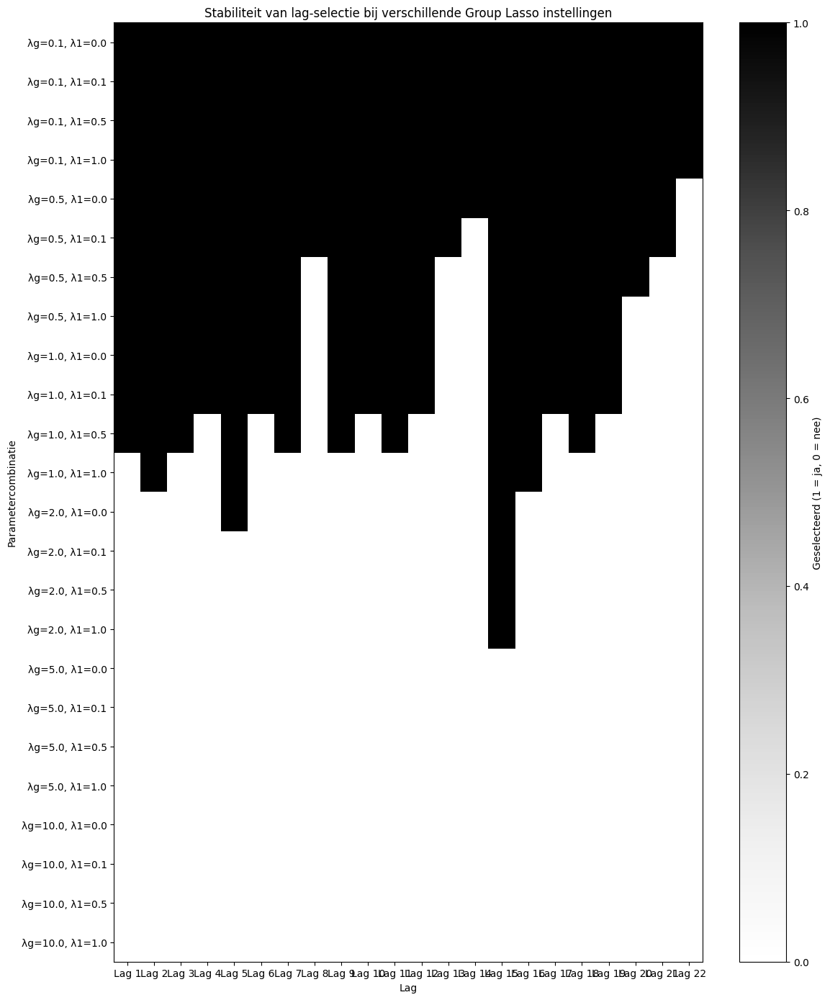

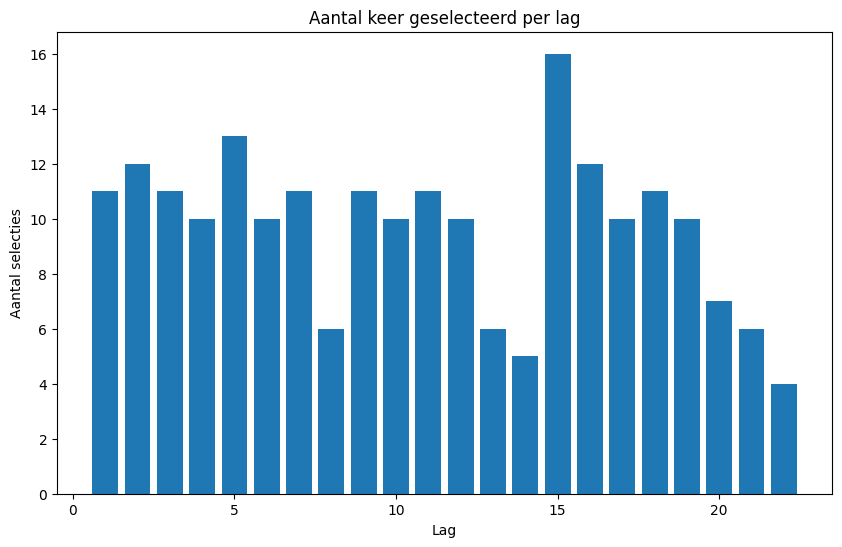

In [58]:
import numpy as np
import pandas as pd
from group_lasso import GroupLasso
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from itertools import product

# ⚙️ Parameters
max_lag = 22  # working days
cause_cols = [col for col in df_all_combined.columns if col.startswith(('User_', 'A_', 'All_'))]
effect_cols = ['fraction_Accepted', 'duration_Accepted']
df = stationary_df[cause_cols + effect_cols].dropna()

# 🔁 Lagged matrix bouwen
def create_lagged_input(df, cause_cols, effect_cols, max_lag):
    X_lagged, Y = [], []
    for t in range(max_lag, len(df)):
        lags = []
        for lag in range(1, max_lag + 1):
            lags.extend(df[cause_cols].iloc[t - lag].values)
        X_lagged.append(lags)
        Y.append(df[effect_cols].iloc[t].values)
    return np.array(X_lagged), np.array(Y)

X_lagged, Y = create_lagged_input(df, cause_cols, effect_cols, max_lag)

# 🔄 Normaliseren
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_lagged)

# 🎯 Group labels per lag (1 groep per blok)
n_causes = len(cause_cols)
groups = np.repeat(np.arange(max_lag), n_causes)

# 📐 Raster van hyperparameters
group_regs = [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
l1_regs = [0.0, 0.1, 0.5, 1.0]
param_grid = list(product(group_regs, l1_regs))

# 📊 Resultaten opslaan
lag_matrix = np.zeros((len(param_grid), max_lag), dtype=int)
param_labels = []
lag_counts = np.zeros(max_lag, dtype=int)

print("🔍 Lag-selectie over (group_reg, l1_reg):")
for i, (group_reg, l1_reg) in enumerate(param_grid):
    model = GroupLasso(
        groups=groups,
        group_reg=group_reg,
        l1_reg=l1_reg,
        fit_intercept=True,
        supress_warning=True
    )
    model.fit(X_scaled, Y)
    selected_lags = np.unique(groups[np.any(model.coef_ != 0, axis=1)])
    for lag in selected_lags:
        lag_matrix[i, lag] = 1
        lag_counts[lag] += 1  # Count the number of times each lag is selected
    label = f"λg={group_reg}, λ1={l1_reg}"
    param_labels.append(label)
    print(f"{label} → geselecteerde lags: {selected_lags + 1 if len(selected_lags) > 0 else 'geen'}")

# 🥇 Select the top 5, 6, or 7 most frequent lags
top_5_lags = np.argsort(lag_counts)[-5:] + 1
top_6_lags = np.argsort(lag_counts)[-6:] + 1
top_7_lags = np.argsort(lag_counts)[-7:] + 1
print("\nTop 5 meest causale lags:", top_5_lags)
print("Top 6 meest causale lags:", top_6_lags)
print("Top 7 meest causale lags:", top_7_lags)

# 🖼️ Visualisatie als matrix
plt.figure(figsize=(12, len(param_grid) * 0.5 + 2))
plt.imshow(lag_matrix, cmap="Greys", aspect="auto")
plt.xticks(range(max_lag), [f"Lag {i+1}" for i in range(max_lag)])
plt.yticks(range(len(param_grid)), param_labels)
plt.xlabel("Lag")
plt.ylabel("Parametercombinatie")
plt.title("Stabiliteit van lag-selectie bij verschillende Group Lasso instellingen")
plt.colorbar(label="Geselecteerd (1 = ja, 0 = nee)")
plt.tight_layout()
plt.show()

# 📊 Plot most influential lags
plt.figure(figsize=(10, 6))
plt.bar(np.arange(1, max_lag+1), lag_counts)
plt.title("Aantal keer geselecteerd per lag")
plt.xlabel("Lag")
plt.ylabel("Aantal selecties")
plt.show()



In [75]:
from statsmodels.tsa.stattools import grangercausalitytests
import pandas as pd

X_columns = X_columns = [col for col in df_all_combined.columns if col.startswith(('User_', 'A_', 'All_'))]
Y_columns = ['fraction_Accepted', 'duration_Accepted']
selected_lags = [2, 5, 15, 16, 18]  # based on group lasso
results = []

# Loop combinations X ➡ Y
for x in X_columns:
    for y in Y_columns:
        try:
            data = stationary_df[[y, x]].dropna()
            test_result = grangercausalitytests(data, maxlag=max(selected_lags), verbose=False)

            result = {
                'X (cause)': x,
                'Y (effect)': y,
            }

            for lag in selected_lags:
                p_val = test_result[lag][0]['ssr_ftest'][1]
                result[f'p_lag{lag}'] = p_val

        except Exception as e:
            result = {'X (cause)': x, 'Y (effect)': y}
            for lag in selected_lags:
                result[f'p_lag{lag}'] = None

        results.append(result)


granger_df_selected = pd.DataFrame(results)

from IPython.display import display
display(granger_df_selected)

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print resul

,X (cause),Y (effect),p_lag2,p_lag5,p_lag15,p_lag16,p_lag18
0,All_C,fraction_Accepted,0.858275,0.798704,0.253839,0.233833,0.174352
1,All_C,duration_Accepted,0.001479,0.002473,0.004788,0.004384,0.011636
2,All_HD,fraction_Accepted,0.854704,0.651508,0.144866,0.157804,0.139427
3,All_HD,duration_Accepted,0.001505,0.004348,0.007051,0.005932,0.012808
4,All_HI,fraction_Accepted,0.619148,0.952657,0.040290,0.008805,0.009015
...,...,...,...,...,...,...,...
113,A_Pending_C,duration_Accepted,0.280888,0.007150,0.174923,0.188453,0.256908
114,A_Cancelled_C,fraction_Accepted,0.886812,0.547144,0.866503,0.815574,0.894340
115,A_Cancelled_C,duration_Accepted,0.442047,0.106044,0.239936,0.304232,0.282924
116,A_Cancelled_HI,fraction_Accepted,0.863993,0.827403,0.600283,0.637101,0.745924


<ipython-input-76-3a635b05fbb5>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


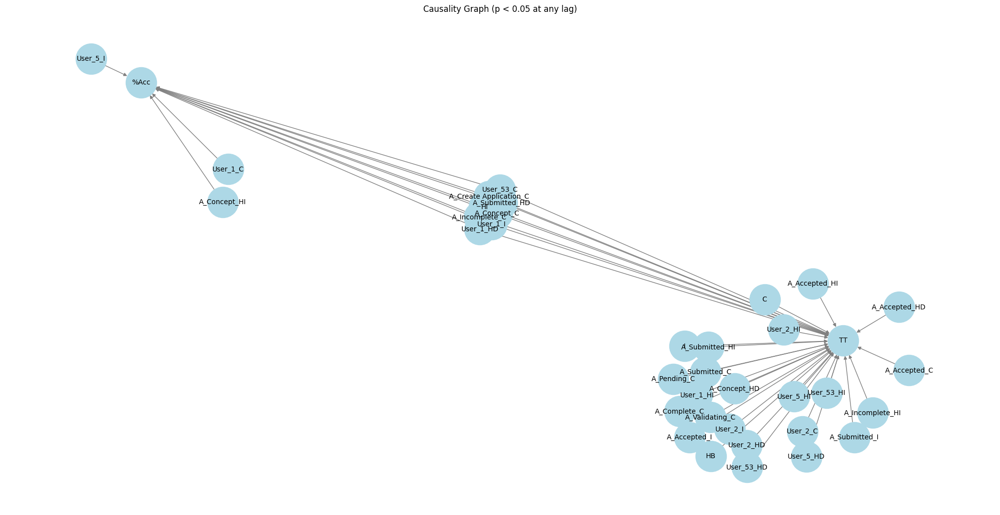

In [76]:
import networkx as nx
import matplotlib.pyplot as plt

G = nx.DiGraph()

for _, row in granger_df_selected.iterrows():
    source = row['X (cause)']
    target = row['Y (effect)']

    #one lag sigificant -> draw edge
    significant = any(
        row.get(f'p_lag{lag}') is not None and row[f'p_lag{lag}'] < 0.05
        for lag in selected_lags
    )

    if significant:
        G.add_edge(source, target)

pos = nx.spring_layout(G, seed=42, k=1.5)

rename_map = {
    'All_C': 'C',
    'All_I': 'I',
    'All_HI': 'HI',
    'All_HD': 'HB',
    'duration_Accepted': 'TT',
    'fraction_Accepted': '%Acc'
}

G = nx.relabel_nodes(G, rename_map)


plt.figure(figsize=(20, 10))
pos = nx.spring_layout(G, seed=42)

nx.draw(
    G,
    pos,
    with_labels=True,
    node_color="lightblue",
    edge_color="gray",
    node_size=2000,
    font_size=10,
    arrows=True
)

plt.title("Causality Graph (p < 0.05 at any lag)")
plt.axis('off')
plt.tight_layout()
plt.show()



<ipython-input-118-f08265b0b41a>:78: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


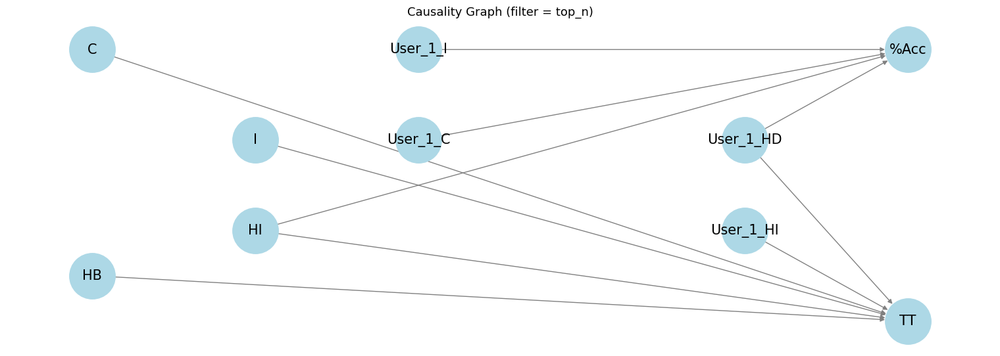

In [118]:
import networkx as nx
import matplotlib.pyplot as plt

# === CONFIGURATION ===
# Choose your filtering strategy:
filter_mode = "top_n"        # Options: "top_n", "by_source", "by_edges"
max_edges = 10               # Used only if filter_mode == "top_n"
include_sources = ['All_HI', 'All_HD']  # Used only if filter_mode == "by_source"
allowed_edges = [('All_C', 'duration_Accepted'), ('All_I', 'fraction_Accepted')]  # Used only if filter_mode == "by_edges"

selected_lags = [2, 5, 6, 7, 15]  # You already defined this earlier

# === GRAPH CONSTRUCTION ===
G = nx.DiGraph()
edge_count = 0

for _, row in granger_df_selected.iterrows():
    source = row['X (cause)']
    target = row['Y (effect)']

    # Filter logic
    if filter_mode == "top_n" and edge_count >= max_edges:
        break
    if filter_mode == "by_source" and source not in include_sources:
        continue
    if filter_mode == "by_edges" and (source, target) not in allowed_edges:
        continue

    # Check Granger significance
    significant = any(
        row.get(f'p_lag{lag}') is not None and row[f'p_lag{lag}'] < 0.05
        for lag in selected_lags
    )

    if significant:
        G.add_edge(source, target)
        edge_count += 1

# === OPTIONAL: Rename nodes for readability ===
rename_map = {
    'All_C': 'C',
    'All_I': 'I',
    'All_HI': 'HI',
    'All_HD': 'HB',
    'duration_Accepted': 'TT',
    'fraction_Accepted': '%Acc'
}
G = nx.relabel_nodes(G, rename_map)

# === DRAW GRAPH ===


pos = {
    'C': (0, 0.3),
    'User_1_C': (1,0.2),
    'User_1_HD' :(2,0.2),
    'User_1_HI' :(2,0.1),
    'User_1_I': (1,0.3),
    'I': (0.5, 0.2),
    'HI': (0.5, 0.1),
    'HB': (0, 0.05),
    '%Acc': (2.5, 0.3),
    'TT': (2.5, 0)
}
plt.figure(figsize=(15, 5))
nx.draw(
    G,
    pos,
    with_labels=True,
    node_color="lightblue",
    edge_color="gray",
    node_size=2500,
    font_size=15,
    arrows=True
)
plt.title(f"Causality Graph (filter = {filter_mode})", fontsize=13)
plt.axis('off')
plt.tight_layout()
plt.show()



In [17]:
!apt-get install -y graphviz
!pip install pygraphviz


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.0/106.0 kB 5.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  error: subprocess-exited-with-error
  
  × Building wheel for pygraphviz (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for pygraphviz
Failed to build pygraphviz
ERROR: ERROR: Failed to build installable wheels for some pyproject.toml based projects (pygraphviz)


<ipython-input-44-8a3d6d08f3b2>:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


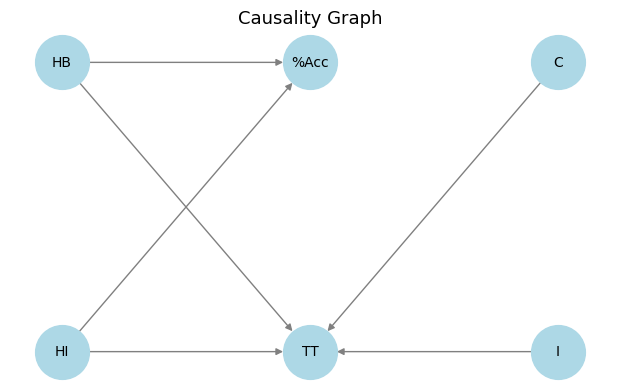

In [44]:
import networkx as nx
import matplotlib.pyplot as plt

# Define node groups
left_causes = ['All_HD', 'All_HI']  # Handover Busy/Idle
right_causes = ['All_C', 'All_I']   # Continuation & Interruption
effects = ['fraction_Accepted', 'duration_Accepted']

# Node renaming for readability
rename_dict = {
    'All_C': 'C',
    'All_HD': 'HB',
    'All_HI': 'HI',
    'All_I': 'I',
    'fraction_Accepted': '%Acc',
    'duration_Accepted': 'TT',
}

# Build manual layout
#spacing = 0.5  # vertical spacing
pos = {}

# Stack left causes (x = 0)
for i, node in enumerate(left_causes):
    pos[node] = (0, -i * spacing)

# Stack effects in center (x = 1)
for i, node in enumerate(effects):
    pos[node] = (1, -i * spacing)

# Stack right causes (x = 2)
for i, node in enumerate(right_causes):
    pos[node] = (2, -i * spacing)

# Build graph
G = nx.DiGraph()
for _, row in granger_df_selected.iterrows():
    source = row['X (cause)']
    target = row['Y (effect)']

    # Only include if any lag is significant
    is_significant = any(
        row[f'p_lag{lag}'] is not None and row[f'p_lag{lag}'] < 0.05
        for lag in selected_lags
    )

    if is_significant:
        G.add_edge(source, target)

# Rename nodes
G = nx.relabel_nodes(G, rename_dict)

# Update layout with renamed keys
pos_renamed = {rename_dict[k]: v for k, v in pos.items() if k in rename_dict}

# Draw graph
plt.figure(figsize=(6, 3.5))
nx.draw(
    G,
    pos=pos_renamed,
    with_labels=True,
    node_color="lightblue",
    edge_color="gray",
    node_size=1500,
    font_size=10,
    arrows=True
)


# Adjust padding (left, bottom, right, top)
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=1)
plt.title("Causality Graph", fontsize=13)
plt.axis('off')
plt.tight_layout()
plt.show()




In [45]:
nx.write_graphml(G, "causality_graph.graphml")


In [46]:
from google.colab import files
files.download("causality_graph.graphml")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [9]:
from statsmodels.tsa.stattools import grangercausalitytests
import pandas as pd

# Kolommen
Y_columns = ['All_C', 'All_HD', 'All_HI', 'All_I']
X_columns = ['fraction_Accepted', 'duration_Accepted']
selected_lags = [2, 5, 6, 7, 15]  # Gebaseerd op Group Lasso-analyse

results = []

# Loop door alle combinaties van X ➡ Y
for x in X_columns:
    for y in Y_columns:
        try:
            data = stationary_df[[y, x]].dropna()
            test_result = grangercausalitytests(data, maxlag=max(selected_lags), verbose=False)

            result = {
                'X (cause)': x,
                'Y (effect)': y,
            }

            for lag in selected_lags:
                p_val = test_result[lag][0]['ssr_ftest'][1]
                result[f'p_lag{lag}'] = p_val

        except Exception as e:
            result = {'X (cause)': x, 'Y (effect)': y}
            for lag in selected_lags:
                result[f'p_lag{lag}'] = None

        results.append(result)

# Zet het in een DataFrame
granger_df_selected = pd.DataFrame(results)

# Bekijk de resultaten
from IPython.display import display
display(granger_df_selected)

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print resul

,X (cause),Y (effect),p_lag2,p_lag5,p_lag6,p_lag7,p_lag15
0,fraction_Accepted,All_C,0.000571,0.000319,0.004407,0.004173,0.016976
1,fraction_Accepted,All_HD,0.002652,0.000893,0.006076,0.004386,0.026331
2,fraction_Accepted,All_HI,0.021535,0.084998,0.107103,0.070451,0.049004
3,fraction_Accepted,All_I,0.026857,0.023947,0.031324,0.028812,0.028609
4,duration_Accepted,All_C,0.089881,0.008745,0.014641,0.013698,0.002678
5,duration_Accepted,All_HD,0.047732,0.008993,0.613306,0.683917,0.133341
6,duration_Accepted,All_HI,0.061016,0.036267,0.950144,0.972666,0.559439
7,duration_Accepted,All_I,0.010732,0.001516,0.144034,0.203354,0.027141


In [10]:
# Functie om kleur te bepalen op basis van p-waarde
def color_pval(val):
    if pd.isna(val):
        return ''
    elif val < 0.05:
        return 'color: green'
    else:
        return 'color: red'

# Pas de stijl toe op de DataFrame
styled_df = granger_df_selected.style.applymap(
    color_pval,
    subset=[col for col in granger_df_selected.columns if col.startswith('p_lag')]
)

# Toon de gestylede DataFrame
display(styled_df)


<ipython-input-10-263a20e10463>:11: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styled_df = granger_df_selected.style.applymap(


,X (cause),Y (effect),p_lag2,p_lag5,p_lag6,p_lag7,p_lag15
0,fraction_Accepted,All_C,0.000571,0.000319,0.004407,0.004173,0.016976
1,fraction_Accepted,All_HD,0.002652,0.000893,0.006076,0.004386,0.026331
2,fraction_Accepted,All_HI,0.021535,0.084998,0.107103,0.070451,0.049004
3,fraction_Accepted,All_I,0.026857,0.023947,0.031324,0.028812,0.028609
4,duration_Accepted,All_C,0.089881,0.008745,0.014641,0.013698,0.002678
5,duration_Accepted,All_HD,0.047732,0.008993,0.613306,0.683917,0.133341
6,duration_Accepted,All_HI,0.061016,0.036267,0.950144,0.972666,0.559439
7,duration_Accepted,All_I,0.010732,0.001516,0.144034,0.203354,0.027141


In [11]:
!pip install networkx
import networkx as nx
import matplotlib.pyplot as plt


#Predicting time series (NOT FOR NOW) -> skip

In [ ]:
import pandas as pd
from DyLoPro import DynamicLogPlots

# Sorteer op case en timestamp
df_wt = df_behavior.sort_values(by=['case:concept:name', 'time:timestamp'])

# Bereken de wachttijd (per week)
df_wt['waiting_time'] = df_wt.groupby('case:concept:name')['time:timestamp'].diff().dt.total_seconds()/ 60 / 60

# Vul NaN (eerste event per case) op met 0 en forceer type naar float
df_wt['waiting_time'] = pd.to_numeric(df_wt['waiting_time'], errors='coerce').astype(float).fillna(0)

# Controleer types
print(df_wt.dtypes)
print(df_wt.head())
print('Waiting times berekend en toegeovoegd')

case:concept:name            object
concept:name                 object
org:resource                 object
time:timestamp       datetime64[ns]
behavior                     object
waiting_time                float64
dtype: object
        case:concept:name            concept:name org:resource  \
0  Application_1000086665             A_Submitted       User_1   
1  Application_1000086665          W_Handle leads       User_1   
2  Application_1000086665          W_Handle leads       User_1   
3  Application_1000086665  W_Complete application       User_1   
4  Application_1000086665               A_Concept       User_1   

           time:timestamp             behavior  waiting_time  
0 2016-08-03 15:57:21.734  Direct Continuation      0.000000  
1 2016-08-03 15:57:21.963  Direct Continuation      0.000064  
2 2016-08-03 15:58:28.286  Direct Continuation      0.018423  
3 2016-08-03 15:58:28.293  Direct Continuation      0.000002  
4 2016-08-03 15:58:28.299  Direct Continuation      0.0000

In [ ]:
#onderliggende tijdsreeks genereren
import pandas as pd

# Zet timestamps om naar datetime, voor de zekerheid
df_wt["time:timestamp"] = pd.to_datetime(df_wt["time:timestamp"])

# Zet timestamps om naar week en bereken gemiddelde wachttijd per week
time_series = df_wt.groupby(df_wt["time:timestamp"].dt.to_period("W"))["waiting_time"].mean().reset_index()

# Converteer periode naar datetime (begin van de week)
time_series["time:timestamp"] = time_series["time:timestamp"].dt.start_time

# Opslaan als CSV voor verdere analyse
time_series.to_csv("waiting_time_series.csv", index=False)

print(time_series.head())


  time:timestamp  waiting_time
0     2015-12-28      0.584992
1     2016-01-04      3.084234
2     2016-01-11      6.470440
3     2016-01-18      7.367996
4     2016-01-25     10.943458


In [ ]:
#preprocessen van de data
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

# Laad de tijdreeksdata in
time_series = pd.read_csv("waiting_time_series.csv", parse_dates=["time:timestamp"])

# Normaliseer de wachttijdwaarden tussen 0 en 1
scaler = MinMaxScaler()
time_series["waiting_time"] = scaler.fit_transform(time_series[["waiting_time"]])

# Zet de data om naar numpy-array
data = time_series["waiting_time"].values

# Parameters voor LSTM
look_back = 5  # Hoeveel vorige weken gebruiken we om de volgende te voorspellen?

# Gebruik TimeseriesGenerator om de data voor te bereiden
generator = TimeseriesGenerator(data, data, length=look_back, batch_size=32)

# Split de data in een train- en testset (80% trainen, 20% testen)
train_size = int(len(generator) * 0.8)
train_generator = TimeseriesGenerator(data[:train_size+look_back], data[:train_size+look_back], length=look_back, batch_size=32)
test_generator = TimeseriesGenerator(data[train_size:], data[train_size:], length=look_back, batch_size=32)

print(f"Aantal trainingssamples: {len(train_generator)}")
print(f"Aantal testsamples: {len(test_generator)}")


FileNotFoundError: [Errno 2] No such file or directory: 'waiting_time_series.csv'

Epoch 1/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0246 - val_loss: 0.0804
Epoch 2/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0025 - val_loss: 0.0920
Epoch 3/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0015 - val_loss: 0.1008
Epoch 4/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2120e-04 - val_loss: 0.0831
Epoch 5/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 0.0939
Epoch 6/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0971
Epoch 7/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 0.0994
Epoch 8/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0980
Epoch 9/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.6947e-04 - val_loss: 0.0945
Epoch 10/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0932
Epoch 11/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 0.0930
Epoch 12/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011

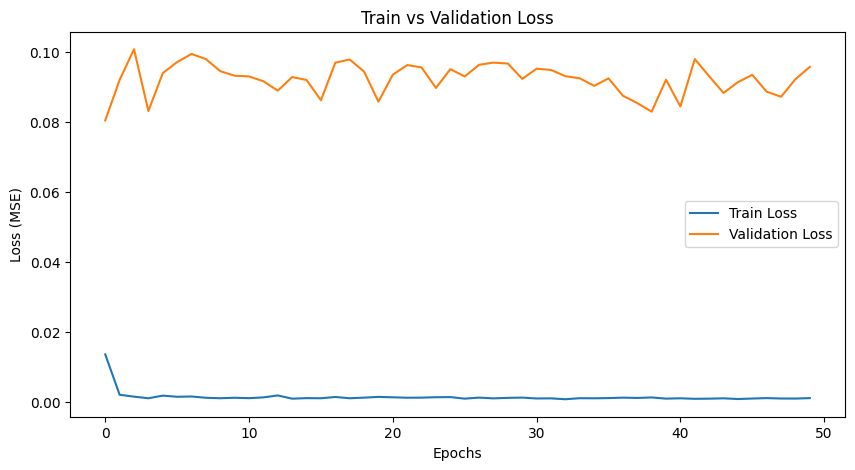

In [ ]:
import matplotlib.pyplot as plt

# Bouw het LSTM-model versie 1
model = Sequential([
    LSTM(50, activation='relu', return_sequences=True, input_shape=(look_back, 1)),
    Dropout(0.2),
    LSTM(50, activation='relu'),
    Dropout(0.2),
    Dense(1)
])

# Compileer het model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Train het model
history = model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1)

# Plot de loss (MSE) per epoch
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Train vs Validation Loss')
plt.legend()
plt.show()


Epoch 1/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.6003 - val_loss: 0.4478
Epoch 2/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2891 - val_loss: 0.2703
Epoch 3/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1377 - val_loss: 0.1775
Epoch 4/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0627 - val_loss: 0.1368
Epoch 5/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0274 - val_loss: 0.1156
Epoch 6/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0122 - val_loss: 0.1134
Epoch 7/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0062 - val_loss: 0.1056
Epoch 8/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0035 - val_loss: 0.1006
Epoch 9/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0020 - val_loss: 0.1073
Epoch 10/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0015 - val_loss: 0.1066
Epoch 11/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0014 - val_loss: 0.1071
Epoch 12/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0021 - val_l

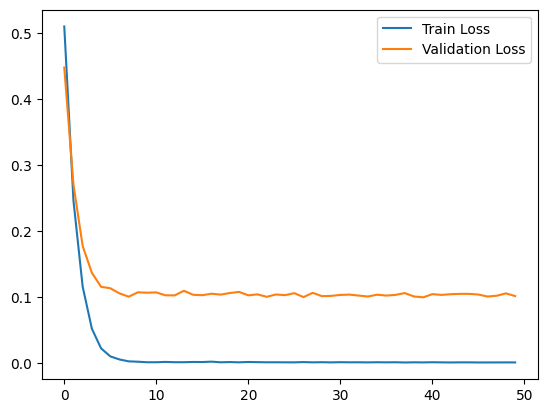

In [ ]:
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Sequential

# Nieuw LSTM-model met extra regularisatie
model = Sequential([
    LSTM(50, activation='relu', return_sequences=True, kernel_regularizer=l2(0.01), input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.4),

    LSTM(25, activation='relu', kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Dropout(0.4),

    Dense(1)
])

# Compileer het model
model.compile(optimizer='adam', loss='mse')

# Train het model
history = model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1)

# Toon de train- en validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()


  time:timestamp  waiting_time
0     2016-01-01      0.003816
1     2016-01-02      0.898452
2     2016-01-03      0.003845
3     2016-01-04      1.614756
4     2016-01-05      1.508927
Aantal trainingssamples: 307
Aantal testsamples: 77
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


307/307 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.3034 - val_loss: 0.0528
Epoch 2/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0086 - val_loss: 0.0549
Epoch 3/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0047 - val_loss: 0.0492
Epoch 4/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0048 - val_loss: 0.0530
Epoch 5/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0064 - val_loss: 0.0595
Epoch 6/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0057 - val_loss: 0.0545
Epoch 7/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0061 - val_loss: 0.0554
Epoch 8/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0049 - val_loss: 0.0520
Epoch 9/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0064 - val_loss: 0.0538
Epoch 10/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0055 - val_loss: 0.0500
Epoch 11/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0062 - val_loss: 0.0568
Epoch 12/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step

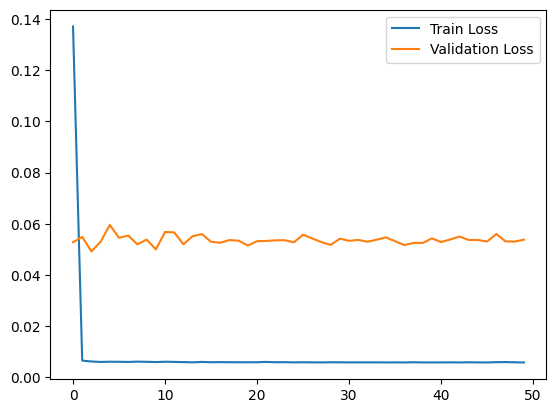

In [ ]:
import pandas as pd
from DyLoPro import DynamicLogPlots

# Sorteer op case en timestamp
df_wt = df_behavior.sort_values(by=['case:concept:name', 'time:timestamp'])

# Bereken de wachttijd per uur
df_wt['waiting_time'] = df_wt.groupby('case:concept:name')['time:timestamp'].diff().dt.total_seconds() / 60 / 60

# Vul NaN (eerste event per case) op met 0 en forceer type naar float
df_wt['waiting_time'] = pd.to_numeric(df_wt['waiting_time'], errors='coerce').astype(float).fillna(0)

# Zet timestamps om naar datetime
df_wt["time:timestamp"] = pd.to_datetime(df_wt["time:timestamp"])

# **Nu: Gemiddelde wachttijd per DAG in plaats van per week**
time_series = df_wt.groupby(df_wt["time:timestamp"].dt.to_period("D"))["waiting_time"].mean().reset_index()

# Converteer periode naar datetime (begin van de dag)
time_series["time:timestamp"] = time_series["time:timestamp"].dt.start_time

# Opslaan als CSV voor verdere analyse
time_series.to_csv("waiting_time_series_daily.csv", index=False)

print(time_series.head())


### **Preprocessen van de tijdreeksdata**
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

# Laad de tijdreeksdata in
time_series = pd.read_csv("waiting_time_series_daily.csv", parse_dates=["time:timestamp"])

# Normaliseer de wachttijdwaarden tussen 0 en 1
scaler = MinMaxScaler()
time_series["waiting_time"] = scaler.fit_transform(time_series[["waiting_time"]])

# Zet de data om naar numpy-array
data = time_series["waiting_time"].values

# **Kies een nieuw look_back venster, bijv. 14 dagen (2 weken)**
look_back = 14

# Gebruik TimeseriesGenerator om de data voor te bereiden
generator = TimeseriesGenerator(data, data, length=look_back, batch_size=1)

# **Nieuwe train/test split**
train_size = int(len(generator) * 0.8)
train_generator = TimeseriesGenerator(data[:train_size+look_back], data[:train_size+look_back], length=look_back, batch_size=1)
test_generator = TimeseriesGenerator(data[train_size:], data[train_size:], length=look_back, batch_size=1)

print(f"Aantal trainingssamples: {len(train_generator)}")
print(f"Aantal testsamples: {len(test_generator)}")


### **LSTM Model met extra regularisatie**
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Sequential

# Nieuw LSTM-model met extra regularisatie
model = Sequential([
    LSTM(50, activation='relu', return_sequences=True, kernel_regularizer=l2(0.01), input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.4),

    LSTM(25, activation='relu', kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Dropout(0.4),

    Dense(1)
])

# Compileer het model
model.compile(optimizer='adam', loss='mse')

# Train het model
history = model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1)

# Toon de train- en validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()


Epoch 1/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.5979 - val_loss: 0.0524
Epoch 2/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0067 - val_loss: 0.0560
Epoch 3/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0057 - val_loss: 0.0543
Epoch 4/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0056 - val_loss: 0.0556
Epoch 5/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0055 - val_loss: 0.0577
Epoch 6/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0061 - val_loss: 0.0526
Epoch 7/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0072 - val_loss: 0.0551
Epoch 8/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0057 - val_loss: 0.0522
Epoch 9/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0069 - val_loss: 0.0574
Epoch 10/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0050 - val_loss: 0.0532
Epoch 11/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0053 - val_loss: 0.0528
Epoch 12/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10

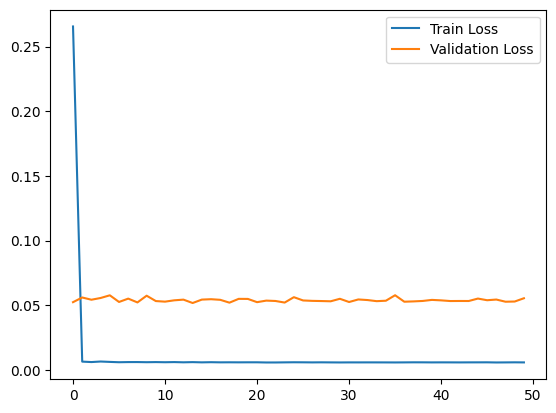

In [ ]:
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Sequential

# Nieuw LSTM-model met extra regularisatie
model = Sequential([
    LSTM(50, activation='relu', return_sequences=True, kernel_regularizer=l2(0.02), input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.5),

    LSTM(25, activation='relu', kernel_regularizer=l2(0.02)),
    BatchNormalization(),
    Dropout(0.5),

    Dense(1)
])

# Compileer het model
model.compile(optimizer='adam', loss='mse')

# Train het model
history = model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1)

# Toon de train- en validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()


Epoch 1/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0053 - val_loss: 0.0539
Epoch 2/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0059 - val_loss: 0.0549
Epoch 3/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0064 - val_loss: 0.0541
Epoch 4/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0053 - val_loss: 0.0544
Epoch 5/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0057 - val_loss: 0.0528
Epoch 6/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0070 - val_loss: 0.0526
Epoch 7/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0059 - val_loss: 0.0566
Epoch 8/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0067 - val_loss: 0.0540
Epoch 9/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0061 - val_loss: 0.0577
Epoch 10/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0059 - val_loss: 0.0580
Epoch 11/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0070 - val_loss: 0.0561
Epoch 12/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/s

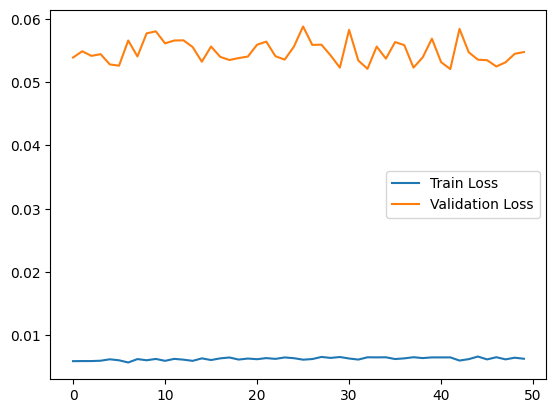

In [ ]:
from tensorflow.keras.optimizers import RMSprop

# Compileer het model opnieuw met RMSprop
model.compile(optimizer=RMSprop(learning_rate=0.001), loss='mse')

# Train het model
history = model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1)

# Toon de train- en validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()


Epoch 1/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - loss: 0.2206 - val_loss: 0.0564
Epoch 2/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0083 - val_loss: 0.0528
Epoch 3/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0053 - val_loss: 0.0555
Epoch 4/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0061 - val_loss: 0.0529
Epoch 5/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0081 - val_loss: 0.0591
Epoch 6/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0056 - val_loss: 0.0563
Epoch 7/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0062 - val_loss: 0.0552
Epoch 8/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0051 - val_loss: 0.0546
Epoch 9/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0057 - val_loss: 0.0547
Epoch 10/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0079 - val_loss: 0.0524
Epoch 11/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0077 - val_loss: 0.0560
Epoch 12/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 10m

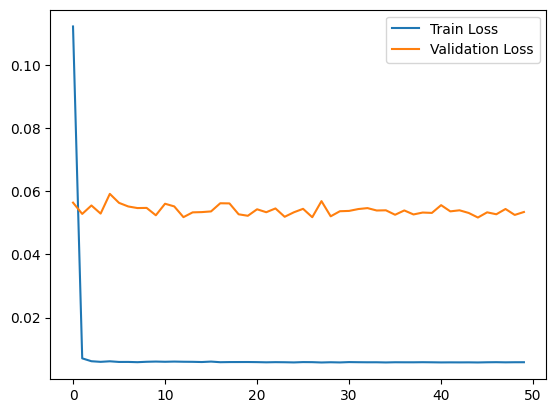

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam

# Nieuw LSTM-model met minder units
model = Sequential([
    LSTM(30, activation='relu', return_sequences=True, kernel_regularizer=l2(0.01), input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.3),

    LSTM(15, activation='relu', kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Dropout(0.3),

    Dense(1)
])

# Compileer met Adam
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Train het model
history = model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1)

# Plot de loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()


Epoch 1/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.3155 - val_loss: 0.0564
Epoch 2/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0070 - val_loss: 0.0536
Epoch 3/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0079 - val_loss: 0.0555
Epoch 4/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0070 - val_loss: 0.0510
Epoch 5/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0071 - val_loss: 0.0545
Epoch 6/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0069 - val_loss: 0.0553
Epoch 7/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0046 - val_loss: 0.0524
Epoch 8/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0049 - val_loss: 0.0506
Epoch 9/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0058 - val_loss: 0.0534
Epoch 10/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0065 - val_loss: 0.0541
Epoch 11/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0060 - val_loss: 0.0543
Epoch 12/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/ste

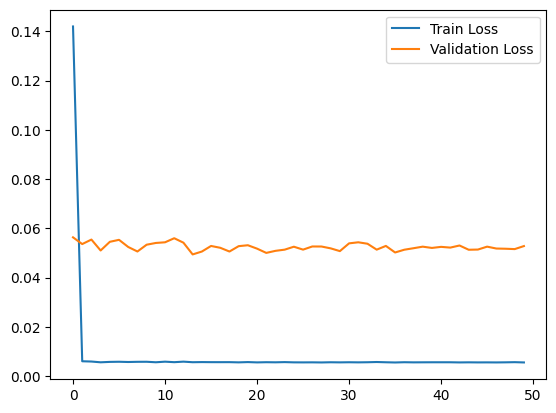

In [ ]:
# Nieuwe look_back waarde
look_back = 10

# Opnieuw data genereren met aangepaste look_back
train_generator = TimeseriesGenerator(data[:train_size+look_back], data[:train_size+look_back], length=look_back, batch_size=1)
test_generator = TimeseriesGenerator(data[train_size:], data[train_size:], length=look_back, batch_size=1)

# Nieuw model trainen
model = Sequential([
    LSTM(50, activation='relu', return_sequences=True, kernel_regularizer=l2(0.01), input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.3),

    LSTM(25, activation='relu', kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Dropout(0.3),

    Dense(1)
])

# Compileer met Adam
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Train het model
history = model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1)

# Plot de loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()


Epoch 1/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0048 - val_loss: 0.0518
Epoch 2/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0051 - val_loss: 0.0523
Epoch 3/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0062 - val_loss: 0.0526
Epoch 4/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0054 - val_loss: 0.0517
Epoch 5/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0071 - val_loss: 0.0530
Epoch 6/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0042 - val_loss: 0.0520
Epoch 7/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0052 - val_loss: 0.0527
Epoch 8/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0052 - val_loss: 0.0521
Epoch 9/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0061 - val_loss: 0.0527
Epoch 10/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0062 - val_loss: 0.0522
Epoch 11/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0056 - val_loss: 0.0525
Epoch 12/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/ste

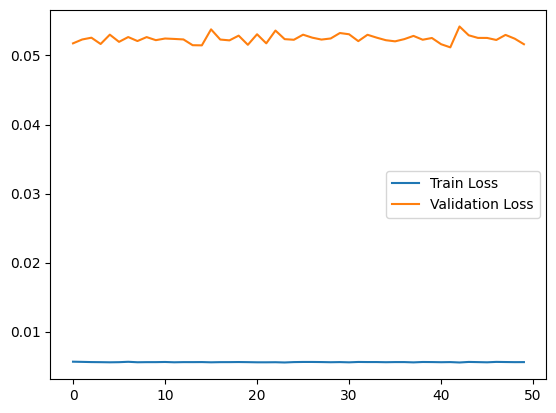

In [ ]:
from tensorflow.keras.optimizers import Adam

# Gebruik een lagere learning rate
optimizer = Adam(learning_rate=0.0005)

# Compileer opnieuw met deze optimizer
model.compile(optimizer=optimizer, loss='mse')

# Train opnieuw
history = model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1)

# Plot de loss opnieuw
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()


Epoch 1/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.2862 - val_loss: 0.1081
Epoch 2/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0402 - val_loss: 0.0584
Epoch 3/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0082 - val_loss: 0.0528
Epoch 4/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0059 - val_loss: 0.0524
Epoch 5/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0056 - val_loss: 0.0519
Epoch 6/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0064 - val_loss: 0.0534
Epoch 7/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0057 - val_loss: 0.0527
Epoch 8/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0050 - val_loss: 0.0535
Epoch 9/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0047 - val_loss: 0.0525
Epoch 10/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0053 - val_loss: 0.0513
Epoch 11/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0061 - val_loss: 0.0517
Epoch 12/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step

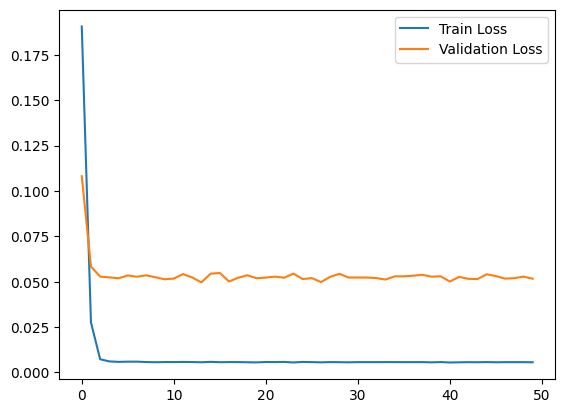

In [ ]:
# Nieuw LSTM-model met meer regularisatie en minder complexiteit
model = Sequential([
    LSTM(30, activation='relu', return_sequences=True, kernel_regularizer=l2(0.01), input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.5),  # Dropout verhoogd naar 0.5

    LSTM(15, activation='relu', kernel_regularizer=l2(0.01)),  # Minder LSTM-units
    BatchNormalization(),
    Dropout(0.5),  # Dropout verhoogd naar 0.5

    Dense(1)
])

# Compileer opnieuw met een lagere learning rate
optimizer = Adam(learning_rate=0.0005)
model.compile(optimizer=optimizer, loss='mse')

# Train opnieuw
history = model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1)

# Plot de loss opnieuw
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()


In [ ]:
#tuning
!pip install keras-tuner


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.1 MB/s eta 0:00:00


Trial 10 Complete [00h 00m 05s]

Best val_loss So Far: 0.04261254146695137
Total elapsed time: 00h 06m 10s
Beste configuratie: {'units1': 20, 'return_sequences': 1, 'dropout1': 0.3, 'second_layer': False, 'learning_rate': 0.001, 'units2': 30}
Epoch 1/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 0.0241 - val_loss: 0.0500
Epoch 2/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0064 - val_loss: 0.0463
Epoch 3/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0061 - val_loss: 0.0495
Epoch 4/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0073 - val_loss: 0.0511
Epoch 5/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0064 - val_loss: 0.0539
Epoch 6/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0056 - val_loss: 0.0532
Epoch 7/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0074 - val_loss: 0.0530
Epoch 8/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0056 - val_loss: 0.0545
Epoch 9/50
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0065 - 

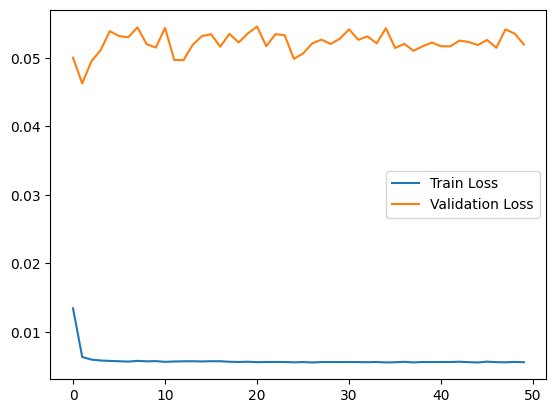

In [ ]:
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam

# Definieer de modelbouwfunctie
def build_model(hp):
    model = Sequential()

    # Eerste LSTM laag
    model.add(LSTM(
        hp.Int("units1", min_value=20, max_value=50, step=10),
        activation='relu',
        return_sequences=hp.Choice("return_sequences", [True, False]),
        kernel_regularizer=l2(0.01),
        input_shape=(look_back, 1)
    ))
    model.add(BatchNormalization())
    model.add(Dropout(hp.Choice("dropout1", [0.3, 0.4, 0.5, 0.6])))

    # Optioneel een tweede LSTM laag
    if hp.Boolean("second_layer"):
        model.add(LSTM(
            hp.Int("units2", min_value=10, max_value=30, step=10),
            activation='relu',
            kernel_regularizer=l2(0.01)
        ))
        model.add(BatchNormalization())
        model.add(Dropout(hp.Choice("dropout2", [0.3, 0.4, 0.5, 0.6])))

    # Output layer
    model.add(Dense(1))

    # Compileer het model met variërende learning rates
    model.compile(
        optimizer=Adam(learning_rate=hp.Choice("learning_rate", [0.001, 0.0005, 0.0001])),
        loss="mse"
    )

    return model

# Hyperparameter tuning met RandomizedSearch
tuner = kt.RandomSearch(
    build_model,
    objective="val_loss",
    max_trials=10,  # Aantal verschillende combinaties
    executions_per_trial=1,  # Hoe vaak elke configuratie wordt getest
    directory="hyperparam_tuning",
    project_name="LSTM_waiting_time"
)

# Start de tuning
tuner.search(train_generator, epochs=30, validation_data=test_generator, verbose=1)

# Beste hyperparameters tonen
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print(f"Beste configuratie: {best_hps.values}")

# Train het beste model
best_model = tuner.hypermodel.build(best_hps)
history = best_model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1)

# Plot loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()


In [ ]:
import keras_tuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

# Functie om het model te bouwen met hyperparameter tuning
def build_model(hp):
    model = Sequential()

    # Eerste LSTM-laag
    model.add(LSTM(
        units=hp.Int('units1', min_value=10, max_value=100, step=10),
        activation='relu',
        return_sequences=True,
        kernel_regularizer=l2(0.01),
        input_shape=(look_back, 1)
    ))
    model.add(BatchNormalization())
    model.add(Dropout(hp.Float('dropout1', min_value=0.1, max_value=0.3, step=0.05)))

    # Tweede optionele LSTM-laag
    if hp.Boolean('second_layer'):
        model.add(LSTM(
            units=hp.Int('units2', min_value=10, max_value=50, step=10),
            activation='relu',
            kernel_regularizer=l2(0.01)
        ))
        model.add(BatchNormalization())
        model.add(Dropout(hp.Float('dropout2', min_value=0.1, max_value=0.3, step=0.05)))

    # Output-laag
    model.add(Dense(1))

    # Learning rate tuning
    learning_rate = hp.Choice('learning_rate', values=[0.0001, 0.0003, 0.001, 0.003])
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mse')

    return model

# Instellen van de tuner
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=50,  # Meer trials uitvoeren
    executions_per_trial=1,
    directory='hyperparam_tuning',
    project_name='LSTM_tuning'
)

# Start hyperparameter tuning
tuner.search(train_generator, epochs=50, validation_data=test_generator, verbose=1)

# Print beste hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print(f"Beste configuratie: {best_hps.values}")


Trial 50 Complete [00h 00m 40s]
val_loss: 0.09639263153076172

Best val_loss So Far: 0.0798100009560585
Total elapsed time: 00h 31m 32s
Beste configuratie: {'units1': 10, 'dropout1': 0.1, 'second_layer': False, 'learning_rate': 0.0001, 'units2': 20, 'dropout2': 0.15000000000000002}


In [ ]:
time_series.to_csv("waiting_time_series_daily.csv", index=False)
print("Bestand opgeslagen als 'waiting_time_series.csv' in de huidige werkmap.")



Bestand opgeslagen als 'waiting_time_series.csv' in de huidige werkmap.


In [ ]:
import os
print("Bestand staat hier:", os.getcwd())  # Laat zien waar het bestand is opgeslagen


Bestand staat hier: /content


In [ ]:
from google.colab import files
files.download("/content/waiting_time_series_full.csv")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Vanaf hier volgende keer

Hier data inladen: waiting_time_series_full.csv

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving waiting_time_series_full.csv to waiting_time_series_full.csv


In [ ]:
import tensorflow as tf
print("GPU beschikbaar:", tf.config.list_physical_devices('GPU'))


GPU beschikbaar: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
import tensorflow as tf
tf.config.experimental.set_memory_growth(tf.config.list_physical_devices('GPU')[0], True)


In [ ]:
import pandas as pd
from DyLoPro import DynamicLogPlots

# Sorteer op case en timestamp
df_wt = df_behavior.sort_values(by=['case:concept:name', 'time:timestamp'])

# Bereken de wachttijd (per week)
df_wt['waiting_time'] = df_wt.groupby('case:concept:name')['time:timestamp'].diff().dt.total_seconds()/ 60 / 60 / 24

# Vul NaN (eerste event per case) op met 0 en forceer type naar float
df_wt['waiting_time'] = pd.to_numeric(df_wt['waiting_time'], errors='coerce').astype(float).fillna(0)

# Controleer types
print(df_wt.dtypes)
print(df_wt.head())
print('Waiting times berekend en toegeovoegd')

ModuleNotFoundError: No module named 'DyLoPro'

In [ ]:
# Zet timestamps om naar datetime (voor de zekerheid)
df_wt["time:timestamp"] = pd.to_datetime(df_wt["time:timestamp"])

# Bewaar het bestand met alle events (zonder aggregatie)
df_wt.to_csv("waiting_time_series_full.csv", index=False)

print(df_wt.head())  # Controleer de eerste rijen

        case:concept:name            concept:name org:resource  \
0  Application_1000086665             A_Submitted       User_1   
1  Application_1000086665          W_Handle leads       User_1   
2  Application_1000086665          W_Handle leads       User_1   
3  Application_1000086665  W_Complete application       User_1   
4  Application_1000086665               A_Concept       User_1   

           time:timestamp             behavior  waiting_time  
0 2016-08-03 15:57:21.734  Direct Continuation  0.000000e+00  
1 2016-08-03 15:57:21.963  Direct Continuation  2.650463e-06  
2 2016-08-03 15:58:28.286  Direct Continuation  7.676273e-04  
3 2016-08-03 15:58:28.293  Direct Continuation  8.101852e-08  
4 2016-08-03 15:58:28.299  Direct Continuation  6.944444e-08  


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

#  Laad de tijdreeksdata in (originele dataset zonder aggregatie)
df_wt = pd.read_csv("waiting_time_series_full.csv", parse_dates=["time:timestamp"])

#  Controleer en verwijder eventuele NaN of oneindige waarden
df_wt = df_wt.dropna()  # Verwijder NaN-waarden
df_wt = df_wt[np.isfinite(df_wt["waiting_time"])]  # Verwijder oneindige waarden

#  Normaliseer de wachttijdwaarden tussen 0 en 1
scaler = MinMaxScaler()
df_wt["waiting_time"] = scaler.fit_transform(df_wt[["waiting_time"]])

# Zet de data om naar numpy-array
data = df_wt["waiting_time"].values

#  Bepaal de window size (hoeveel vorige waarden je model gebruikt)
look_back = 10

#  Gebruik TimeseriesGenerator om de data voor te bereiden
generator = TimeseriesGenerator(data, data, length=look_back, batch_size=64)

# Split de data in een train- en testset (80% trainen, 20% testen)
train_size = int(len(data) * 0.8)

train_generator = TimeseriesGenerator(data[:train_size], data[:train_size], length=look_back, batch_size=64)
test_generator = TimeseriesGenerator(data[train_size - look_back:], data[train_size - look_back:], length=look_back, batch_size=64)

# Print statistieken
print(f"Aantal trainingssamples: {len(train_generator)}")
print(f"Aantal testsamples: {len(test_generator)}")


Aantal trainingssamples: 14635
Aantal testsamples: 3659


In [ ]:
import tensorflow as tf
tf.config.optimizer.set_jit(True)  # Zet XLA aan voor snellere training


Epoch 1/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 71s 4ms/step - loss: 0.0013 - val_loss: 4.0071e-04
Epoch 2/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 61s 4ms/step - loss: 3.8684e-04 - val_loss: 3.5088e-04
Epoch 3/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 62s 4ms/step - loss: 3.3774e-04 - val_loss: 3.2915e-04
Epoch 4/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 61s 4ms/step - loss: 3.0993e-04 - val_loss: 3.6074e-04
Epoch 5/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 61s 4ms/step - loss: 2.9972e-04 - val_loss: 3.0191e-04
Epoch 6/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 61s 4ms/step - loss: 2.9130e-04 - val_loss: 3.1495e-04
Epoch 7/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 61s 4ms/step - loss: 2.8632e-04 - val_loss: 3.1100e-04
Epoch 8/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 61s 4ms/step - loss: 2.8380e-04 - val_loss: 3.1636e-04
Epoch 9/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 61s 4ms/step - loss: 2.7595e-04 - val_loss: 3.0648e-04
Epoch 10/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 61s 4ms/step - loss: 2.8809e-04 - val_loss: 3.3602e-04
Epoch 11/50
1

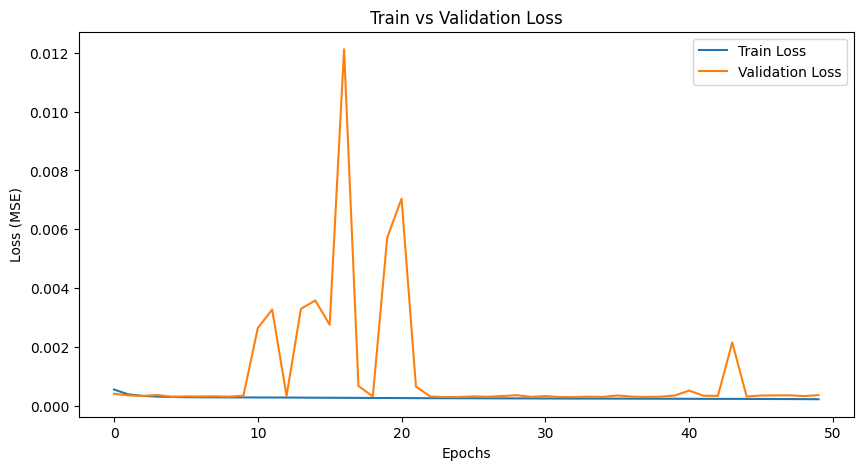

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.layers import BatchNormalization

from tensorflow.keras.optimizers import Adam

model = Sequential([
    LSTM(100, activation='relu', return_sequences=True, input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.3),  # Iets hogere dropout
    LSTM(50, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(1)
])

model.compile(optimizer=Adam(learning_rate=0.0003), loss='mse')  # Langzamer leren

#early_stopping = EarlyStopping(monitor="val_loss", patience=8, restore_best_weights=True)  # Geduldiger

history = model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1)#, callbacks=[early_stopping])


#  Plot de loss (MSE) per epoch
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Train vs Validation Loss')
plt.legend()
plt.show()


#Predicties met LSTM

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7318/7318 ━━━━━━━━━━━━━━━━━━━━ 41s 5ms/step - loss: 5.8382e-04 - val_loss: 4.6068e-04 - learning_rate: 3.0000e-04
Epoch 2/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 4.0415e-04 - val_loss: 4.1498e-04 - learning_rate: 3.0000e-04
Epoch 3/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 3.8874e-04 - val_loss: 3.9783e-04 - learning_rate: 3.0000e-04
Epoch 4/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 3.9968e-04 - val_loss: 5.6524e-04 - learning_rate: 3.0000e-04
Epoch 5/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 3.9689e-04 - val_loss: 3.9591e-04 - learning_rate: 3.0000e-04
Epoch 6/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 3.8963e-04 - val_loss: 4.0725e-04 - learning_rate: 3.0000e-04
Epoch 7/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 3.8510e-04 - val_loss: 4.5539e-04 - learning_rate: 1.5000e-04
Epoch 8/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 3.8476e-04 - val_loss: 3.9825e-04 - learning_rate: 1.5000e-04
Epoch 9/50


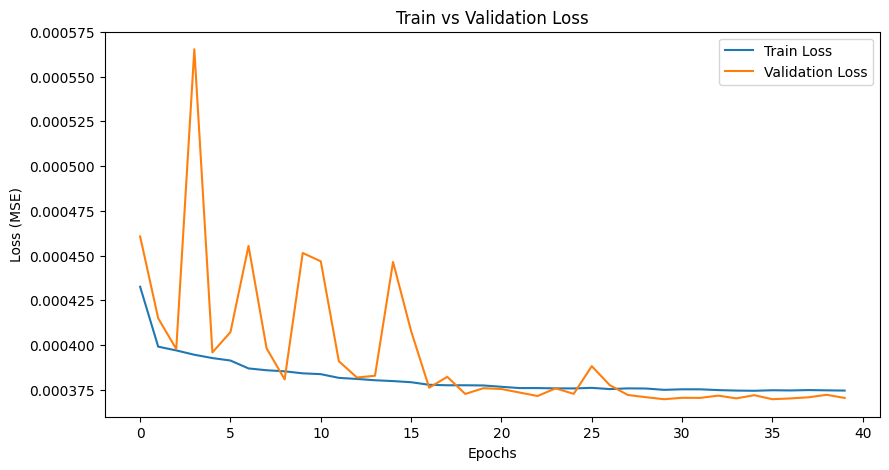

1830/1830 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step


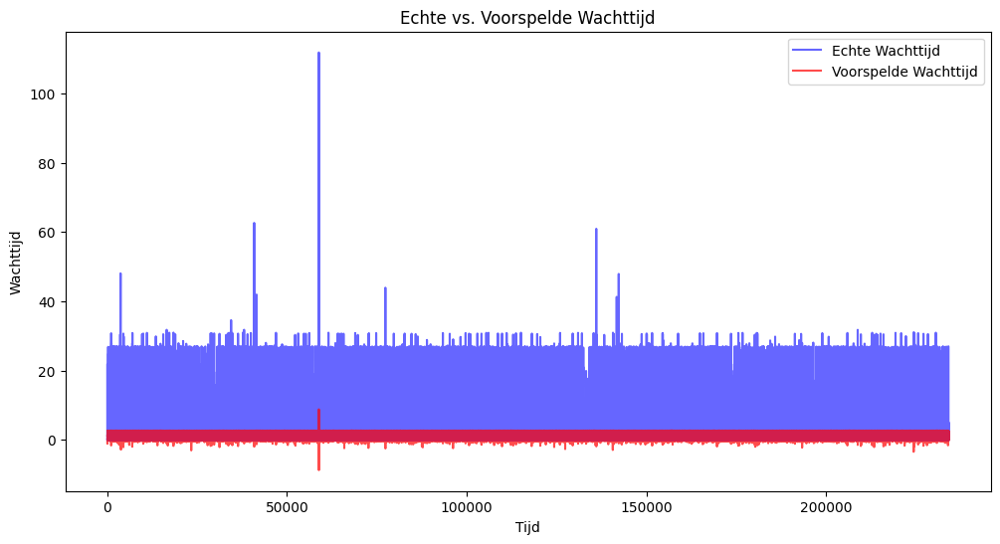

In [ ]:
#2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import AdamW, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

#  Laad de tijdreeksdata in
df_wt = pd.read_csv("waiting_time_series_full.csv", parse_dates=["time:timestamp"])

#  Controleer en verwijder eventuele NaN of oneindige waarden
df_wt = df_wt.dropna()
df_wt = df_wt[np.isfinite(df_wt["waiting_time"])]

#  Normaliseer de wachttijdwaarden tussen 0 en 1
scaler = MinMaxScaler()
df_wt["waiting_time"] = scaler.fit_transform(df_wt[["waiting_time"]])

# Zet de data om naar numpy-array
data = df_wt["waiting_time"].values

#  Bepaal de window size
look_back = 10

#  Split de data in een train- en testset (80% trainen, 20% testen)
train_size = int(len(data) * 0.8)

#  Gebruik TimeseriesGenerator
train_generator = TimeseriesGenerator(data[:train_size], data[:train_size], length=look_back, batch_size=128)
test_generator = TimeseriesGenerator(data[train_size - look_back:], data[train_size - look_back:], length=look_back, batch_size=128)

# Model definitie
model = Sequential([
    LSTM(100, activation='relu', return_sequences=True, input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.2),  # Iets lagere dropout
    LSTM(50, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(1)
])

#  Optimizer aanpassen
optimizer = RMSprop(learning_rate=0.0003)

#  Compileer het model
model.compile(optimizer=optimizer, loss='mse')

#  Callbacks
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

#  Model trainen
history = model.fit(
    train_generator,
    epochs=50,
    validation_data=test_generator,
    verbose=1,
    callbacks=[early_stopping, lr_scheduler]
)

#  Plot de loss per epoch
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Train vs Validation Loss')
plt.legend()
plt.show()

#  Maak voorspellingen met het getrainde model
predictions = model.predict(test_generator)

#  De voorspellingen en echte waarden terugschalen naar originele waarden
predictions_rescaled = scaler.inverse_transform(predictions)
actual_values_rescaled = scaler.inverse_transform(data[train_size:].reshape(-1, 1))

#  Plot de voorspellingen vs. echte waarden
plt.figure(figsize=(12, 6))
plt.plot(actual_values_rescaled, label="Echte Wachttijd", color="blue", alpha=0.6)
plt.plot(predictions_rescaled, label="Voorspelde Wachttijd", color="red", alpha=0.7)
plt.xlabel("Tijd")
plt.ylabel("Wachttijd")
plt.title("Echte vs. Voorspelde Wachttijd")
plt.legend()
plt.show()


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7318/7318 ━━━━━━━━━━━━━━━━━━━━ 42s 5ms/step - loss: 8.7861e-04 - val_loss: 4.0611e-04 - learning_rate: 3.0000e-04
Epoch 2/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 4.0427e-04 - val_loss: 4.2265e-04 - learning_rate: 3.0000e-04
Epoch 3/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 33s 4ms/step - loss: 4.0075e-04 - val_loss: 4.2614e-04 - learning_rate: 3.0000e-04
Epoch 4/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 33s 4ms/step - loss: 3.9860e-04 - val_loss: 7.5475e-04 - learning_rate: 3.0000e-04
Epoch 5/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 3.9822e-04 - val_loss: 3.9079e-04 - learning_rate: 3.0000e-04
Epoch 6/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 4.0084e-04 - val_loss: 3.9403e-04 - learning_rate: 3.0000e-04
Epoch 7/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 3.9091e-04 - val_loss: 3.9638e-04 - learning_rate: 1.5000e-04
Epoch 8/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 3.9252e-04 - val_loss: 3.9053e-04 - learning_rate: 1.5000e-04
Epoch 9/50


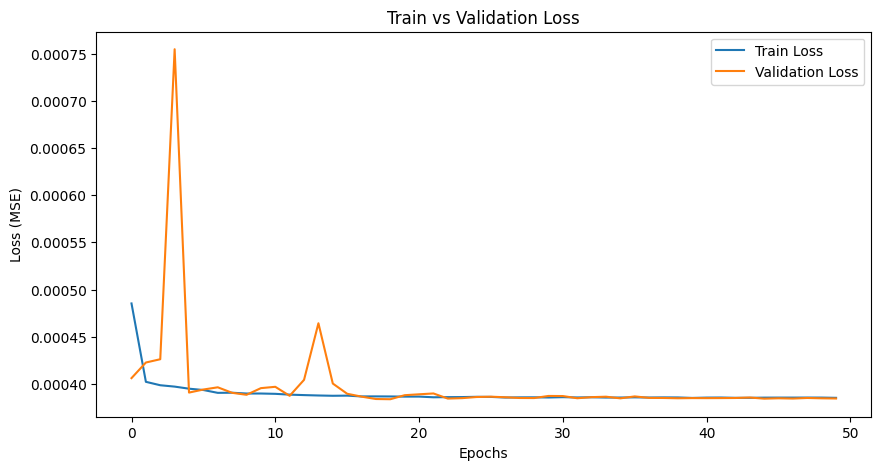

1830/1830 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step


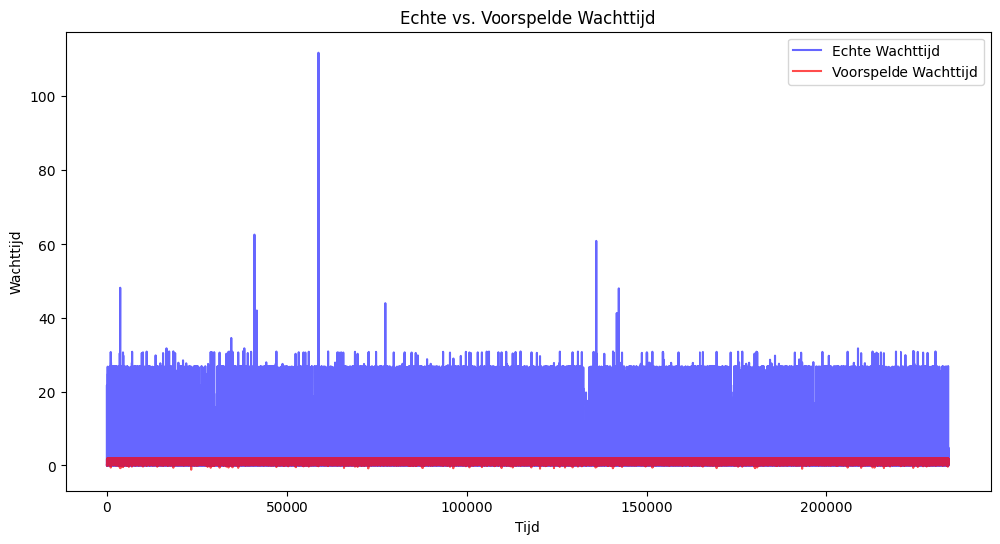

In [ ]:
#2 langer trainen
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import AdamW, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

#  Laad de tijdreeksdata in
df_wt = pd.read_csv("waiting_time_series_full.csv", parse_dates=["time:timestamp"])

#  Controleer en verwijder eventuele NaN of oneindige waarden
df_wt = df_wt.dropna()
df_wt = df_wt[np.isfinite(df_wt["waiting_time"])]

#  Normaliseer de wachttijdwaarden tussen 0 en 1
scaler = MinMaxScaler()
df_wt["waiting_time"] = scaler.fit_transform(df_wt[["waiting_time"]])

# Zet de data om naar numpy-array
data = df_wt["waiting_time"].values

#  Bepaal de window size
look_back = 10

#  Split de data in een train- en testset (80% trainen, 20% testen)
train_size = int(len(data) * 0.8)

#  Gebruik TimeseriesGenerator
train_generator = TimeseriesGenerator(data[:train_size], data[:train_size], length=look_back, batch_size=128)
test_generator = TimeseriesGenerator(data[train_size - look_back:], data[train_size - look_back:], length=look_back, batch_size=128)

# Model definitie
model = Sequential([
    LSTM(100, activation='relu', return_sequences=True, input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.2),  # Iets lagere dropout
    LSTM(50, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(1)
])

#  Optimizer aanpassen
optimizer = RMSprop(learning_rate=0.0003)

#  Compileer het model
model.compile(optimizer=optimizer, loss='mse')

#  Callbacks
#early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

#  Model trainen
history = model.fit(
    train_generator,
    epochs=50,
    validation_data=test_generator,
    verbose=1,
    callbacks=[lr_scheduler]
)

#  Plot de loss per epoch
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Train vs Validation Loss')
plt.legend()
plt.show()

#  Maak voorspellingen met het getrainde model
predictions = model.predict(test_generator)

#  De voorspellingen en echte waarden terugschalen naar originele waarden
predictions_rescaled = scaler.inverse_transform(predictions)
actual_values_rescaled = scaler.inverse_transform(data[train_size:].reshape(-1, 1))

#  Plot de voorspellingen vs. echte waarden
plt.figure(figsize=(12, 6))
plt.plot(actual_values_rescaled, label="Echte Wachttijd", color="blue", alpha=0.6)
plt.plot(predictions_rescaled, label="Voorspelde Wachttijd", color="red", alpha=0.7)
plt.xlabel("Tijd")
plt.ylabel("Wachttijd")
plt.title("Echte vs. Voorspelde Wachttijd")
plt.legend()
plt.show()

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7318/7318 ━━━━━━━━━━━━━━━━━━━━ 42s 5ms/step - loss: 6.4239e-04 - val_loss: 4.1875e-04 - learning_rate: 3.0000e-04
Epoch 2/100
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 3.9807e-04 - val_loss: 4.0214e-04 - learning_rate: 3.0000e-04
Epoch 3/100
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 4.0484e-04 - val_loss: 3.9934e-04 - learning_rate: 3.0000e-04
Epoch 4/100
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 4.0093e-04 - val_loss: 3.9855e-04 - learning_rate: 3.0000e-04
Epoch 5/100
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 3.9530e-04 - val_loss: 5.4907e-04 - learning_rate: 3.0000e-04
Epoch 6/100
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 4.0323e-04 - val_loss: 4.2022e-04 - learning_rate: 3.0000e-04
Epoch 7/100
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 3.9612e-04 - val_loss: 4.0589e-04 - learning_rate: 1.5000e-04
Epoch 8/100
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 3.8655e-04 - val_loss: 4.7383e-04 - learning_rate: 1.5000e-04
Epoc

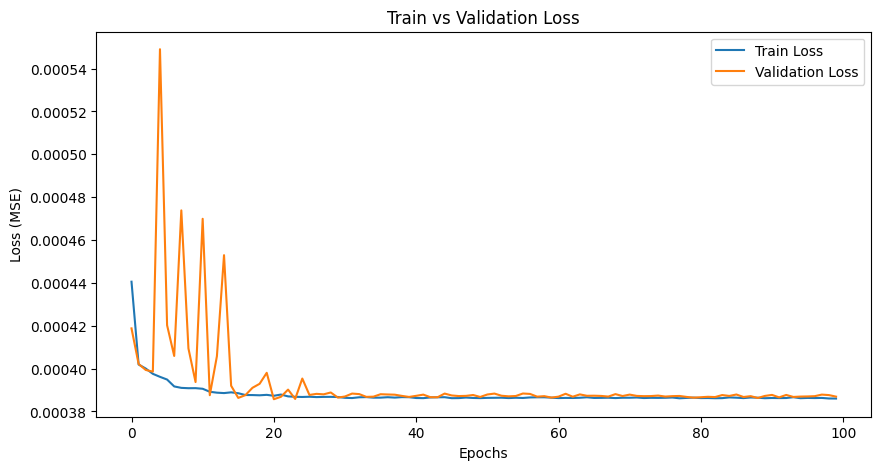

1830/1830 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step


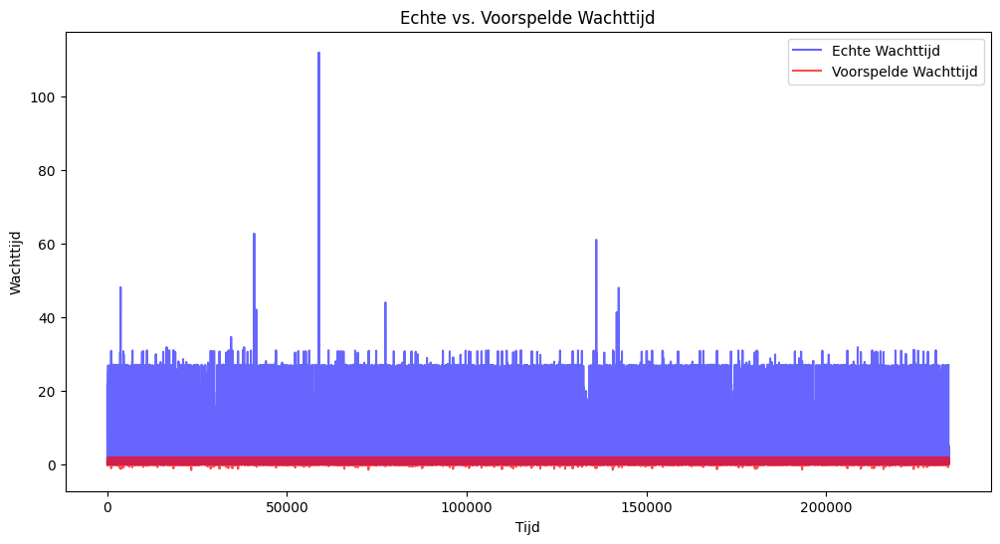

In [ ]:
#2 langer trainen
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import AdamW, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

#  Laad de tijdreeksdata in
df_wt = pd.read_csv("waiting_time_series_full.csv", parse_dates=["time:timestamp"])

#  Controleer en verwijder eventuele NaN of oneindige waarden
df_wt = df_wt.dropna()
df_wt = df_wt[np.isfinite(df_wt["waiting_time"])]

#  Normaliseer de wachttijdwaarden tussen 0 en 1
scaler = MinMaxScaler()
df_wt["waiting_time"] = scaler.fit_transform(df_wt[["waiting_time"]])

# Zet de data om naar numpy-array
data = df_wt["waiting_time"].values

#  Bepaal de window size
look_back = 10

#  Split de data in een train- en testset (80% trainen, 20% testen)
train_size = int(len(data) * 0.8)

#  Gebruik TimeseriesGenerator
train_generator = TimeseriesGenerator(data[:train_size], data[:train_size], length=look_back, batch_size=128)
test_generator = TimeseriesGenerator(data[train_size - look_back:], data[train_size - look_back:], length=look_back, batch_size=128)

# Model definitie
model = Sequential([
    LSTM(100, activation='relu', return_sequences=True, input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.2),  # Iets lagere dropout
    LSTM(50, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(1)
])

#  Optimizer aanpassen
optimizer = RMSprop(learning_rate=0.0003)

#  Compileer het model
model.compile(optimizer=optimizer, loss='mse')

#  Callbacks
#early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

#  Model trainen
history = model.fit(
    train_generator,
    epochs=100,
    validation_data=test_generator,
    verbose=1,
    callbacks=[lr_scheduler]
)

#  Plot de loss per epoch
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Train vs Validation Loss')
plt.legend()
plt.show()

#  Maak voorspellingen met het getrainde model
predictions = model.predict(test_generator)

#  De voorspellingen en echte waarden terugschalen naar originele waarden
predictions_rescaled = scaler.inverse_transform(predictions)
actual_values_rescaled = scaler.inverse_transform(data[train_size:].reshape(-1, 1))

#  Plot de voorspellingen vs. echte waarden
plt.figure(figsize=(12, 6))
plt.plot(actual_values_rescaled, label="Echte Wachttijd", color="blue", alpha=0.6)
plt.plot(predictions_rescaled, label="Voorspelde Wachttijd", color="red", alpha=0.7)
plt.xlabel("Tijd")
plt.ylabel("Wachttijd")
plt.title("Echte vs. Voorspelde Wachttijd")
plt.legend()
plt.show()

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7318/7318 ━━━━━━━━━━━━━━━━━━━━ 61s 7ms/step - loss: 0.0157 - val_loss: 4.0764e-04 - learning_rate: 3.0000e-04
Epoch 2/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 46s 6ms/step - loss: 4.3400e-04 - val_loss: 4.0931e-04 - learning_rate: 3.0000e-04
Epoch 3/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 46s 6ms/step - loss: 4.0235e-04 - val_loss: 4.0827e-04 - learning_rate: 3.0000e-04
Epoch 4/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 46s 6ms/step - loss: 4.0468e-04 - val_loss: 4.0464e-04 - learning_rate: 3.0000e-04
Epoch 5/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 46s 6ms/step - loss: 3.9715e-04 - val_loss: 3.8485e-04 - learning_rate: 3.0000e-04
Epoch 6/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 46s 6ms/step - loss: 3.8485e-04 - val_loss: 4.2894e-04 - learning_rate: 3.0000e-04
Epoch 7/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 46s 6ms/step - loss: 3.4399e-04 - val_loss: 3.5657e-04 - learning_rate: 1.5000e-04
Epoch 8/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 45s 6ms/step - loss: 3.1395e-04 - val_loss: 3.2732e-04 - learning_rate: 1.5000e-04
Epoch 9/50
7318

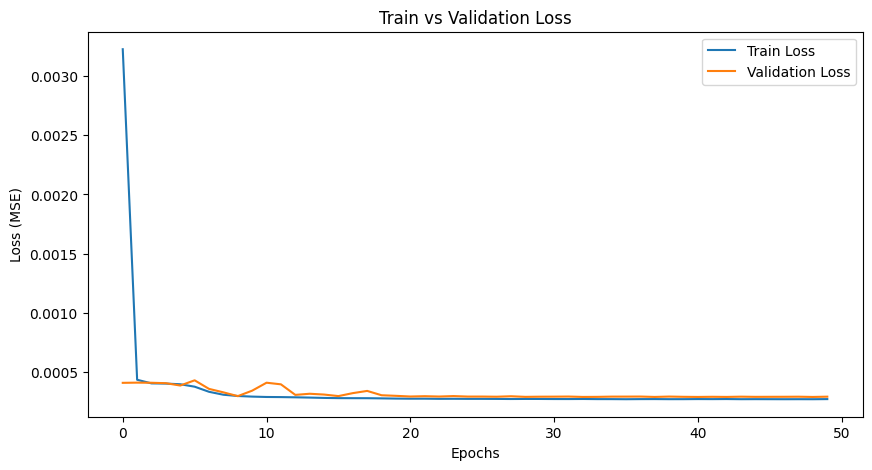

1830/1830 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step


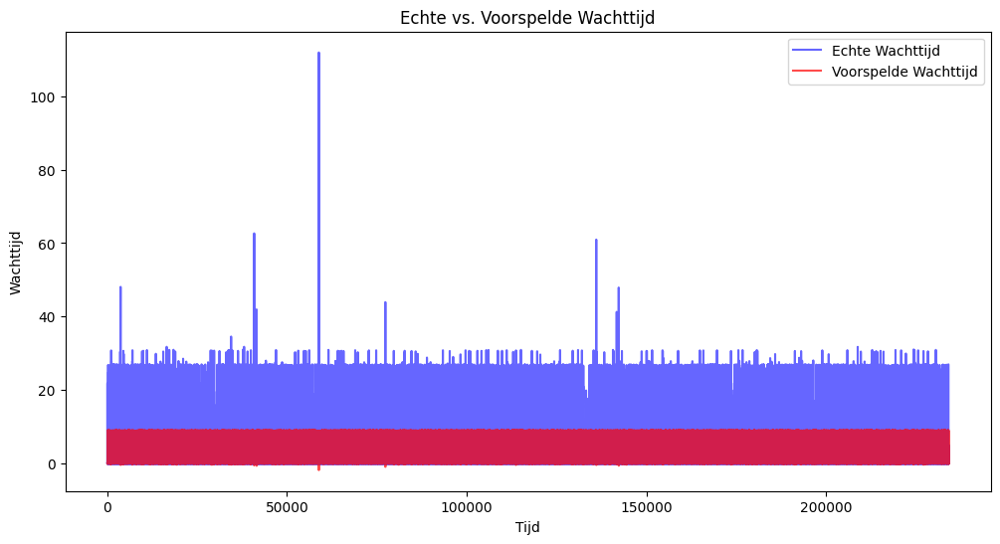

In [ ]:
#3, complexer model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

#  Laad de tijdreeksdata in
df_wt = pd.read_csv("waiting_time_series_full.csv", parse_dates=["time:timestamp"])

#  Controleer en verwijder eventuele NaN of oneindige waarden
df_wt = df_wt.dropna()
df_wt = df_wt[np.isfinite(df_wt["waiting_time"])]

#  Normaliseer de wachttijdwaarden tussen 0 en 1
scaler = MinMaxScaler()
df_wt["waiting_time"] = scaler.fit_transform(df_wt[["waiting_time"]])

# Zet de data om naar numpy-array
data = df_wt["waiting_time"].values

#  Bepaal de window size
look_back = 10

#  Split de data in een train- en testset (80% trainen, 20% testen)
train_size = int(len(data) * 0.8)

#  Gebruik TimeseriesGenerator
train_generator = TimeseriesGenerator(data[:train_size], data[:train_size], length=look_back, batch_size=128)
test_generator = TimeseriesGenerator(data[train_size - look_back:], data[train_size - look_back:], length=look_back, batch_size=128)

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Callbacks
lr_scheduler = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

# Nieuw verbeterd LSTM-model
model = Sequential([
    LSTM(150, activation='relu', return_sequences=True, input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.3),

    LSTM(100, activation='relu', return_sequences=True),
    BatchNormalization(),
    Dropout(0.3),

    LSTM(50, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(1)
])

# Compileren met initiële learning rate
model.compile(optimizer=Adam(learning_rate=0.0003), loss='mse')

# Trainen met ReduceLROnPlateau
history = model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1, callbacks=[lr_scheduler])

# Plot de loss per epoch
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Train vs Validation Loss')
plt.legend()
plt.show()


#  Maak voorspellingen met het getrainde model
predictions = model.predict(test_generator)

#  De voorspellingen en echte waarden terugschalen naar originele waarden
predictions_rescaled = scaler.inverse_transform(predictions)
actual_values_rescaled = scaler.inverse_transform(data[train_size:].reshape(-1, 1))

#  Plot de voorspellingen vs. echte waarden
plt.figure(figsize=(12, 6))
plt.plot(actual_values_rescaled, label="Echte Wachttijd", color="blue", alpha=0.6)
plt.plot(predictions_rescaled, label="Voorspelde Wachttijd", color="red", alpha=0.7)
plt.xlabel("Tijd")
plt.ylabel("Wachttijd")
plt.title("Echte vs. Voorspelde Wachttijd")
plt.legend()
plt.show()


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7318/7318 ━━━━━━━━━━━━━━━━━━━━ 50s 6ms/step - loss: 0.0029 - val_loss: 4.1952e-04 - learning_rate: 3.0000e-04
Epoch 2/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 43s 6ms/step - loss: 3.9714e-04 - val_loss: 4.1840e-04 - learning_rate: 3.0000e-04
Epoch 3/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 42s 6ms/step - loss: 3.9813e-04 - val_loss: 4.2154e-04 - learning_rate: 3.0000e-04
Epoch 4/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 42s 6ms/step - loss: 3.9393e-04 - val_loss: 4.1907e-04 - learning_rate: 3.0000e-04
Epoch 5/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 43s 6ms/step - loss: 4.0712e-04 - val_loss: 4.0618e-04 - learning_rate: 3.0000e-04
Epoch 6/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 42s 6ms/step - loss: 4.0525e-04 - val_loss: 4.2762e-04 - learning_rate: 3.0000e-04
Epoch 7/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 43s 6ms/step - loss: 3.9654e-04 - val_loss: 4.2095e-04 - learning_rate: 1.5000e-04
Epoch 8/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 42s 6ms/step - loss: 3.9239e-04 - val_loss: 4.1209e-04 - learning_rate: 1.5000e-04
Epoch 9/50
7318

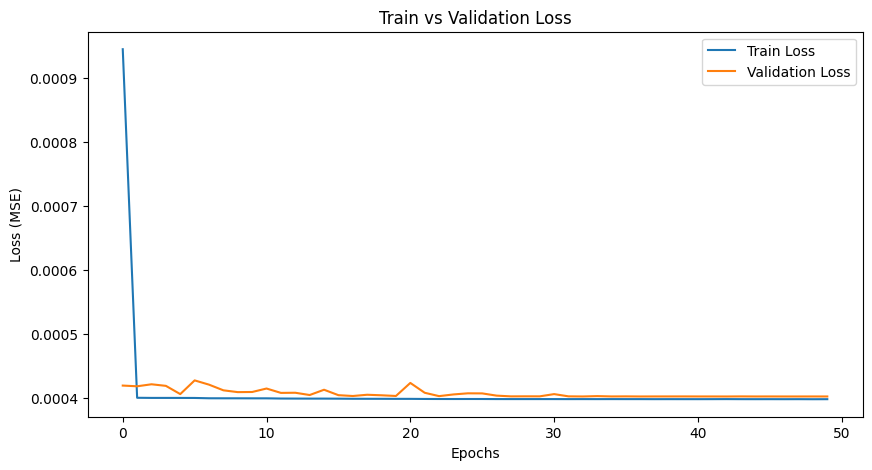

1830/1830 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step


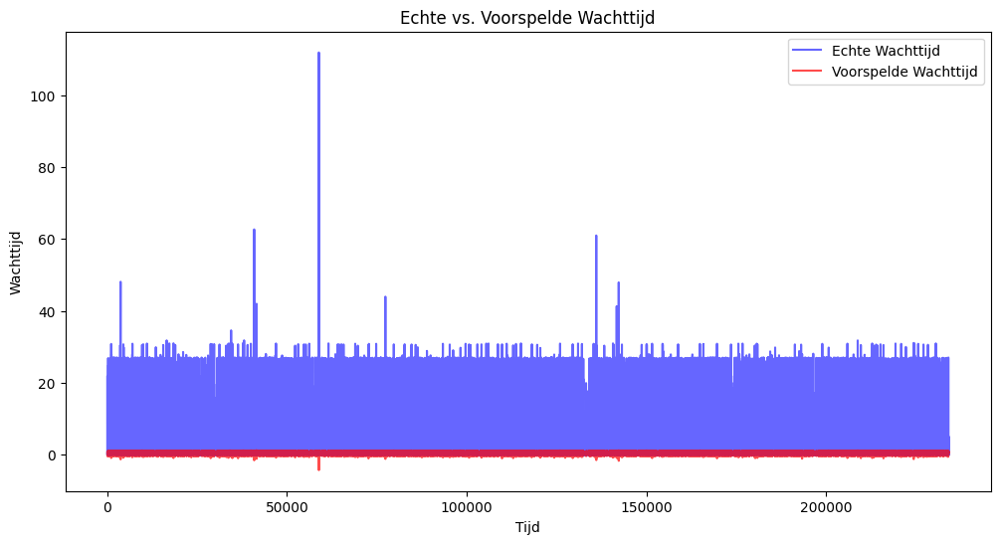

In [ ]:
#4 andere activeringsfunctie
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import AdamW, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

#  Laad de tijdreeksdata in
df_wt = pd.read_csv("waiting_time_series_full.csv", parse_dates=["time:timestamp"])

#  Controleer en verwijder eventuele NaN of oneindige waarden
df_wt = df_wt.dropna()
df_wt = df_wt[np.isfinite(df_wt["waiting_time"])]

#  Normaliseer de wachttijdwaarden tussen 0 en 1
scaler = MinMaxScaler()
df_wt["waiting_time"] = scaler.fit_transform(df_wt[["waiting_time"]])

# Zet de data om naar numpy-array
data = df_wt["waiting_time"].values

#  Bepaal de window size
look_back = 10

#  Split de data in een train- en testset (80% trainen, 20% testen)
train_size = int(len(data) * 0.8)

#  Gebruik TimeseriesGenerator
train_generator = TimeseriesGenerator(data[:train_size], data[:train_size], length=look_back, batch_size=128)
test_generator = TimeseriesGenerator(data[train_size - look_back:], data[train_size - look_back:], length=look_back, batch_size=128)

# Model definitie
model = Sequential([
    LSTM(100, activation='tanh', return_sequences=True, input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.2),  # Iets lagere dropout
    LSTM(50, activation='tanh'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(1)
])

#  Optimizer aanpassen
optimizer = RMSprop(learning_rate=0.0003)

#  Compileer het model
model.compile(optimizer=optimizer, loss='mse')

#  Callbacks
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

#  Model trainen
history = model.fit(
    train_generator,
    epochs=50,
    validation_data=test_generator,
    verbose=1,
    callbacks=[early_stopping, lr_scheduler]
)

#  Plot de loss per epoch
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Train vs Validation Loss')
plt.legend()
plt.show()

#  Maak voorspellingen met het getrainde model
predictions = model.predict(test_generator)

#  De voorspellingen en echte waarden terugschalen naar originele waarden
predictions_rescaled = scaler.inverse_transform(predictions)
actual_values_rescaled = scaler.inverse_transform(data[train_size:].reshape(-1, 1))

#  Plot de voorspellingen vs. echte waarden
plt.figure(figsize=(12, 6))
plt.plot(actual_values_rescaled, label="Echte Wachttijd", color="blue", alpha=0.6)
plt.plot(predictions_rescaled, label="Voorspelde Wachttijd", color="red", alpha=0.7)
plt.xlabel("Tijd")
plt.ylabel("Wachttijd")
plt.title("Echte vs. Voorspelde Wachttijd")
plt.legend()
plt.show()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
29269/29269 ━━━━━━━━━━━━━━━━━━━━ 124s 4ms/step - loss: 0.1045 - val_loss: 4.0360e-04 - learning_rate: 3.0000e-04
Epoch 2/50
29269/29269 ━━━━━━━━━━━━━━━━━━━━ 115s 4ms/step - loss: 3.9459e-04 - val_loss: 3.8932e-04 - learning_rate: 3.0000e-04
Epoch 3/50
29269/29269 ━━━━━━━━━━━━━━━━━━━━ 115s 4ms/step - loss: 3.8196e-04 - val_loss: 3.1451e-04 - learning_rate: 3.0000e-04
Epoch 4/50
29269/29269 ━━━━━━━━━━━━━━━━━━━━ 115s 4ms/step - loss: 3.3296e-04 - val_loss: 3.1142e-04 - learning_rate: 3.0000e-04
Epoch 5/50
29269/29269 ━━━━━━━━━━━━━━━━━━━━ 115s 4ms/step - loss: 3.1469e-04 - val_loss: 3.1199e-04 - learning_rate: 3.0000e-04
Epoch 6/50
29269/29269 ━━━━━━━━━━━━━━━━━━━━ 115s 4ms/step - loss: 3.0868e-04 - val_loss: 2.9416e-04 - learning_rate: 3.0000e-04
Epoch 7/50
29269/29269 ━━━━━━━━━━━━━━━━━━━━ 115s 4ms/step - loss: 3.0962e-04 - val_loss: 2.8673e-04 - learning_rate: 3.0000e-04
Epoch 8/50
29269/29269 ━━━━━━━━━━━━━━━━━━━━ 115s 4ms/step - loss: 3.0783e-04 - val_loss: 3.0387e-04 - learni

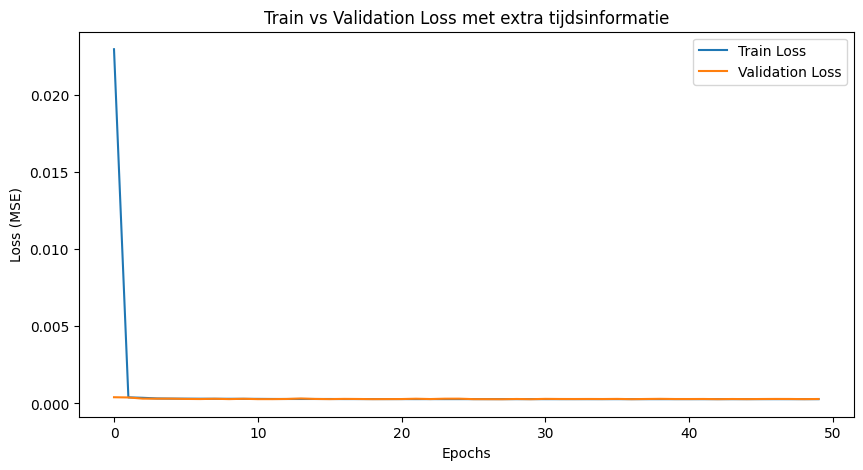

In [ ]:
#5 extra inputfeatures
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Laad de dataset
df_wt = pd.read_csv("waiting_time_series_full.csv", parse_dates=["time:timestamp"])

# Verwijder NaN en oneindige waarden
df_wt = df_wt.dropna()
df_wt = df_wt[np.isfinite(df_wt["waiting_time"])]

# Voeg tijdskenmerken toe
df_wt["hour"] = df_wt["time:timestamp"].dt.hour
df_wt["day_of_week"] = df_wt["time:timestamp"].dt.weekday  # Maandag = 0, Zondag = 6
df_wt["month"] = df_wt["time:timestamp"].dt.month
df_wt["is_weekend"] = df_wt["day_of_week"].apply(lambda x: 1 if x >= 5 else 0)  # Weekend = 1, Werkdag = 0

# Normaliseer de features
scaler = MinMaxScaler()
df_wt[["waiting_time", "hour", "day_of_week", "month", "is_weekend"]] = scaler.fit_transform(
    df_wt[["waiting_time", "hour", "day_of_week", "month", "is_weekend"]]
)

# Zet de data om naar numpy-array
data = df_wt[["waiting_time", "hour", "day_of_week", "month", "is_weekend"]].values

# Bepaal de window size
look_back = 10

# Maak input en target sets
X, y = [], []
for i in range(len(data) - look_back):
    X.append(data[i : i + look_back])  # Neem 'look_back' aantal rijen als input
    y.append(data[i + look_back, 0])   # Wachttijd als target (eerste kolom)

X, y = np.array(X), np.array(y)

# Train/test split
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Bouw het LSTM-model met extra features
model = Sequential([
    LSTM(100, activation='relu', return_sequences=True, input_shape=(look_back, X.shape[2])),
    BatchNormalization(),
    Dropout(0.3),

    LSTM(50, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(1)
])

# Compileren
model.compile(optimizer=Adam(learning_rate=0.0003), loss='mse')

# Callbacks
lr_scheduler = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

# Trainen
history = model.fit(X_train, y_train, epochs=50, validation_data=(X_test, y_test), verbose=1, callbacks=[lr_scheduler])

# Plot de loss
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Train vs Validation Loss met extra tijdsinformatie')
plt.legend()
plt.show()


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7318/7318 ━━━━━━━━━━━━━━━━━━━━ 54s 7ms/step - loss: 0.0011 - val_loss: 4.0556e-04 - learning_rate: 3.0000e-04
Epoch 2/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 46s 6ms/step - loss: 4.2135e-04 - val_loss: 8.1343e-04 - learning_rate: 3.0000e-04
Epoch 3/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 45s 6ms/step - loss: 4.0491e-04 - val_loss: 3.9724e-04 - learning_rate: 3.0000e-04
Epoch 4/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 46s 6ms/step - loss: 4.0248e-04 - val_loss: 4.0995e-04 - learning_rate: 3.0000e-04
Epoch 5/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 45s 6ms/step - loss: 4.0056e-04 - val_loss: 3.9653e-04 - learning_rate: 3.0000e-04
Epoch 6/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 45s 6ms/step - loss: 3.9449e-04 - val_loss: 3.9647e-04 - learning_rate: 3.0000e-04
Epoch 7/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 45s 6ms/step - loss: 3.9503e-04 - val_loss: 3.9098e-04 - learning_rate: 1.5000e-04
Epoch 8/50
7318/7318 ━━━━━━━━━━━━━━━━━━━━ 45s 6ms/step - loss: 3.8578e-04 - val_loss: 3.9029e-04 - learning_rate: 1.5000e-04
Epoch 9/50
7318

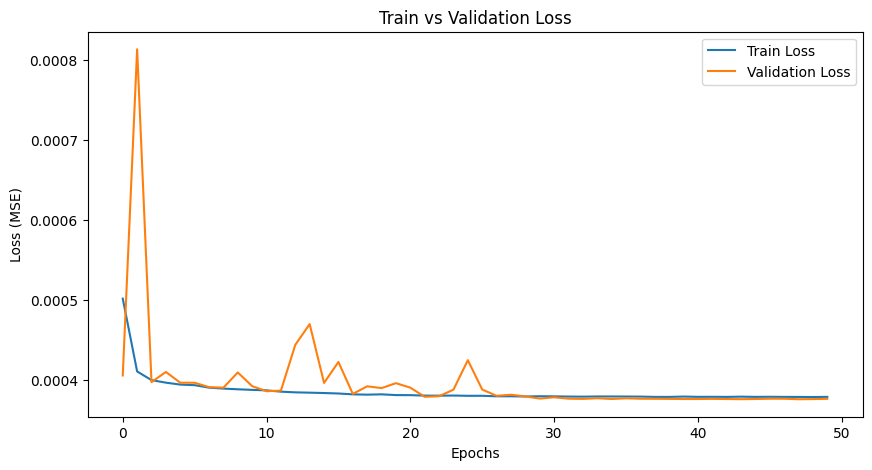

1830/1830 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step


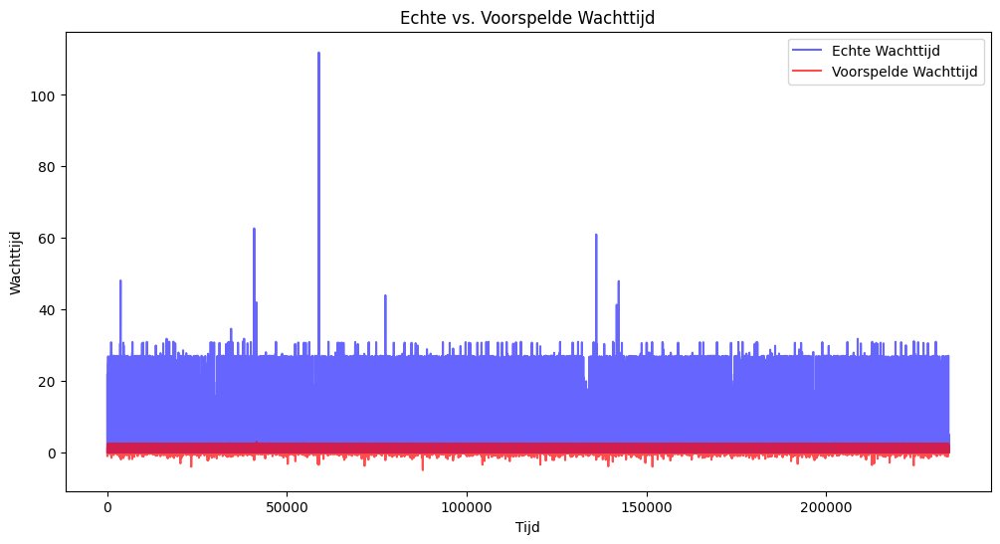

In [ ]:
#6 langere lookback
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import AdamW, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

#  Laad de tijdreeksdata in
df_wt = pd.read_csv("waiting_time_series_full.csv", parse_dates=["time:timestamp"])

#  Controleer en verwijder eventuele NaN of oneindige waarden
df_wt = df_wt.dropna()
df_wt = df_wt[np.isfinite(df_wt["waiting_time"])]

#  Normaliseer de wachttijdwaarden tussen 0 en 1
scaler = MinMaxScaler()
df_wt["waiting_time"] = scaler.fit_transform(df_wt[["waiting_time"]])

# Zet de data om naar numpy-array
data = df_wt["waiting_time"].values

#  Bepaal de window size
look_back = 20

#  Split de data in een train- en testset (80% trainen, 20% testen)
train_size = int(len(data) * 0.8)

#  Gebruik TimeseriesGenerator
train_generator = TimeseriesGenerator(data[:train_size], data[:train_size], length=look_back, batch_size=128)
test_generator = TimeseriesGenerator(data[train_size - look_back:], data[train_size - look_back:], length=look_back, batch_size=128)

# Model definitie
model = Sequential([
    LSTM(100, activation='relu', return_sequences=True, input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.2),  # Iets lagere dropout
    LSTM(50, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(1)
])

#  Optimizer aanpassen
optimizer = RMSprop(learning_rate=0.0003)

#  Compileer het model
model.compile(optimizer=optimizer, loss='mse')

#  Callbacks
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

#  Model trainen
history = model.fit(
    train_generator,
    epochs=50,
    validation_data=test_generator,
    verbose=1,
    callbacks=[early_stopping, lr_scheduler]
)

#  Plot de loss per epoch
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Train vs Validation Loss')
plt.legend()
plt.show()

#  Maak voorspellingen met het getrainde model
predictions = model.predict(test_generator)

#  De voorspellingen en echte waarden terugschalen naar originele waarden
predictions_rescaled = scaler.inverse_transform(predictions)
actual_values_rescaled = scaler.inverse_transform(data[train_size:].reshape(-1, 1))

#  Plot de voorspellingen vs. echte waarden
plt.figure(figsize=(12, 6))
plt.plot(actual_values_rescaled, label="Echte Wachttijd", color="blue", alpha=0.6)
plt.plot(predictions_rescaled, label="Voorspelde Wachttijd", color="red", alpha=0.7)
plt.xlabel("Tijd")
plt.ylabel("Wachttijd")
plt.title("Echte vs. Voorspelde Wachttijd")
plt.legend()
plt.show()

<ipython-input-9-855479234b5d>:28: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_wt.fillna(method="bfill", inplace=True)  # Backfill voor NaN


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


14635/14635 ━━━━━━━━━━━━━━━━━━━━ 67s 4ms/step - loss: 0.0018 - val_loss: 4.0093e-04
Epoch 2/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 3.9357e-04 - val_loss: 3.6021e-04
Epoch 3/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 3.5069e-04 - val_loss: 3.1390e-04
Epoch 4/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 3.1032e-04 - val_loss: 3.1723e-04
Epoch 5/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 2.9643e-04 - val_loss: 3.3433e-04
Epoch 6/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 2.8022e-04 - val_loss: 3.1305e-04
Epoch 7/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 2.7330e-04 - val_loss: 3.6490e-04
Epoch 8/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 2.5981e-04 - val_loss: 3.1818e-04
Epoch 9/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 2.6426e-04 - val_loss: 3.8091e-04
Epoch 10/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 2.5151e-04 - val_loss: 3.4465e-04
Epoch 11/50
14635/14635 

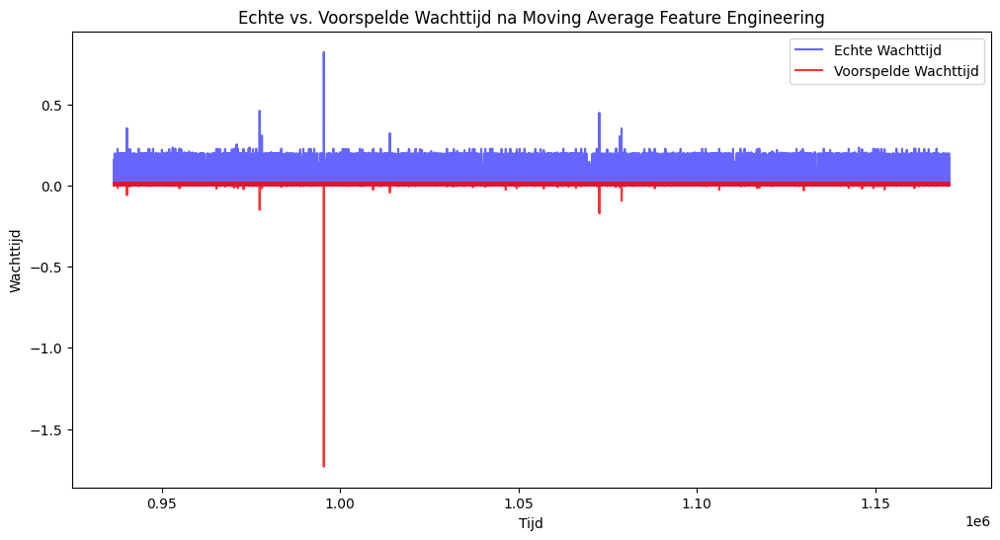

In [ ]:
# Stap 1: Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

# Stap 2: Laad en preproces de dataset
df_wt = pd.read_csv("waiting_time_series_full.csv", parse_dates=["time:timestamp"])

# Verwijder NaN of oneindige waarden
df_wt.dropna(inplace=True)
df_wt = df_wt[np.isfinite(df_wt["waiting_time"])]

# Stap 3: Normaliseer de wachttijd
scaler = MinMaxScaler()
df_wt["waiting_time"] = scaler.fit_transform(df_wt[["waiting_time"]])

# Stap 4: Voeg moving average features toe
df_wt["waiting_time_ma3"] = df_wt["waiting_time"].rolling(window=7).mean()
df_wt["waiting_time_ma7"] = df_wt["waiting_time"].rolling(window=14).mean()
df_wt["waiting_time_ma14"] = df_wt["waiting_time"].rolling(window=17).mean()

# Vervang NaN-waarden
df_wt.fillna(method="bfill", inplace=True)  # Backfill voor NaN

# Stap 5: Zet de data om naar numpy-array
features = ["waiting_time", "waiting_time_ma3", "waiting_time_ma7", "waiting_time_ma14"]
data = df_wt[features].values

# Stap 6: Maak training en test sets
look_back = 10  # Hoeveel tijdstappen het model gebruikt
train_size = int(len(data) * 0.8)

train_generator = TimeseriesGenerator(data[:train_size], data[:train_size, 0], length=look_back, batch_size=64)
test_generator = TimeseriesGenerator(data[train_size - look_back:], data[train_size - look_back:, 0], length=look_back, batch_size=64)

# Stap 7: Bouw het LSTM-model
model = Sequential([
    LSTM(100, activation='relu', return_sequences=True, input_shape=(look_back, len(features))),
    BatchNormalization(),
    Dropout(0.3),
    LSTM(50, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(1)
])

model.compile(optimizer=Adam(learning_rate=0.0003), loss='mse')

# Stap 8: Train het model
history = model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1)

# Stap 9: Maak voorspellingen
predictions = model.predict(test_generator)

# Stap 10: Plot de echte vs voorspelde wachttijden
plt.figure(figsize=(12, 6))
plt.plot(df_wt.index[train_size:], df_wt["waiting_time"][train_size:], label="Echte Wachttijd", color="blue", alpha=0.6)
plt.plot(df_wt.index[train_size:], predictions, label="Voorspelde Wachttijd", color="red", alpha=0.8)
plt.xlabel("Tijd")
plt.ylabel("Wachttijd")
plt.title("Echte vs. Voorspelde Wachttijd na Moving Average Feature Engineering")
plt.legend()
plt.show()


3659/3659 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step


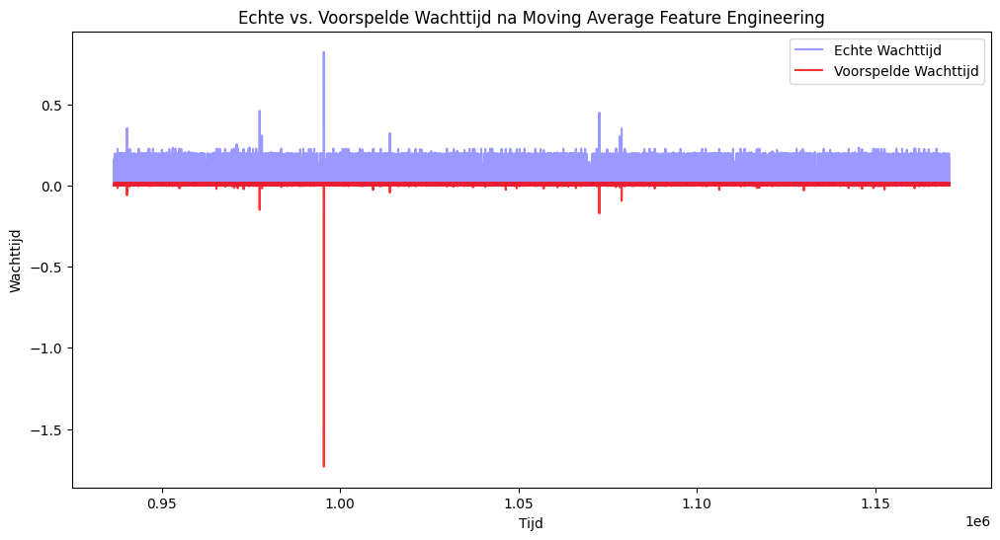

In [ ]:
# Stap 9: Maak voorspellingen
predictions = model.predict(test_generator)

# Stap 10: Plot de echte vs voorspelde wachttijden
plt.figure(figsize=(12, 6))
plt.plot(df_wt.index[train_size:], df_wt["waiting_time"][train_size:], label="Echte Wachttijd", color="blue", alpha=0.4)
plt.plot(df_wt.index[train_size:], predictions, label="Voorspelde Wachttijd", color="red", alpha=0.8)
plt.xlabel("Tijd")
plt.ylabel("Wachttijd")
plt.title("Echte vs. Voorspelde Wachttijd na Moving Average Feature Engineering")
plt.legend()
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


14635/14635 ━━━━━━━━━━━━━━━━━━━━ 67s 4ms/step - loss: 0.0021 - val_loss: 1.7254e-04 - learning_rate: 3.0000e-04
Epoch 2/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 3.1561e-04 - val_loss: 1.3146e-04 - learning_rate: 3.0000e-04
Epoch 3/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 2.8088e-04 - val_loss: 1.1315e-04 - learning_rate: 3.0000e-04
Epoch 4/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 58s 4ms/step - loss: 2.7456e-04 - val_loss: 1.3758e-04 - learning_rate: 3.0000e-04
Epoch 5/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 2.5050e-04 - val_loss: 3.6227e-04 - learning_rate: 3.0000e-04
Epoch 6/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 58s 4ms/step - loss: 2.5278e-04 - val_loss: 1.1414e-04 - learning_rate: 3.0000e-04
Epoch 7/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 2.4014e-04 - val_loss: 1.3888e-04 - learning_rate: 1.5000e-04
Epoch 8/50
14635/14635 ━━━━━━━━━━━━━━━━━━━━ 57s 4ms/step - loss: 2.3363e-04 - val_loss: 1.1393e-04 - learning_rate: 1.5000e-04

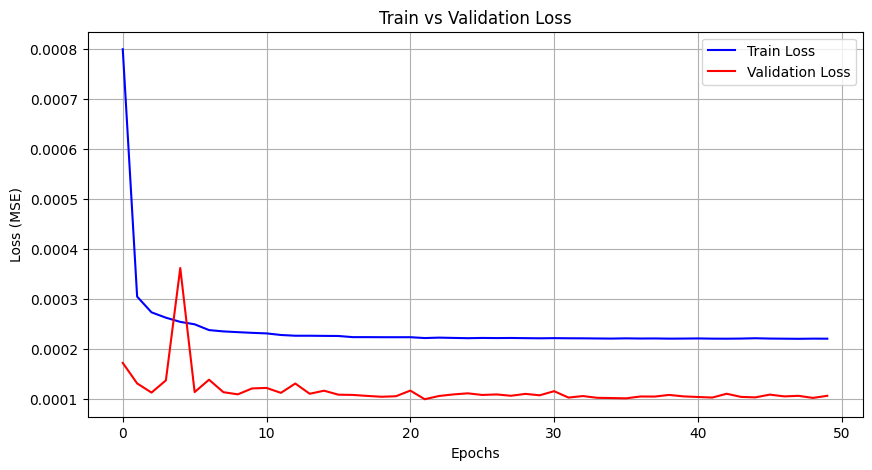

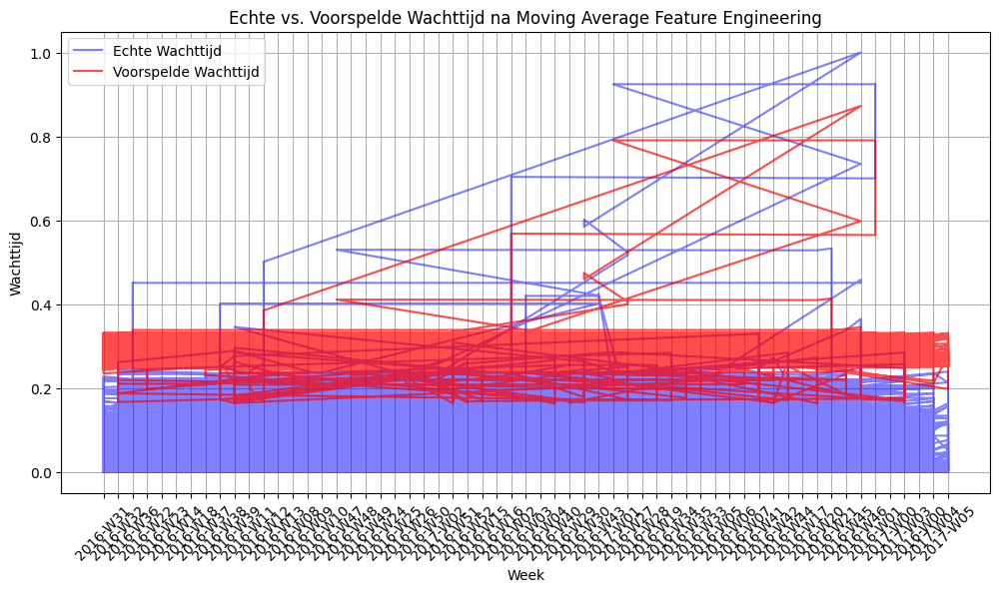

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

# 1. DATA INLADEN & VOORBEREIDEN
df_wt = pd.read_csv("waiting_time_series_full.csv", parse_dates=["time:timestamp"])
df_wt = df_wt.dropna()  # Verwijder NaN
df_wt = df_wt[np.isfinite(df_wt["waiting_time"])]  # Verwijder oneindige waarden

# 2. MOVING AVERAGE TOEVOEGEN (Gladmaken)
df_wt["waiting_time_ma"] = df_wt["waiting_time"].rolling(window=10, min_periods=1).mean()

# 3. NORMALISATIE
scaler = MinMaxScaler()
df_wt["waiting_time_ma"] = scaler.fit_transform(df_wt[["waiting_time_ma"]])

#  4. TIJDSTEMPELS OMZETTEN NAAR WEKEN VOOR PLOT
df_wt["week"] = df_wt["time:timestamp"].dt.strftime('%Y-W%W')

# 5. TRAIN & TEST SPLIT
data = df_wt["waiting_time_ma"].values
look_back = 10
train_size = int(len(data) * 0.8)

train_generator = TimeseriesGenerator(data[:train_size], data[:train_size], length=look_back, batch_size=64)
test_generator = TimeseriesGenerator(data[train_size - look_back:], data[train_size - look_back:], length=look_back, batch_size=64)

# 6. LSTM MODEL
model = Sequential([
    LSTM(100, activation='relu', return_sequences=True, input_shape=(look_back, 1)),
    BatchNormalization(),
    Dropout(0.3),
    LSTM(50, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(1)
])

model.compile(optimizer=Adam(learning_rate=0.0003), loss='mse')

#  7. LEARNING RATE SCHEDULER
lr_scheduler = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

# 8. MODEL TRAINEN
history = model.fit(train_generator, epochs=50, validation_data=test_generator, verbose=1, callbacks=[lr_scheduler])

#  9. PREDICTIES MAKEN
predicted_values = model.predict(data.reshape(-1, 1))

#  10. PLOT TRAINING LOSS (MSE)
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='red')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Train vs Validation Loss')
plt.legend()
plt.grid()
plt.show()

#  11. PLOT ECHTE VS. VOORSPELDE WAARDEN MET WEKEN OP X-AS
plt.figure(figsize=(12, 6))
plt.plot(df_wt["week"], df_wt["waiting_time_ma"], label='Echte Wachttijd', color='blue', alpha=0.5)
plt.plot(df_wt["week"], predicted_values, label='Voorspelde Wachttijd', color='red', alpha=0.7)

plt.xticks(rotation=45)  # Draai de weeklabels voor betere leesbaarheid
plt.xlabel('Week')
plt.ylabel('Wachttijd')
plt.title('Echte vs. Voorspelde Wachttijd na Moving Average Feature Engineering')
plt.legend()
plt.grid()
plt.show()


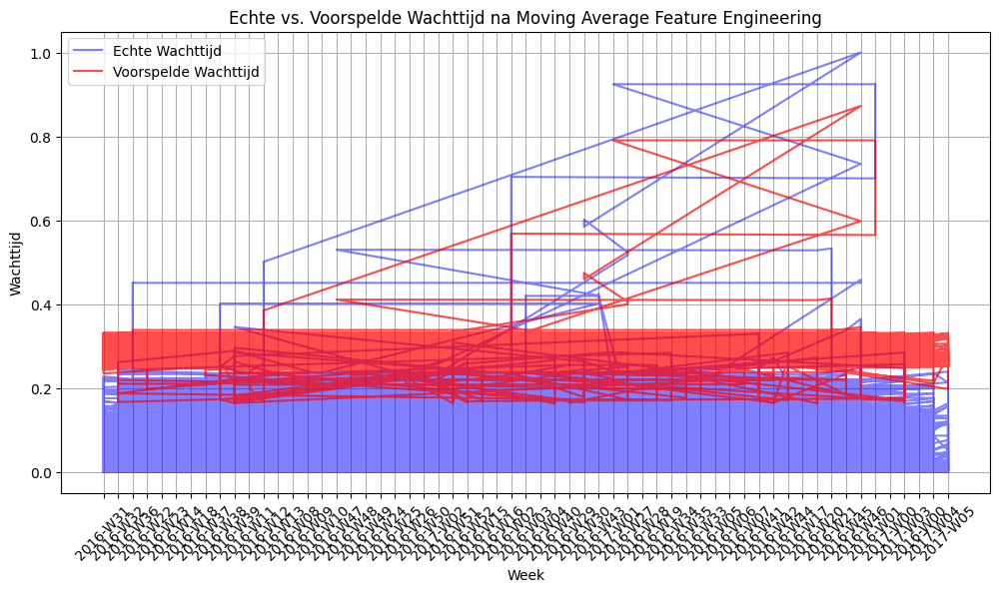

In [ ]:
#  11. PLOT ECHTE VS. VOORSPELDE WAARDEN MET WEKEN OP X-AS
plt.figure(figsize=(12, 6))
plt.plot(df_wt["week"], df_wt["waiting_time_ma"], label='Echte Wachttijd', color='blue', alpha=0.5)
plt.plot(df_wt["week"], predicted_values, label='Voorspelde Wachttijd', color='red', alpha=0.7)

plt.xticks(rotation=45)  # Draai de weeklabels voor betere leesbaarheid
plt.xlabel('Week')
plt.ylabel('Wachttijd')
plt.title('Echte vs. Voorspelde Wachttijd na Moving Average Feature Engineering')
plt.legend()
plt.grid()
plt.show()

#Predicties met ARIMA

In [ ]:
!pip install pmdarima


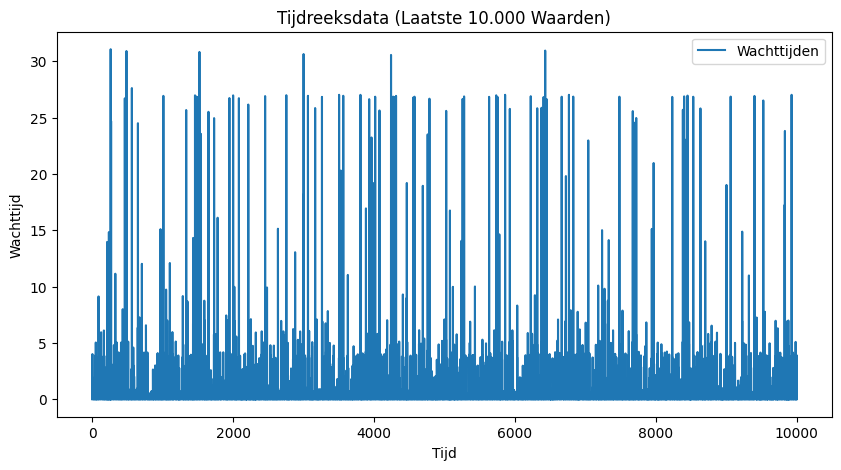

ADF Test Statistic: -18.497974186088687
ADF P-waarde: 2.1224488333492455e-30
→ Data is waarschijnlijk stationair (p < 0.05)
KPSS Test Statistic: 0.13270933129373225
KPSS P-waarde: 0.1
→ Data is waarschijnlijk stationair (p >= 0.05)
→ Geen differencing nodig.


<ipython-input-4-df06199c60ba>:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(data_subset, regression='c', nlags="auto")


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller, kpss

# 1. Laad de dataset
df_wt = pd.read_csv("waiting_time_series_full.csv", parse_dates=["time:timestamp"])

# 2. Verwijder NaN en ongeldige waarden
df_wt = df_wt.dropna()
df_wt = df_wt[np.isfinite(df_wt["waiting_time"])]

# 3. Zet de tijdreeks om naar een numpy-array
data = df_wt["waiting_time"].values

# 4. Neem een subset (bij grote datasets om RAM te besparen)
subset_size = min(10000, len(data))  # Pak max 10.000 rijen
data_subset = data[-subset_size:]  # Pak de laatste 'subset_size' rijen

# 5. Plot de data om trends of seizoenspatronen te bekijken
plt.figure(figsize=(10,5))
plt.plot(data_subset, label="Wachttijden")
plt.title("Tijdreeksdata (Laatste 10.000 Waarden)")
plt.xlabel("Tijd")
plt.ylabel("Wachttijd")
plt.legend()
plt.show()

# 6. ADF-test (Stationariteitstest)
adf_result = adfuller(data_subset)
print(f"ADF Test Statistic: {adf_result[0]}")
print(f"ADF P-waarde: {adf_result[1]}")
if adf_result[1] < 0.05:
    print("→ Data is waarschijnlijk stationair (p < 0.05)")
else:
    print("→ Data is NIET stationair (p >= 0.05), overweeg differencing.")

# 7. KPSS-test (Extra controle)
from statsmodels.tsa.stattools import kpss
kpss_result = kpss(data_subset, regression='c', nlags="auto")
print(f"KPSS Test Statistic: {kpss_result[0]}")
print(f"KPSS P-waarde: {kpss_result[1]}")
if kpss_result[1] < 0.05:
    print("→ Data is waarschijnlijk NIET stationair (p < 0.05)")
else:
    print("→ Data is waarschijnlijk stationair (p >= 0.05)")

# 8. Differencing toepassen als data niet stationair is
if adf_result[1] >= 0.05:
    differenced_data = np.diff(data_subset)  # Eerste orde differencing
    plt.figure(figsize=(10,5))
    plt.plot(differenced_data, label="Gedifferentieerde Data")
    plt.title("Tijdreeks na Differencing (Stationair maken)")
    plt.xlabel("Tijd")
    plt.ylabel("Verschil in Wachttijd")
    plt.legend()
    plt.show()
    print("→ Differencing toegepast, data zou nu stationair moeten zijn.")
else:
    print("→ Geen differencing nodig.")


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
import pmdarima as pm  # Voor Auto-ARIMA

# 1. Laad de dataset
df_wt = pd.read_csv("waiting_time_series_full.csv", parse_dates=["time:timestamp"])
df_wt = df_wt.dropna()  # Verwijder NaN
df_wt = df_wt[np.isfinite(df_wt["waiting_time"])]  # Verwijder oneindige waarden

# 2. Zet de tijdreeks om naar een numpy-array
data = df_wt["waiting_time"].values

# 3. Neem een subset om RAM te besparen
#subset_size = min(10000, len(data))
#data_subset = data[-subset_size:]

# 4. Train/Test split (80% train, 20% test)
train_size = int(len(data) * 0.8)
train, test = data[:train_size], data[train_size:]

# 5. Gebruik Auto-ARIMA om de beste (p, d, q) parameters te vinden
auto_arima_model = pm.auto_arima(train, seasonal=False, stepwise=True, suppress_warnings=True)
best_p, best_d, best_q = auto_arima_model.order
print(f"Beste ARIMA-parameters gevonden: (p, d, q) = ({best_p}, {best_d}, {best_q})")

# 6. Train het ARIMA-model met de beste parameters
model = ARIMA(train, order=(best_p, best_d, best_q))
model_fit = model.fit()

# 7. Maak voorspellingen
forecast = model_fit.forecast(steps=len(test))

# 8. Plot de resultaten
plt.figure(figsize=(12,6))
plt.plot(data_subset, label="Echte Data", color="blue")
plt.axvline(x=train_size, color="black", linestyle="--", label="Train/Test Split")
plt.plot(range(train_size, len(data_subset)), forecast, label="ARIMA Voorspellingen", color="red")
plt.title("ARIMA Voorspellingen vs. Werkelijke Data")
plt.xlabel("Tijd")
plt.ylabel("Wachttijd")
plt.legend()
plt.show()

# 9. Bereken de Mean Squared Error (MSE)
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test, forecast)
print(f"Mean Squared Error (MSE) van ARIMA: {mse:.6f}")


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

KeyboardInterrupt: 